# Analyse Descriptive des Données Météorologiques ERA5

### 1. Introduction : 
Ce notebook présente une analyse descriptive des conditions météorologiques (données ERA5) associées aux incendies majeurs en Nouvelle-Aquitaine et en Provence-Alpes-Côte d'Azur (PACA).  
Les données ont été extraites à l'échelle horaire, incluant l'heure de l'incendie ainsi que les heures précédentes et suivantes, pour les événements les plus significatifs.

#### a. Objectifs : 
- Identifier les conditions météorologiques critiques associées aux incendies majeurs
- Comparer les profils météorologiques entre les deux régions (Nouvelle-Aquitaine vs PACA)
- Analyser les interactions entre variables météorologiques (température, vent, humidité)
- Détecter des seuils critiques pour les variables clés
- Fournir une base analytique pour la prévention et l'anticipation des risques incendie

#### b. Variables Clés : 
| Variable | Unité | Description | Pertinence Incendie |
|----------|-------|-------------|---------------------|
| `temperature_air_c` | °C | Température à 2m du sol | Influence l'évaporation et la sécheresse |
| `vent_vitesse` | m/s | Vitesse du vent combinée (u10/v10) | Propagation des incendies |
| `vent_direction` | degrés | Direction du vent | Orientation de la propagation |
| `humidite_sol_surface_m3m3` | m³/m³ | Humidité du sol en surface | Indicateur de sécheresse |
| `precipitations_mm` | mm | Cumul horaire de précipitation | Réduction du risque feu |
| `rayonnement_solaire_jm2` | J/m² | Rayonnement solaire global | Séchage de la végétation |
| `evaporation_potentielle_mm` | mm | Évaporation potentielle | Stress hydrique végétation |

#### c. Méthodologie : 
1. **Préparation des données** :
   - Nettoyage et vérification de la qualité
   - Calcul de variables dérivées (vitesse/direction vent)
   - Découpage temporel (saison, heure, période jour/nuit)

2. **Analyse descriptive** :
   - Statistiques univariées (distribution, extrêmes)
   - Analyses temporelles (variations saisonnières/horaires)
   - Corrélations entre variables

3. **Approche comparative** :
   - Comparaison inter-régionale (PACA vs Nouvelle-Aquitaine)
   - Analyse des spécificités régionales

4. **Visualisation** :
   - Graphiques multi-panels pour synthèse visuelle
   - Représentations adaptées aux données météorologiques

#### d. Utilité : 
Cette analyse permet de :
- **Comprendre** les conditions météorologiques propices aux incendies
- **Anticiper** les périodes à risque accru
- **Affiner** les modèles de prédiction du risque incendie
- **Adapter** les stratégies de prévention par région
- **Sensibiliser** aux interactions climat/feux de forêt

### 2. Chargement des bibliothèques Python

Nous importons les bibliothèques nécessaires à l’analyse et à la visualisation :

In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from windrose import WindroseAxes
import calendar
import warnings
import os
from matplotlib.gridspec import GridSpec
from typing import Tuple, Dict, Union, Optional
from tabulate import tabulate 
import statsmodels.api as sm

### 3. Chargement des fichiers météo ERA5 (format CSV)

-   `donnees_meteo_ERA5_NA.csv` (Nouvelle-Aquitaine)
-   `donnees_meteo_ERA5_PACA.csv` (PACA)

In [43]:
df_na = pd.read_csv(r"C:\Users\User\OneDrive - Ministere de l'Enseignement Superieur et de la Recherche Scientifique\projet_incendies\outputs\intermediaires\Analyse\incendies_era5_nettoyes_na.csv", sep=";", encoding="utf-8-sig")
df_paca = pd.read_csv(r"C:\Users\User\OneDrive - Ministere de l'Enseignement Superieur et de la Recherche Scientifique\projet_incendies\outputs\intermediaires\Analyse\incendies_era5_nettoyes_paca.csv", sep=";", encoding="utf-8-sig")


### 4. Configuration des dossiers de sortie et fonction de sauvegarde des figures

Pour assurer une organisation claire des résultats graphiques issus de l’analyse descriptive, une structure de dossiers est automatiquement créée :

-   `era5_paca` : contient les figures liées à la région Provence-Alpes-Côte d’Azur (PACA)
-   `era5_na` : contient les figures pour la Nouvelle-Aquitaine (NA)
-   `comparaison_era5_PACA_vs_Nouvelle-Aquitaine` : regroupe les figures comparatives entre les deux régions

Une fonction utilitaire nommée `save_and_show_figure` a été définie pour standardiser l’enregistrement des visualisations. 
Elle permet d’**afficher** une figure et de l’**enregistrer automatiquement** dans le répertoire approprié, selon la région spécifiée.

Cette fonction sera appelée à la fin de chaque fonction d’analyse pour centraliser et automatiser la sauvegarde des graphiques générés.

In [44]:
BASE_PATH = r"C:\Users\User\OneDrive - Ministere de l'Enseignement Superieur et de la Recherche Scientifique\projet_incendies\outputs\intermediaires\Analyse\graphe_analyse_desciptive"
PATHS = {
    'paca': os.path.join(BASE_PATH, 'era5_paca'),
    'na': os.path.join(BASE_PATH, 'era5_na'),
    'comparison': os.path.join(BASE_PATH, 'comparaison_era5_PACA_vs_Nouvelle-Aquitaine')
}

# Création des dossiers
for path in PATHS.values():
    os.makedirs(path, exist_ok=True)

def save_and_show_figure(fig: plt.Figure, region: str, filename: str) -> None:
    """Affiche et sauvegarde une figure"""
    plt.show()
    path = PATHS[region.lower()] if region.lower() in ['paca', 'na'] else PATHS['comparison']
    full_path = os.path.join(path, f"{filename}.png")
    fig.savefig(full_path, dpi=300, bbox_inches='tight')
    plt.close(fig)

### 5. Configuration de l’environnement et préparation des données

Avant de commencer l’analyse descriptive, nous configurons l’environnement Python afin de garantir une visualisation cohérente et lisible, tout en supprimant les avertissements inutiles.

### a. Configuration matplotlib et seaborn

Nous appliquons un style global (`seaborn-darkgrid`) et ajustons la taille des figures, la taille des polices, les couleurs, et les options de tracé pour améliorer la qualité visuelle des graphiques.

### b. Préparation des données

Une fonction `preparer_dataframe` est utilisée pour enrichir les données météorologiques en extrayant les composantes temporelles (année, mois, jour, heure, période de la journée). Elle calcule également :

-   **La vitesse du vent** à partir des composantes u et v.
-   **La direction du vent** en degrés.

Cette préparation permet de faciliter l’analyse des tendances diurnes, saisonnières et annuelles, ainsi que la visualisation des effets des paramètres météorologiques au moment des incendies.

Les jeux de données pour les régions PACA et Nouvelle-Aquitaine sont ensuite préparés à l’aide de cette fonction.

In [45]:
# Configuration initiale
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
plt.close('all')

def configure_environment():
    """Configure l'environnement de visualisation"""
    pd.set_option('display.max_columns', None)
    plt.style.use('seaborn-v0_8-darkgrid')
    plt.rcParams.update({
        'font.family': 'DejaVu Sans',
        'figure.figsize': (12, 6),
        'axes.titlesize': 14,
        'axes.titleweight': 'bold',
        'axes.labelsize': 12,
        'xtick.labelsize': 10,
        'ytick.labelsize': 10,
        'legend.fontsize': 10
    })
    sns.set_theme(style="whitegrid", palette="husl")

configure_environment()

def preparer_dataframe(df: pd.DataFrame) -> pd.DataFrame:
    """Prépare le dataframe avec les colonnes temporelles"""
    df['date_heure'] = pd.to_datetime(df['date_heure'])
    df['annee'] = df['date_heure'].dt.year
    df['mois'] = df['date_heure'].dt.month
    df['jour'] = df['date_heure'].dt.day
    df['heure'] = df['date_heure'].dt.hour
    df['periode'] = pd.cut(df['heure'], bins=[-1, 6, 12, 18, 24],
                          labels=['Nuit', 'Matin', 'Après-midi', 'Soir'])
    df['vent_vitesse'] = np.sqrt(df['vent_u10_m_s']**2 + df['vent_v10_m_s']**2)
    df['vent_direction'] = (np.degrees(np.arctan2(df['vent_u10_m_s'], df['vent_v10_m_s'])) + 180) % 360
    return df

df_paca = preparer_dataframe(df_paca)
df_na = preparer_dataframe(df_na)

results_paca = {'figures': {}, 'statistics': {}}
results_na = {'figures': {}, 'statistics': {}}

### 6. Statistiques descriptives globales

Cette section fournit un aperçu statistique des variables météorologiques de la région analysée.

La fonction `stats_globales` permet de :

-   Calculer les statistiques de base (moyenne, médiane, écart-type, min, max, quartiles)
-   Évaluer le taux de valeurs manquantes (en %)
-   Afficher les résultats dans un tableau stylisé pour une lecture facilitée dans un notebook Jupyter

L'objectif est de :

-   Détecter les ordres de grandeur
-   Identifier les éventuelles anomalies ou dispersions
-   Repérer les variables à forte proportion de valeurs manquantes

In [46]:
def stats_globales(df: pd.DataFrame, region_name: str) -> pd.DataFrame:
    """Calcule et affiche les statistiques descriptives d'un DataFrame avec une mise en forme améliorée
    
    Args:
        df: DataFrame contenant les données
        region_name: Nom de la région à afficher dans le titre
        
    Returns:
        DataFrame contenant les statistiques calculées
    """
    # Configuration de l'affichage pandas
    pd.set_option('display.float_format', '{:.2f}'.format)
    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', 1000)
    pd.set_option('display.colheader_justify', 'center')
    
    # Titre avec mise en forme
    title = f" STATISTIQUES GLOBALES - {region_name.upper()} "
    print(f"\n{title:-^80}\n")
    
    # Calcul des statistiques
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    stats = df[numeric_cols].describe(percentiles=[.25, .5, .75]).transpose()
    stats['missing'] = df[numeric_cols].isnull().mean().round(4) * 100
    
    # Sélection et réorganisation des colonnes
    stats_display = stats[['mean', '50%', 'std', 'min', '25%', '75%', 'max', 'missing']]
    stats_display = stats_display.rename(columns={
        '50%': 'median',
        '25%': 'Q1',
        '75%': 'Q3',
        'missing': 'missing (%)'
    })
    
    # Création du style et affichage
    styled_table = (stats_display.style
                  .format('{:.2f}', subset=['mean', 'std', 'min', 'max', 'Q1', 'median', 'Q3'])
                  .format('{:.1f}%', subset=['missing (%)'])
                  .set_caption(f"Statistiques descriptives pour {region_name}")
                  .set_table_styles([{
                      'selector': 'caption',
                      'props': [('font-weight', 'bold'), ('font-size', '14px')]
                  }]))
    
    # Affichage du tableau stylisé
    display(styled_table)  # Pour Jupyter Notebook
    return stats

### 6.1. Statistiques descriptives globales de la Provence-Alpes-Côte d’Azur

In [47]:
# Analyse pour PACA
results_paca['statistics']['global_stats'] = stats_globales(df_paca, "PACA")


------------------------- STATISTIQUES GLOBALES - PACA -------------------------



,mean,median,std,min,Q1,Q3,max,missing (%)
id_incendie,3691.82,3336.50,1595.16,102.00,2675.25,5214.00,5963.00,0.0%
latitude,43.65,43.56,0.33,43.08,43.42,43.83,45.05,0.0%
longitude,5.79,5.60,0.70,4.65,5.25,6.25,7.65,0.0%
temperature_air_c,23.54,24.59,6.88,-3.87,20.18,28.39,38.02,0.0%
precipitations_mm,0.29,0.00,1.42,0.00,0.00,0.02,20.08,0.0%
humidite_sol_surface_m3m3,0.17,0.14,0.07,0.07,0.13,0.19,0.47,0.0%
rayonnement_solaire_jm2,16717883.38,18875135.00,8905119.50,0.00,10670922.75,24062508.50,30425292.00,0.0%
evaporation_potentielle_mm,6.84,6.55,4.73,0.00,3.18,9.74,39.50,0.0%
vent_u10_m_s,1.61,1.57,2.33,-8.73,0.12,3.18,9.53,0.0%
vent_v10_m_s,-1.00,-0.17,3.31,-10.58,-3.57,1.48,7.32,0.0%


Les incendies en région PACA se produisent majoritairement en **juillet** et **août**, avec une température moyenne de **23.54°C** et des précipitations quasi nulles. Le vent y est plus intense, atteignant une vitesse moyenne de **3.76 m/s**, ce qui peut accélérer la propagation des feux. L’humidité du sol est modérée à **0.17 m³/m³**, et l’évaporation potentielle est de **6.84 mm** en moyenne.

### **Caractéristiques Marquantes** :
- **Vent fort et fréquent** : Vitesse maximale atteignant **12.27 m/s**.
- **Évaporation modérée mais constante**.
- **Indice de feuillage faible** : Valeur de **2.14**, reflétant une végétation moins dense.
- **Températures élevées l’été** : Avec un pic atteignant **38°C**.

#### 6.2. Statistiques Descriptives Globales de la Nouvelle-Aquitaine

In [48]:
# Analyse pour Nouvelle-Aquitaine
results_na['statistics']['global_stats'] = stats_globales(df_na, "Nouvelle-Aquitaine")


------------------ STATISTIQUES GLOBALES - NOUVELLE-AQUITAINE ------------------



,mean,median,std,min,Q1,Q3,max,missing (%)
id_incendie,3767.12,4286.00,1680.52,138.00,2679.00,5444.50,5876.00,0.0%
latitude,44.92,44.94,0.70,43.06,44.43,45.29,47.06,0.0%
longitude,-0.20,-0.36,0.81,-1.70,-0.82,0.23,2.56,0.0%
temperature_air_c,23.77,23.91,6.66,-1.44,19.59,28.21,41.45,0.0%
precipitations_mm,0.33,0.00,1.20,0.00,0.00,0.06,16.51,0.0%
humidite_sol_surface_m3m3,0.16,0.15,0.07,0.05,0.12,0.20,0.43,0.0%
rayonnement_solaire_jm2,17057086.23,18615416.00,8201842.86,0.00,12736730.00,23354076.00,30243766.00,0.0%
evaporation_potentielle_mm,10.13,8.25,7.99,0.00,5.12,12.89,69.76,0.0%
vent_u10_m_s,0.12,-0.00,2.19,-6.45,-1.63,1.91,7.27,0.0%
vent_v10_m_s,-1.00,-1.27,1.76,-5.23,-2.22,0.00,8.13,0.0%


En Nouvelle-Aquitaine, les incendies se produisent aussi en **été**, avec une température moyenne de **23.77°C**. Le sol est plus sec, avec une humidité de **0.16 m³/m³**. L’évaporation est très élevée, atteignant **10.13 mm**, et la couverture végétale est plus dense, avec un indice de feuillage de **2.80**. Bien que le vent soit moins intense qu’en PACA, les conditions de sécheresse sont plus marquées.

###  **Caractéristiques Marquantes** :
- **Évaporation forte** : Jusqu’à **69.76 mm**.
- **Couverture végétale dense** : Propice à la propagation des incendies.
- **Sol plus sec** : Facteur de vulnérabilité accru.
- **Températures comparables à PACA** : Maximum atteignant **41.45°C**.

---


### 7. Analyse descriptive de la température

Cette section propose une analyse complète de la température associée aux périodes critiques d'incendies dans la région étudiée. L'analyse combine statistiques descriptives, détection de seuils critiques et visualisations pour identifier les conditions thermiques propices aux incendies.

### a. Contenu de l'analyse

#### **Statistiques de base**

-   **Métriques calculées** :
    - Moyenne, médiane, écarts-types
    - Percentiles (1%, 5%, 25%, 75%, 95%, 99%)
    - Minimum/Maximum observés

#### **Focus**

-   Distribution globale des températures
-   Variabilité inter-mensuelle
-   Comparaison avec les normales saisonnières

### b. Analyse des seuils critiques

Trois seuils thermiques significatifs pour les incendies :

1.  **>30°C** : Niveau de vigilance
2.  **>35°C** : Risque élevé
3.  **>40°C** : Conditions extrêmes

Métriques :

-   Fréquence de dépassement (% occurrences)
-   Périodicité des dépassements
-   Durée moyenne des épisodes chauds

### c. Visualisations

1.  **Distribution globale** :
    - Histogramme avec courbe de densité
    - Lignes des seuils critiques

2.  **Variation mensuelle** :
    - Boxplots par mois (médiane, quartiles, outliers)
    - Effectifs par période

3.  **Rythme journalier** :
    - Courbe de variation horaire moyenne
    - Intervalle de confiance à 95%

4.  **Évolution temporelle** :
    - Tendances inter-annuelles
    - Cyclicité saisonnière

### d. Export des résultats

-   Le graphique est enregistré automatiquement dans un dossier régional dédié
-   Un tableau résumant les statistiques et dépassements de seuils est renvoyé pour archivage ou affichage

Cette analyse permet de repérer les périodes et moments de la journée les plus exposés à des températures extrêmes, susceptibles de favoriser les départs de feux.

In [49]:
def analyser_temperature(df: pd.DataFrame, region_name: str) -> Tuple[Dict[str, plt.Figure], pd.DataFrame]:
    """Analyse descriptive complète de la température pour les périodes critiques
    
    Args:
        df: DataFrame contenant les données météo avec colonnes préparées
        region_name: Nom de la région pour le titre des graphiques
        
    Returns:
        Tuple contenant:
        - Dictionnaire des figures générées
        - DataFrame des statistiques calculées
    """
    print(f"\n{'='*50}\nANALYSE TEMPÉRATURE - {region_name.upper()}\n{'='*50}")
    
    # Création de la colonne annee_mois si elle n'existe pas
    if 'annee_mois' not in df.columns:
        df['annee_mois'] = df['date_heure'].dt.to_period('M')
    
    # 1. Statistiques de base
    temp_stats = df['temperature_air_c'].describe(percentiles=[.01, .05, .25, .5, .75, .95, .99]).round(1)
    print("\n STATISTIQUES DESCRIPTIVES GLOBALES")
    print(tabulate(temp_stats.to_frame(), headers=['Statistique', 'Température (°C)'], 
                   tablefmt='pretty', floatfmt=".1f"))

    # 2. Seuils de température
    seuils = {
        f'> {seuil}°C': (df['temperature_air_c'] > seuil).mean() * 100
        for seuil in [30, 35, 40]
    }
    seuils_df = pd.DataFrame.from_dict(seuils, orient='index', columns=['%']).round(1)

    print("\n DÉPASSEMENT DES SEUILS DE TEMPÉRATURE")
    print(tabulate(seuils_df, headers=['Seuil', '% occurrences'], 
                   tablefmt='pretty', floatfmt=".1f"))
    
    # 3. Statistiques mensuelles
    stats_mensuelles = df.groupby('annee_mois')['temperature_air_c'].agg(['mean', 'median', 'min', 'max', 'std']).round(1)
    print("\n STATISTIQUES MENSUELLES")
    print(tabulate(stats_mensuelles, headers=['Mois', 'Moyenne', 'Médiane', 'Min', 'Max', 'Écart-type'], 
                   tablefmt='pretty', floatfmt=".1f"))

    # 4. Visualisation
    fig = plt.figure(figsize=(18, 12), dpi=100)
    fig.suptitle(f"Analyse de la température - {region_name} (périodes critiques)", fontweight='bold')
    gs = GridSpec(2, 2, figure=fig)

    # --- Graphique 1: Distribution ---
    ax1 = fig.add_subplot(gs[0, 0])
    sns.histplot(df['temperature_air_c'], bins=30, kde=True, ax=ax1, color='coral')
    ax1.set_title('Distribution de la température')
    for seuil, style in [(30, '--'), (35, ':'), (40, '-.')]:
        ax1.axvline(seuil, color='red', linestyle=style, label=f'Seuil {seuil}°C')
    ax1.legend()

    # --- Graphique 2: Boxplot par mois ---
    ax2 = fig.add_subplot(gs[0, 1])
    df['mois'] = pd.Categorical(df['mois'], categories=range(1, 13), ordered=True)
    sns.boxplot(x='mois', y='temperature_air_c', data=df, ax=ax2, palette='YlOrRd')
    ax2.set_title('Distribution de température par mois')
    ax2.set_xticks(range(0, 12))
    ax2.set_xticklabels(calendar.month_abbr[1:13], rotation=45)
    
    # Ajout du nombre d'observations par mois
    counts = df['mois'].value_counts().sort_index()
    for i, count in enumerate(counts):
        ax2.text(i, ax2.get_ylim()[0], f'n={count}', ha='center', va='top')

    # --- Graphique 3: Variation horaire ---
    ax3 = fig.add_subplot(gs[1, 0])
    sns.lineplot(x='heure', y='temperature_air_c', data=df, 
                 estimator='mean', errorbar=('ci', 95), 
                 color='darkred', ax=ax3)
    ax3.set_title('Variation horaire moyenne avec IC 95%')
    ax3.set_xticks(range(0, 24, 2))
    ax3.set_xlabel('Heure de la journée')
    ax3.set_ylabel('Température moyenne (°C)')

    # --- Graphique 4: Évolution par annee_mois ---
    ax4 = fig.add_subplot(gs[1, 1])
    
    # Préparation des données pour le plot
    temp_mensuelle = df.groupby('annee_mois')['temperature_air_c'].mean().reset_index()
    temp_mensuelle['annee_mois_str'] = temp_mensuelle['annee_mois'].astype(str)
    
    sns.lineplot(x='annee_mois_str', y='temperature_air_c', data=temp_mensuelle,
                 marker='o', color='firebrick', ax=ax4)
    ax4.set_title('Évolution de la température moyenne par mois')
    ax4.set_xlabel('Mois')
    ax4.set_ylabel('Température moyenne (°C)')
    
    # Rotation des labels pour meilleure lisibilité
    plt.setp(ax4.get_xticklabels(), rotation=45, ha='right')

    plt.tight_layout(rect=[0, 0, 1, 0.97])  # Laisser de l'espace pour le suptitle

    # Sauvegarde
    region_key = 'paca' if 'paca' in region_name.lower() else 'na'
    save_and_show_figure(fig, region_key, 'temperature_analysis')

    # 4. Résultats combinés
    results_df = pd.concat([
        temp_stats.rename('valeur').to_frame().reset_index().rename(columns={'index': 'statistique'}),
        seuils_df.reset_index().rename(columns={'index': 'statistique', '%': 'valeur'}),
        stats_mensuelles.reset_index().melt(id_vars='annee_mois', var_name='statistique', value_name='valeur')
    ])

    return {'temperature_figures': fig}, results_df

### 7.1. Analyse Descriptive de la Température de la Provence-Alpes-Côte d’Azur


ANALYSE TEMPÉRATURE - PACA

 STATISTIQUES DESCRIPTIVES GLOBALES
+-------------+------------------+
| Statistique | Température (°C) |
+-------------+------------------+
|    count    |      4762.0      |
|    mean     |       23.5       |
|     std     |       6.9        |
|     min     |       -3.9       |
|     1%      |       3.3        |
|     5%      |       9.4        |
|     25%     |       20.2       |
|     50%     |       24.6       |
|     75%     |       28.4       |
|     95%     |       32.9       |
|     99%     |       35.6       |
|     max     |       38.0       |
+-------------+------------------+

 DÉPASSEMENT DES SEUILS DE TEMPÉRATURE
+--------+---------------+
| Seuil  | % occurrences |
+--------+---------------+
| > 30°C |     15.8      |
| > 35°C |      1.3      |
| > 40°C |      0.0      |
+--------+---------------+

 STATISTIQUES MENSUELLES
+---------+---------+---------+------+------+------------+
|  Mois   | Moyenne | Médiane | Min  | Max  | Écart-type |
+-

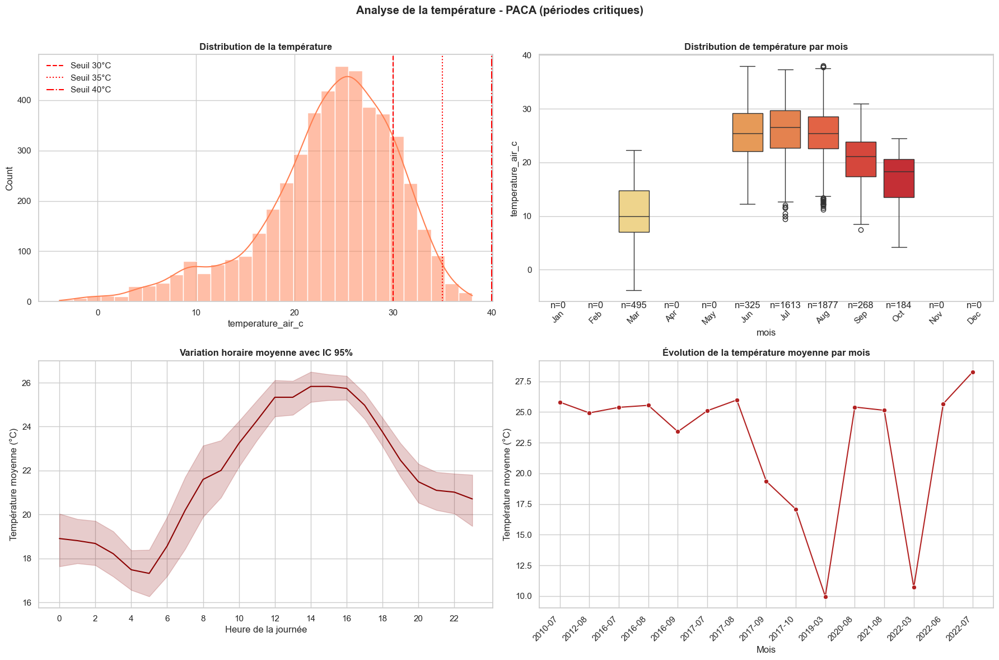

In [50]:
temp_fig_paca, temp_stats_paca = analyser_temperature(df_paca, "PACA")
results_paca['figures'].update(temp_fig_paca)
results_paca['statistics']['temperature_stats'] = temp_stats_paca

L’analyse des températures en PACA durant les périodes critiques met en évidence un climat estival chaud, mais avec des contrastes marqués.

### **Statistiques Principales**
- *Moyenne* : 23.5°C – témoigne d’un climat globalement chaud.
- *Extrêmes* : de -3.9°C (mars) à 38.0°C (août), révélant une forte variabilité.
  
#### Seuils de Chaleur :
- **30°C** : atteints **15.8%** du temps.
- **35°C** (canicule) : franchi **1.3%** du temps.
- **40°C** : jamais atteint dans l’échantillon.

### **Tendances Observées**
- **Histogramme** : Températures centrées autour de 20–30°C, distribution symétrique.
- **Variations Mensuelles** : Juillet 2022 est le mois le plus chaud (28.3°C). Étés (juin–août) dominent nettement.
- **Cycle Journalier** : Amplitude moyenne de 9°C, avec un minimum vers 6h et un pic à 15h–16h.
- **Évolution Annuelle** : Pics marqués en 2017 et 2022, avec des chutes nettes à l’automne.

### **Conclusion**
PACA connaît des étés chauds avec des fréquents dépassements des 30°C. Toutefois, les canicules >35°C restent modérées, et la région subit parfois des épisodes de froid, même en période sensible.

---

### 7.2. Analyse Descriptive de la Température de la Nouvelle-Aquitaine


ANALYSE TEMPÉRATURE - NOUVELLE-AQUITAINE

 STATISTIQUES DESCRIPTIVES GLOBALES
+-------------+------------------+
| Statistique | Température (°C) |
+-------------+------------------+
|    count    |      4863.0      |
|    mean     |       23.8       |
|     std     |       6.7        |
|     min     |       -1.4       |
|     1%      |       8.0        |
|     5%      |       12.3       |
|     25%     |       19.6       |
|     50%     |       23.9       |
|     75%     |       28.2       |
|     95%     |       34.5       |
|     99%     |       37.9       |
|     max     |       41.4       |
+-------------+------------------+

 DÉPASSEMENT DES SEUILS DE TEMPÉRATURE
+--------+---------------+
| Seuil  | % occurrences |
+--------+---------------+
| > 30°C |     17.9      |
| > 35°C |      4.1      |
| > 40°C |      0.2      |
+--------+---------------+

 STATISTIQUES MENSUELLES
+---------+---------+---------+------+------+------------+
|  Mois   | Moyenne | Médiane | Min  | Max  | É

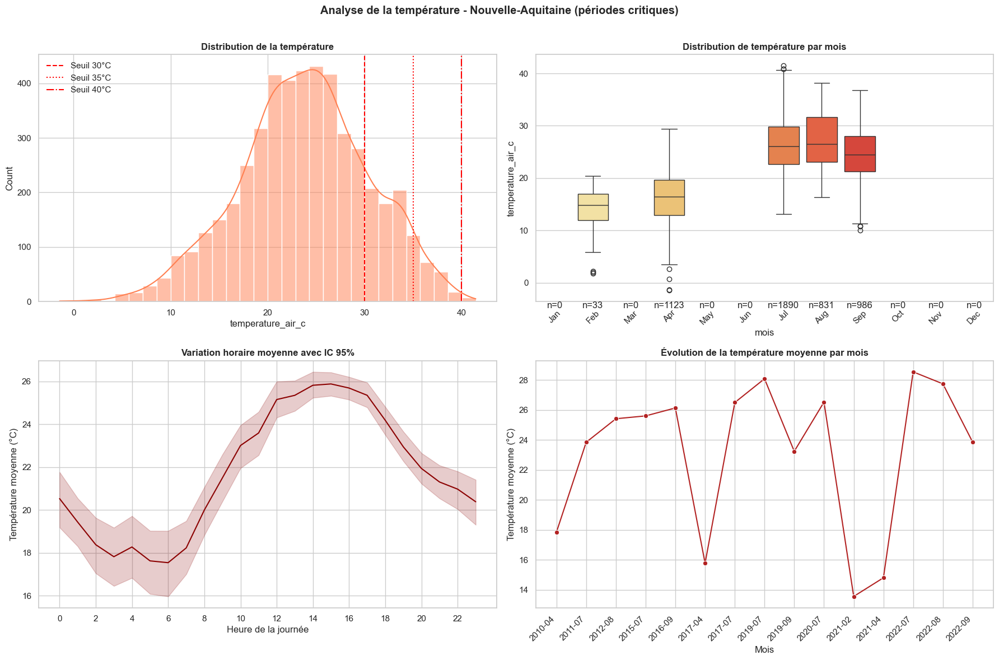

In [51]:
temp_fig_na, temp_stats_na = analyser_temperature(df_na, "Nouvelle-Aquitaine")
# Stockage des résultats
results_na['figures'].update(temp_fig_na)  # Stocke les figures
results_na['statistics']['temperature_stats'] = temp_stats_na  # Stocke les stats

L’analyse des températures met en évidence un climat chaud avec une exposition marquée aux vagues de chaleur extrême.

### **Statistiques Principales**
- *Moyenne* : 23.8°C – proche de PACA, traduisant des conditions estivales similaires.
- *Extrêmes* : de -1.4°C à 41.4°C, un maximum nettement supérieur à celui de PACA.

#### Seuils de Chaleur :
- **30°C** : atteints **17.9%** du temps.
- **35°C** : franchi **4.1%** du temps (3× plus qu’en PACA).
- **40°C** : dépassé **0.2%** du temps – cas rares mais bien présents.

### **Tendances Observées**
- **Histogramme** : Cœur de la distribution entre 20–30°C, mais avec une queue vers les hautes températures (effet de canicule).
- **Variations Mensuelles** : Juillet 2022 le plus chaud (28.5°C), suivi de pics notables en 2019, 2020, et août 2022.
- **Cycle Journalier** : Profil classique avec minimum à l’aube, pic vers 16h, et amplitude moyenne de 8–9°C.
- **Évolution Annuelle** : Tendance à des étés de plus en plus chauds, avec des pics marqués en 2012, 2015, 2019, 2020 et un record en 2022.

### **Conclusion**
La Nouvelle-Aquitaine est plus exposée aux vagues de chaleur extrême que la PACA. Malgré des moyennes proches, les pics >40°C et les épisodes de canicule y sont plus fréquents, faisant de cette région un point chaud climatique sensible.

---

## 8. Analyse descriptive des précipitations

Cette fonction effectue une analyse détaillée des précipitations durant les périodes critiques d’incendie. Elle fournit des statistiques descriptives à la fois globales et mensuelles, et génère des visualisations permettant de mieux comprendre les régimes 

### **a. Statistiques de base**

**Métriques calculées :**
- Moyenne, médiane, écart-type, maximum
- Percentiles (25%, 50%, 75%, 95%, 99%)
- Coefficient d’asymétrie (skewness) : pour détecter les distributions déséquilibrées et les extrêmes

**Points d’attention :**
- Concentration des précipitations sur un nombre limité de jours
- Forte occurrence de jours secs (précipitations nulles ou proches de 0)


### **b. Statistiques mensuelles**
L’analyse mensuelle repose sur l’agrégation des précipitations par mois-année (annee_mois), et fournit les indicateurs suivants :
- Moyenne, médiane, maximum, écart-type
- Pourcentage de jours sans pluie (0 mm)
- Identification des mois anormalement secs ou excessivement pluvieux

### **c. Visualisations Produites**

La fonction génère une figure contenant quatre visualisations complémentaires pour explorer les dynamiques pluviométriques :
1. **Distribution des précipitations mesurables (> 0 mm)**
2. **Histogramme enrichi par une courbe de densité (KDE)**
   - Met en évidence l’asymétrie et la dispersion des événements pluvieux
3. **Proportion de jours secs vs jours pluvieux**
   - Diagramme à barres illustrant la fréquence des jours à 0 mm
   - Permet d’évaluer la sécheresse relative de la période
4. **Répartition mensuelle des précipitations**
   - Boxplots sans outliers pour chaque mois de l’année
   - Comparaison directe des médianes et variabilité intra-mensuelle
   - Annoté par le nombre d’observations n pour chaque mois
5. **Évolution temporelle des précipitations moyennes mensuelles**
   - Courbe chronologique sur l’ensemble de la période critique
   - Détection visuelle des tendances interannuelles ou ruptures

In [52]:
def analyser_precipitations(df: pd.DataFrame, region_name: str) -> Tuple[Dict[str, plt.Figure], pd.DataFrame]:
    """Analyse des précipitations pour les périodes critiques"""
    print(f"\n{'='*50}\nANALYSE PRÉCIPITATIONS - {region_name.upper()}\n{'='*50}")
    
    # 1. Statistiques de base
    precip_stats = df['precipitations_mm'].describe(percentiles=[.25, .5, .75, .95, .99]).round(2)
    precip_stats['skewness'] = df['precipitations_mm'].skew().round(2)
    print("\n STATISTIQUES DESCRIPTIVES GLOBALES")
    print(tabulate(precip_stats.to_frame(), headers=['Statistique', 'Valeur'], 
                   tablefmt='pretty', floatfmt=".2f"))

    # 2. Statistiques mensuelles
    stats_mensuelles = df.groupby('annee_mois')['precipitations_mm'].agg([
        'mean', 'median', 'max', 'std', 
        lambda x: (x == 0).mean()*100  # % jours sans pluie
    ]).round(2)
    stats_mensuelles.columns = ['moyenne', 'mediane', 'max', 'std', '%_jours_secs']
    
    print("\n STATISTIQUES MENSUELLES")
    print(tabulate(stats_mensuelles, headers=stats_mensuelles.columns, 
                   tablefmt='pretty', floatfmt=".2f"))

    # 3. Visualisation
    fig = plt.figure(figsize=(18, 12), dpi=100)
    fig.suptitle(f"Analyse des précipitations - {region_name} (périodes critiques)", fontweight='bold')
    gs = GridSpec(2, 2, figure=fig) 

    # --- Graphique 1: Distribution (valeurs positives seulement) ---
    ax1 = fig.add_subplot(gs[0, 0])
    precip_positives = df[df['precipitations_mm'] > 0]['precipitations_mm']
    sns.histplot(precip_positives, bins=30, kde=True, ax=ax1, color='dodgerblue')
    ax1.set_title('Distribution des précipitations (>0 mm)')
    ax1.set_xlabel('Précipitation (mm)')
    
    # --- Graphique 2: Fréquence des jours sans pluie ---
    ax2 = fig.add_subplot(gs[0, 1])
    prop_seche = (df['precipitations_mm'] == 0).mean() * 100
    sns.barplot(x=['Jours secs', 'Jours de pluie'], 
                y=[prop_seche, 100-prop_seche], 
                palette=['lightcoral', 'lightsteelblue'], ax=ax2)
    ax2.set_title(f'Proportion de jours sans pluie\n({prop_seche:.1f}%)')
    ax2.set_ylabel('Pourcentage (%)')

    # --- Graphique 3: Précipitations par mois ---
    ax3 = fig.add_subplot(gs[1, 0])
    df['mois'] = pd.Categorical(df['mois'], categories=range(1, 13), ordered=True)
    
    # Correction du warning: d'abord set_xticks puis set_xticklabels
    sns.boxplot(x='mois', y='precipitations_mm', data=df, 
                showfliers=False, palette='Blues', ax=ax3)
    ax3.set_title('Distribution mensuelle des précipitations', pad=30)  # Augmentation du pad
    ax3.set_xticks(range(12))
    ax3.set_xticklabels(calendar.month_abbr[1:13], rotation=45)
    ax3.set_ylabel('Précipitation (mm)')
    
    # Correction position n= : placement au-dessus des boxplots
    counts = df['mois'].value_counts().sort_index()
    for i, count in enumerate(counts):
        ax3.text(i, ax3.get_ylim()[1] * 0.95,  # Positionné à 95% de l'échelle y
                f'n={count}', 
                ha='center', 
                va='top',
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

    # --- Graphique 4: Evolution mensuelle ---
    ax4 = fig.add_subplot(gs[1, 1])
    temp_mensuelle = df.groupby('annee_mois')['precipitations_mm'].mean().reset_index()
    temp_mensuelle['annee_mois_str'] = temp_mensuelle['annee_mois'].astype(str)
    
    sns.lineplot(x='annee_mois_str', y='precipitations_mm', data=temp_mensuelle,
                 marker='o', color='navy', ax=ax4)
    ax4.set_title('Évolution des précipitations moyennes par mois')
    ax4.set_xlabel('Mois')
    ax4.set_ylabel('Précipitation moyenne (mm)')
    plt.setp(ax4.get_xticklabels(), rotation=45, ha='right')

    plt.tight_layout(rect=[0, 0, 1, 0.97])

    # Sauvegarde
    region_key = 'paca' if 'paca' in region_name.lower() else 'na'
    save_and_show_figure(fig, region_key, 'precipitation_analysis')

    # 4. Résultats combinés
    results_df = pd.concat([
        precip_stats.rename('valeur').to_frame().reset_index().rename(columns={'index': 'statistique'}),
        stats_mensuelles.reset_index().melt(id_vars='annee_mois', var_name='statistique', value_name='valeur')
    ])

    return {'precipitation_figures': fig}, results_df

#### 8.1. Analyse descriptive des précipitations de la Provence-Alpes-Côte d’Azur


ANALYSE PRÉCIPITATIONS - PACA

 STATISTIQUES DESCRIPTIVES GLOBALES
+-------------+--------+
| Statistique | Valeur |
+-------------+--------+
|    count    | 4762.0 |
|    mean     |  0.29  |
|     std     |  1.42  |
|     min     |  0.0   |
|     25%     |  0.0   |
|     50%     |  0.0   |
|     75%     |  0.02  |
|     95%     |  1.34  |
|     99%     |  6.46  |
|     max     | 20.08  |
|  skewness   |  8.6   |
+-------------+--------+

 STATISTIQUES MENSUELLES
+---------+---------+---------+-------+------+--------------+
|         | moyenne | mediane |  max  | std  | %_jours_secs |
+---------+---------+---------+-------+------+--------------+
| 2010-07 |  0.06   |   0.0   | 1.33  | 0.19 |    25.29     |
| 2012-08 |   0.6   |   0.0   | 9.26  | 1.57 |    28.06     |
| 2016-07 |  0.31   |   0.0   | 20.08 | 1.62 |    43.97     |
| 2016-08 |  0.34   |   0.0   | 10.7  | 1.39 |    34.37     |
| 2016-09 |  0.61   |   0.0   | 4.05  | 1.12 |    26.25     |
| 2017-07 |  0.12   |   0.0   |  4.

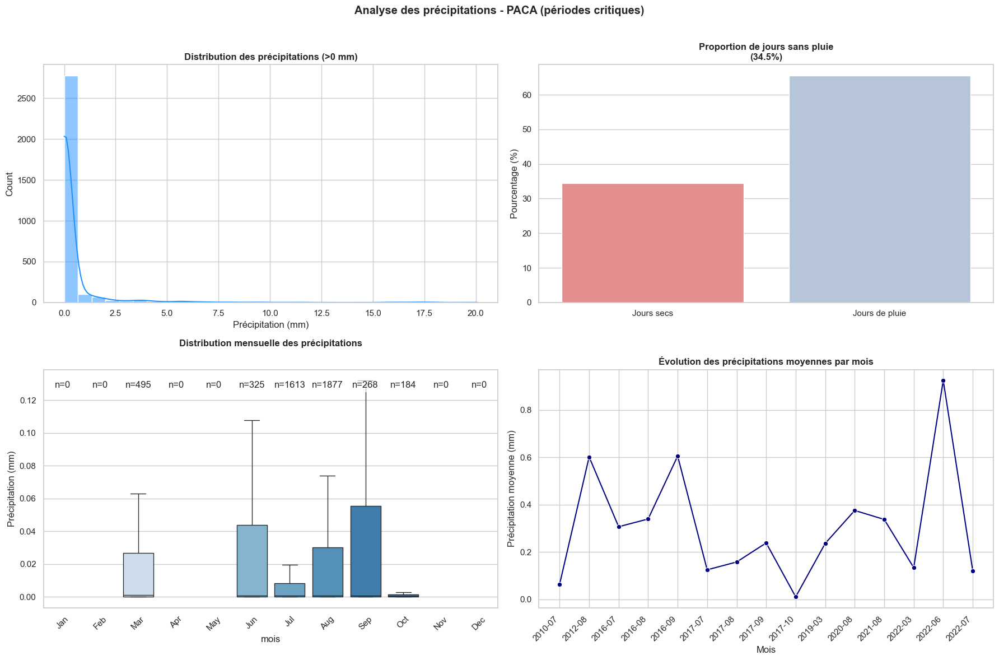

In [53]:
# Analyse pour la région PACA
precip_fig_paca, precip_stats_paca = analyser_precipitations(df_paca, "PACA")

# Stockage des résultats (si vous avez un dictionnaire results_paca comme dans votre exemple)
results_paca['figures'].update(precip_fig_paca)
results_paca['statistics']['precipitation_stats'] = precip_stats_paca

L’analyse des précipitations en PACA révèle une situation de sécheresse dominante, avec des épisodes pluvieux très localisés et intenses.

### **Statistiques Principales**
- **Moyenne** : 0.29 mm – très faible, traduisant une période globalement sèche.
- **Extrêmes** : jusqu’à 20.08 mm, avec une distribution fortement asymétrique (skewness = 8.6).
- **Médiane** : 0 mm → plus de la moitié des jours sans aucune précipitation.
- **Jours Secs** : 34.5% du total (1 jour sur 3 sans pluie).

### **Tendances Observées**
- **Distribution** : Très concentrée autour de 0 mm, avec une minorité de jours très pluvieux.

- **Périodes les Plus Humides** :
    - **Juin 2022** : 0.93 mm/jour – mois exceptionnellement pluvieux.
    - **Août 2020 et Août 2021** : Épisodes ponctuels mais intenses.

- **Mois Peu Arrosés** :
    - **Juillet 2017, Octobre 2017, Juillet 2022** : Quasiment secs.
    - **Aucune donnée de précipitation** pour janvier, avril, novembre, décembre.

### **Conclusion**
La région PACA traverse les périodes critiques avec une forte dominance de la sécheresse. Les précipitations sont rares, souvent concentrées en quelques événements isolés. Ce déficit hydrique constitue un facteur majeur de vulnérabilité aux incendies, en particulier durant l'été.

---

### 8.2. Analyse descriptive des précipitations de la Nouvelle-Aquitaine


ANALYSE PRÉCIPITATIONS - NOUVELLE-AQUITAINE

 STATISTIQUES DESCRIPTIVES GLOBALES
+-------------+--------+
| Statistique | Valeur |
+-------------+--------+
|    count    | 4863.0 |
|    mean     |  0.33  |
|     std     |  1.2   |
|     min     |  0.0   |
|     25%     |  0.0   |
|     50%     |  0.0   |
|     75%     |  0.06  |
|     95%     |  1.67  |
|     99%     |  6.88  |
|     max     | 16.51  |
|  skewness   |  6.53  |
+-------------+--------+

 STATISTIQUES MENSUELLES
+---------+---------+---------+-------+------+--------------+
|         | moyenne | mediane |  max  | std  | %_jours_secs |
+---------+---------+---------+-------+------+--------------+
| 2010-04 |  0.15   |   0.0   | 5.64  | 0.54 |    25.26     |
| 2011-07 |  0.44   |   0.0   | 12.68 | 1.58 |    30.68     |
| 2012-08 |  0.39   |  0.01   | 4.65  | 0.87 |    17.04     |
| 2015-07 |  0.35   |  0.01   | 9.64  | 0.96 |     8.9      |
| 2016-09 |  0.33   |   0.0   | 12.79 | 1.24 |    34.32     |
| 2017-04 |  0.13   |

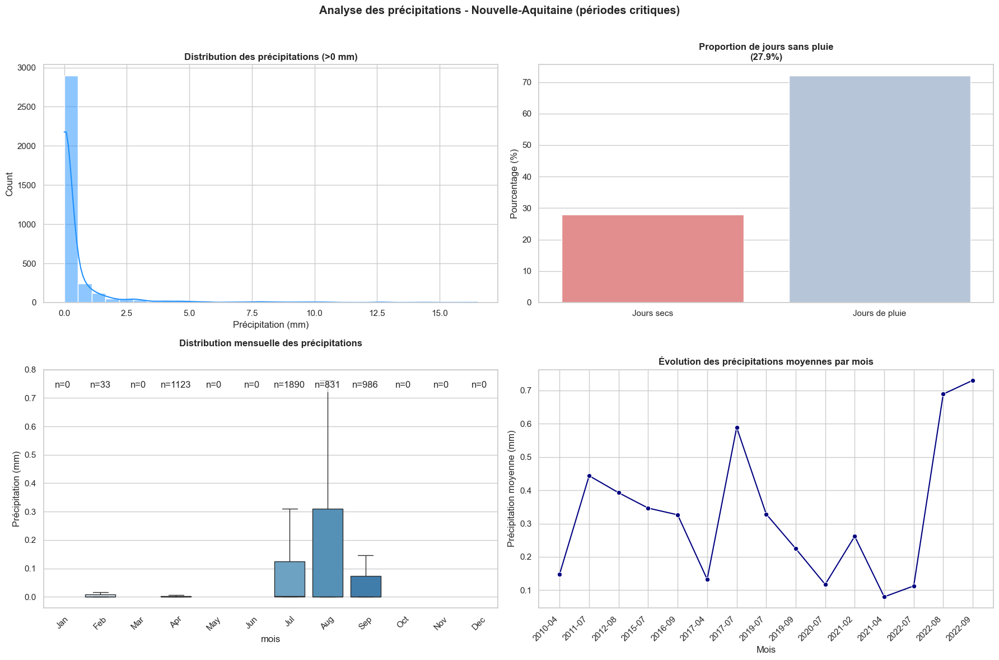

In [54]:
# Analyse pour la région Nouvelle-Aquitaine
precip_fig_na, precip_stats_na = analyser_precipitations(df_na, "Nouvelle-Aquitaine")

# Stockage des résultats
results_na['figures'].update(precip_fig_na)
results_na['statistics']['precipitation_stats'] = precip_stats_na

En Nouvelle-Aquitaine, les précipitations sont légèrement plus fréquentes, mais tout aussi irrégulières. La sécheresse reste dominante, mais avec davantage d’événements pluvieux dispersés.

### **Statistiques Principales**
- **Moyenne** : 0.33 mm – un peu plus élevée que PACA.
- **Extrêmes** : jusqu’à 16.51 mm, avec une forte asymétrie (skewness = 6.53).
- **Médiane** : 0 mm → plus de la moitié des jours également sans pluie.
- **Jours Secs** : 27.9% (moins que PACA, donc un climat un peu plus arrosé).

### **Tendances Observées**
- **Distribution** : Très concentrée entre 0 et 1 mm, mais avec quelques pics jusqu’à 15 mm.

- **Périodes Pluvieuses Notables** :
    - **Septembre 2022 et Août 2022** : Moyennes de 0.7 mm – mois les plus humides de la période.
    - **Juillet 2017** : 0.59 mm, également marqué.

- **Périodes les Plus Sèches** :
    - **Avril 2021, Avril 2017, Juillet 2022** : Très peu de précipitations malgré leur proximité avec les pics d’incendies.
    - **Aucune pluie enregistrée** sur plusieurs mois hors été (janvier, mars, mai, novembre, décembre).

### **Conclusion**
La Nouvelle-Aquitaine présente un profil pluviométrique un peu plus favorable que PACA, mais reste exposée à de longues séquences sans pluie. Cette sécheresse intermittente, couplée à une végétation plus abondante, crée un risque d'incendie élevé, en particulier en fin d'été.

---

### 9. Analyse de l'Humidité du Sol

Cette analyse évalue les conditions de sécheresse du sol durant les périodes sensibles aux incendies à partir des données météorologiques.

### a. Contenu de l’Analyse

-   **Statistiques globales** : moyenne, médiane, extrêmes, écart-type, percentiles, asymétrie, aplatissement, coefficient de variation (CV).

-   **Seuils critiques** : % de jours sous 0.05 / 0.10 / 0.15 / 0.20 m³/m³.

-   **Évolution mensuelle** : moyennes, extrêmes et quantiles par mois.

-   **Analyse horaire** : moyenne et écart-type par tranche horaire.

### b. Visualisations (6 Graphiques)

1.  Distribution avec seuils critiques.
2.  Répartition par classes d’humidité (extrême sec à humide).
3.  Boxplots mensuels.
4.  Évolution mensuelle avec IC 95 %.
5.  Variation horaire de l’humidité.
6.  Corrélation sol / température (nuage de points + régression).

### c. Résultats Produits

-   **humidite_sol_figures** : figure avec les 6 visualisations.
-   **results_df** : tableau récapitulatif des statistiques, seuils, classes et corrélations.

### d. Objectif

Identifier les phases de forte sécheresse du sol en lien avec des températures élevées, pour mieux comprendre et anticiper les risques d’incendie.


In [55]:
def analyser_humidite_sol(df: pd.DataFrame, region_name: str) -> Tuple[Dict[str, plt.Figure], pd.DataFrame]:
    """Analyse approfondie de l'humidité du sol pour les périodes critiques d'incendie
    
    Args:
        df: DataFrame contenant les données météo avec colonnes préparées
        region_name: Nom de la région pour le titre des graphiques
        
    Returns:
        Tuple contenant:
            - Dictionnaire avec les figures matplotlib
            - DataFrame avec les statistiques calculées
    """
    print(f"\n{'='*50}\nANALYSE HUMIDITÉ DU SOL - {region_name.upper()}\n{'='*50}")
    
    # 1. Statistiques descriptives avancées
    humidite_stats = df['humidite_sol_surface_m3m3'].describe(percentiles=[.01, .05, .25, .5, .75, .95, .99]).round(3)
    # Ajout de statistiques supplémentaires
    humidite_stats['skewness'] = df['humidite_sol_surface_m3m3'].skew().round(2)
    humidite_stats['kurtosis'] = df['humidite_sol_surface_m3m3'].kurtosis().round(2)
    humidite_stats['CV'] = (df['humidite_sol_surface_m3m3'].std() / df['humidite_sol_surface_m3m3'].mean()).round(2)
    
    print("\n STATISTIQUES DESCRIPTIVES GLOBALES")
    print(tabulate(humidite_stats.to_frame(), headers=['Statistique', 'Valeur'], 
                   tablefmt='pretty', floatfmt=".3f"))

    # 2. Analyse des seuils critiques (adaptés aux incendies)
    seuils = {
        f'< {seuil} m³/m³': {
            '%': (df['humidite_sol_surface_m3m3'] < seuil).mean() * 100,
            'count': (df['humidite_sol_surface_m3m3'] < seuil).sum()
        }
        for seuil in [0.05, 0.1, 0.15, 0.2]  # Seuils plus fins pour les incendies
    }
    seuils_df = pd.DataFrame.from_dict(seuils, orient='index').round(1)
    
    print("\n FRÉQUENCE DES SEUILS CRITIQUES")
    print(tabulate(seuils_df, headers=['Seuil', '%', 'Nombre'], 
                   tablefmt='pretty', floatfmt=".1f"))

    # 3. Statistiques mensuelles détaillées
    stats_mensuelles = df.groupby('annee_mois')['humidite_sol_surface_m3m3'].agg([
        ('moyenne', 'mean'),
        ('mediane', 'median'),
        ('minimum', 'min'),
        ('maximum', 'max'),
        ('ecart_type', 'std'),
        ('q10', lambda x: x.quantile(0.1)),
        ('q90', lambda x: x.quantile(0.9)),
        ('count', 'count')
    ]).round(3)
    
    # 4. Analyse par période de la journée
    stats_periode = df.groupby('periode')['humidite_sol_surface_m3m3'].agg(['mean', 'std', 'count']).round(3)

    # 5. Visualisation
    fig = plt.figure(figsize=(20, 16), dpi=120)
    fig.suptitle(f"Analyse de l'humidité du sol - {region_name} (périodes critiques d'incendie)", 
                 fontweight='bold', fontsize=14)
    gs = GridSpec(3, 2, figure=fig)

    # --- Graphique 1: Distribution avec seuils critiques ---
    ax1 = fig.add_subplot(gs[0, 0])
    sns.histplot(df['humidite_sol_surface_m3m3'], bins=40, kde=True, 
                 ax=ax1, color='darkgreen', alpha=0.7)
    
    # Seuils adaptés aux incendies
    for seuil, style, label in [(0.05, '--', 'Extrêmement sec (<0.05)'), 
                               (0.1, ':', 'Très sec (<0.1)'), 
                               (0.15, '-.', 'Sec (<0.15)')]:
        ax1.axvline(seuil, color='red', linestyle=style, label=label)
    
    ax1.legend()
    ax1.set_title('Distribution de l\'humidité du sol avec seuils critiques')
    ax1.set_xlabel('Humidité du sol (m³/m³)')
    ax1.set_ylabel('Fréquence')
    
    # Ajout des indicateurs statistiques
    stats_text = (f"Moyenne: {humidite_stats['mean']:.3f}\n"
                 f"Médiane: {humidite_stats['50%']:.3f}\n"
                 f"Skewness: {humidite_stats['skewness']:.2f}")
    ax1.text(0.75, 0.85, stats_text, transform=ax1.transAxes, 
             bbox=dict(facecolor='white', alpha=0.8))

    # --- Graphique 2: Classes d'humidité ---
    ax2 = fig.add_subplot(gs[0, 1])
    bins = [0, 0.05, 0.1, 0.15, 0.2, 1]
    labels = ['Extrême sec', 'Très sec', 'Sec', 'Modéré', 'Humide']
    df['humidity_class'] = pd.cut(df['humidite_sol_surface_m3m3'], bins=bins, labels=labels)
    
    class_counts = df['humidity_class'].value_counts(normalize=True).sort_index() * 100
    palette = sns.color_palette("RdYlGn", len(labels))[::-1]  # Rouge à vert
    sns.barplot(x=class_counts.index, y=class_counts.values, palette=palette, ax=ax2)
    
    # Ajout des pourcentages
    for i, pct in enumerate(class_counts):
        ax2.text(i, pct+1, f"{pct:.1f}%", ha='center', va='bottom')
    
    ax2.set_title('Répartition des classes d\'humidité (%)')
    ax2.set_ylabel('Pourcentage')
    ax2.set_xlabel('Classe d\'humidité')
    plt.setp(ax2.get_xticklabels(), rotation=45, ha='right')

    # --- Graphique 3: Boxplot mensuel avec points extrêmes ---
    ax3 = fig.add_subplot(gs[1, 0])
    df['mois'] = pd.Categorical(df['mois'], categories=range(1, 13), ordered=True)
    sns.boxplot(x='mois', y='humidite_sol_surface_m3m3', data=df, 
                palette='YlGn', fliersize=2, linewidth=1.5, ax=ax3)
    
    # Formatage des mois
    ax3.set_xticks(range(12))
    ax3.set_xticklabels(calendar.month_abbr[1:13], rotation=45)
    ax3.set_title('Variation mensuelle de l\'humidité du sol', pad=20)
    ax3.set_ylabel('Humidité (m³/m³)')
    
    # Ajout du nombre d'observations et indicateurs
    counts = df['mois'].value_counts().sort_index()
    for i, count in enumerate(counts):
        ax3.text(i, ax3.get_ylim()[0]-0.02, f"n={count}", ha='center', va='top', fontsize=9)

    # --- Graphique 4: Évolution temporelle avec IC ---
    ax4 = fig.add_subplot(gs[1, 1])
    temp_mensuelle = df.groupby('annee_mois').agg(
        mean=('humidite_sol_surface_m3m3', 'mean'),
        std=('humidite_sol_surface_m3m3', 'std'),
        count=('humidite_sol_surface_m3m3', 'count')
    ).reset_index()
    temp_mensuelle['annee_mois_str'] = temp_mensuelle['annee_mois'].astype(str)
    temp_mensuelle['ci'] = 1.96 * temp_mensuelle['std'] / np.sqrt(temp_mensuelle['count'])
    
    sns.lineplot(x='annee_mois_str', y='mean', data=temp_mensuelle, 
                 marker='o', color='forestgreen', ax=ax4)
    ax4.fill_between(temp_mensuelle['annee_mois_str'],
                    temp_mensuelle['mean'] - temp_mensuelle['ci'],
                    temp_mensuelle['mean'] + temp_mensuelle['ci'],
                    color='forestgreen', alpha=0.2)
    
    ax4.set_title('Évolution mensuelle moyenne avec intervalle de confiance 95%')
    ax4.set_xlabel('Mois')
    ax4.set_ylabel('Humidité moyenne (m³/m³)')
    plt.setp(ax4.get_xticklabels(), rotation=45, ha='right')

    # --- Graphique 5: Variation horaire ---
    ax5 = fig.add_subplot(gs[2, 0])
    hourly = df.groupby('heure')['humidite_sol_surface_m3m3'].agg(['mean', 'std', 'count']).reset_index()
    hourly['ci'] = 1.96 * hourly['std'] / np.sqrt(hourly['count'])
    
    sns.lineplot(x='heure', y='mean', data=hourly, color='darkgreen', ax=ax5)
    ax5.fill_between(hourly['heure'],
                    hourly['mean'] - hourly['ci'],
                    hourly['mean'] + hourly['ci'],
                    color='darkgreen', alpha=0.2)
    
    ax5.set_title('Variation horaire moyenne avec IC 95%')
    ax5.set_xticks(range(0, 24, 2))
    ax5.set_xlabel('Heure de la journée')
    ax5.set_ylabel('Humidité moyenne (m³/m³)')

    # --- Graphique 6: Relation température/humidité ---
    ax6 = fig.add_subplot(gs[2, 1])
    sns.scatterplot(x='temperature_air_c', y='humidite_sol_surface_m3m3', 
                    data=df, alpha=0.3, color='darkblue', ax=ax6)
    
    # Régression linéaire
    sns.regplot(x='temperature_air_c', y='humidite_sol_surface_m3m3', 
                data=df, scatter=False, color='red', ax=ax6)
    
    # Calcul du coefficient de corrélation
    corr = df['temperature_air_c'].corr(df['humidite_sol_surface_m3m3']).round(2)
    ax6.annotate(f'Corrélation: {corr}', xy=(0.7, 0.9), xycoords='axes fraction',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax6.set_title('Relation température-humidité du sol')
    ax6.set_xlabel('Température de l\'air (°C)')
    ax6.set_ylabel('Humidité du sol (m³/m³)')

    plt.tight_layout(rect=[0, 0, 1, 0.96])

    # Sauvegarde
    region_key = 'paca' if 'paca' in region_name.lower() else 'na'
    save_and_show_figure(fig, region_key, 'humidite_sol_analysis')

    # 6. Résultats combinés
    class_proportions = df['humidity_class'].value_counts(normalize=True).sort_index() * 100
    results_df = pd.concat([
        humidite_stats.rename('valeur').to_frame().reset_index().rename(columns={'index': 'statistique'}),
        seuils_df.reset_index().rename(columns={'index': 'statistique'}).melt(id_vars='statistique'),
        pd.DataFrame({
            'statistique': [f'proportion_{label.lower().replace(" ", "_")}' for label in labels],
            'variable': '%',
            'valeur': class_proportions.values.round(1)
        }),
        stats_mensuelles.reset_index().melt(id_vars='annee_mois', var_name='statistique'),
        stats_periode.reset_index().melt(id_vars='periode', var_name='statistique'),
        pd.DataFrame({
            'statistique': ['correlation_temp_humidite'],
            'variable': 'coeff',
            'valeur': [corr]
        })
    ])

    return {'humidite_sol_figures': fig}, results_df

#### 9.1. Analyse de l'Humidité du Sol de la Provence-Alpes-Côte d’Azur


ANALYSE HUMIDITÉ DU SOL - PACA

 STATISTIQUES DESCRIPTIVES GLOBALES
+-------------+--------+
| Statistique | Valeur |
+-------------+--------+
|    count    | 4762.0 |
|    mean     | 0.167  |
|     std     |  0.07  |
|     min     | 0.068  |
|     1%      | 0.069  |
|     5%      | 0.093  |
|     25%     | 0.126  |
|     50%     | 0.139  |
|     75%     | 0.192  |
|     95%     | 0.314  |
|     99%     | 0.411  |
|     max     | 0.469  |
|  skewness   |  1.6   |
|  kurtosis   |  2.43  |
|     CV      |  0.42  |
+-------------+--------+

 FRÉQUENCE DES SEUILS CRITIQUES
+--------------+------+--------+
|    Seuil     |  %   | Nombre |
+--------------+------+--------+
| < 0.05 m³/m³ | 0.0  |  0.0   |
| < 0.1 m³/m³  | 5.8  | 275.0  |
| < 0.15 m³/m³ | 60.8 | 2896.0 |
| < 0.2 m³/m³  | 77.1 | 3670.0 |
+--------------+------+--------+


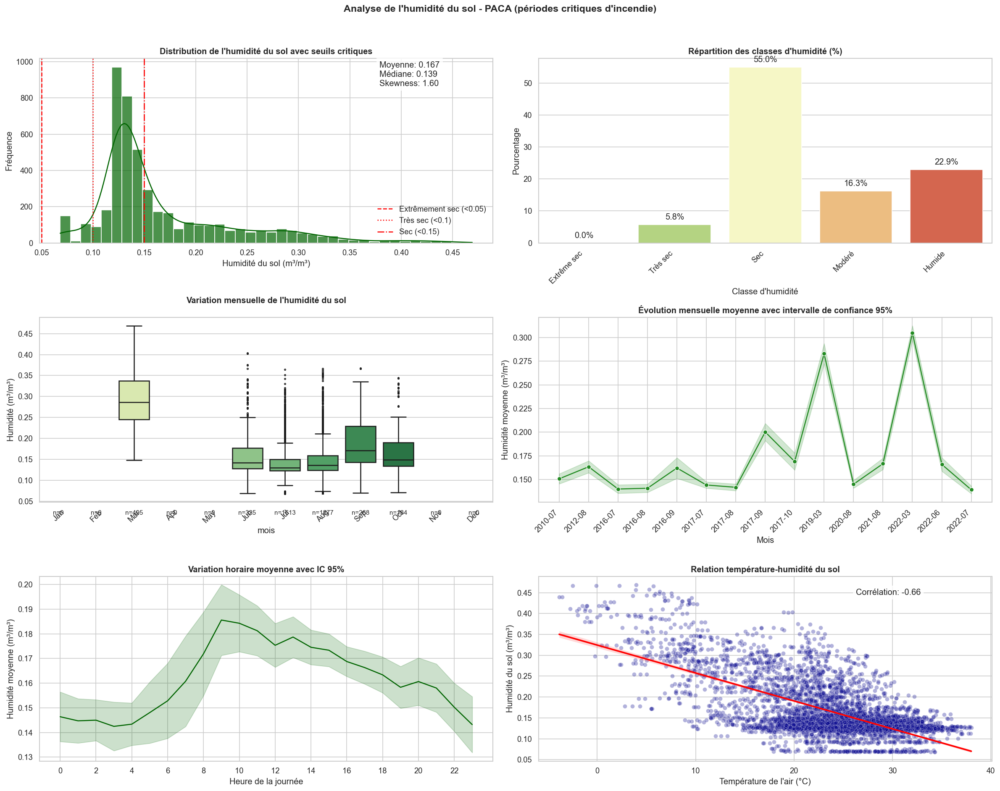

In [56]:
# Pour PACA
results_paca, stats_paca = analyser_humidite_sol(df_paca, "PACA")

L'humidité du sol en Nouvelle-Aquitaine est globalement un peu plus élevée qu’en PACA, mais atteint fréquemment des niveaux de sécheresse critiques pour le risque d’incendie.

### **Distribution et Seuils Critiques**
- **Humidité du Sol** : centrée autour de 0.15 m³/m³ 
  - **Moyenne** : 0.165 m³/m³ 
  - **Médiane** : 0.150 m³/m³
- **Conditions de Sécheresse** :
  - Près de 20 % du temps, l'humidité est très sèche (< 0.1 m³/m³), seuil où la végétation devient hautement inflammable.
  - Au total, 50 % du temps, le sol est sec ou très sec (< 0.15 m³/m³), des conditions particulièrement propices aux départs et à la propagation d'incendies.

### **Variations Temporelles**
- **Annuellement** : 
  - Des sécheresses marquées apparaissent en juillet 2011, 2015 et surtout 2022, avec une humidité bien en dessous du seuil critique.
- **Mensuellement** : 
  - Les mois d’été (juillet à septembre) montrent les niveaux les plus faibles, signe d'une sécheresse installée.
- **Journalier** : 
  - L’humidité est minimale à 16h (évaporation maximale) et maximale à 6h, augmentant le risque d'ignition aux heures chaudes.

### **Corrélation avec la Température**
- Une corrélation négative de -0.48 confirme qu’une hausse des températures entraîne une baisse de l’humidité du sol, aggravant ainsi les conditions de sécheresse et le risque d’incendie.

#### 9.2. Analyse de l'Humidité du Sol de la Nouvelle-Aquitaine


ANALYSE HUMIDITÉ DU SOL - NOUVELLE-AQUITAINE

 STATISTIQUES DESCRIPTIVES GLOBALES
+-------------+--------+
| Statistique | Valeur |
+-------------+--------+
|    count    | 4863.0 |
|    mean     | 0.165  |
|     std     | 0.073  |
|     min     | 0.052  |
|     1%      | 0.056  |
|     5%      | 0.061  |
|     25%     | 0.116  |
|     50%     |  0.15  |
|     75%     | 0.204  |
|     95%     | 0.311  |
|     99%     | 0.352  |
|     max     | 0.433  |
|  skewness   |  0.69  |
|  kurtosis   | -0.07  |
|     CV      |  0.45  |
+-------------+--------+

 FRÉQUENCE DES SEUILS CRITIQUES
+--------------+------+--------+
|    Seuil     |  %   | Nombre |
+--------------+------+--------+
| < 0.05 m³/m³ | 0.0  |  0.0   |
| < 0.1 m³/m³  | 19.5 | 949.0  |
| < 0.15 m³/m³ | 50.1 | 2434.0 |
| < 0.2 m³/m³  | 73.9 | 3595.0 |
+--------------+------+--------+


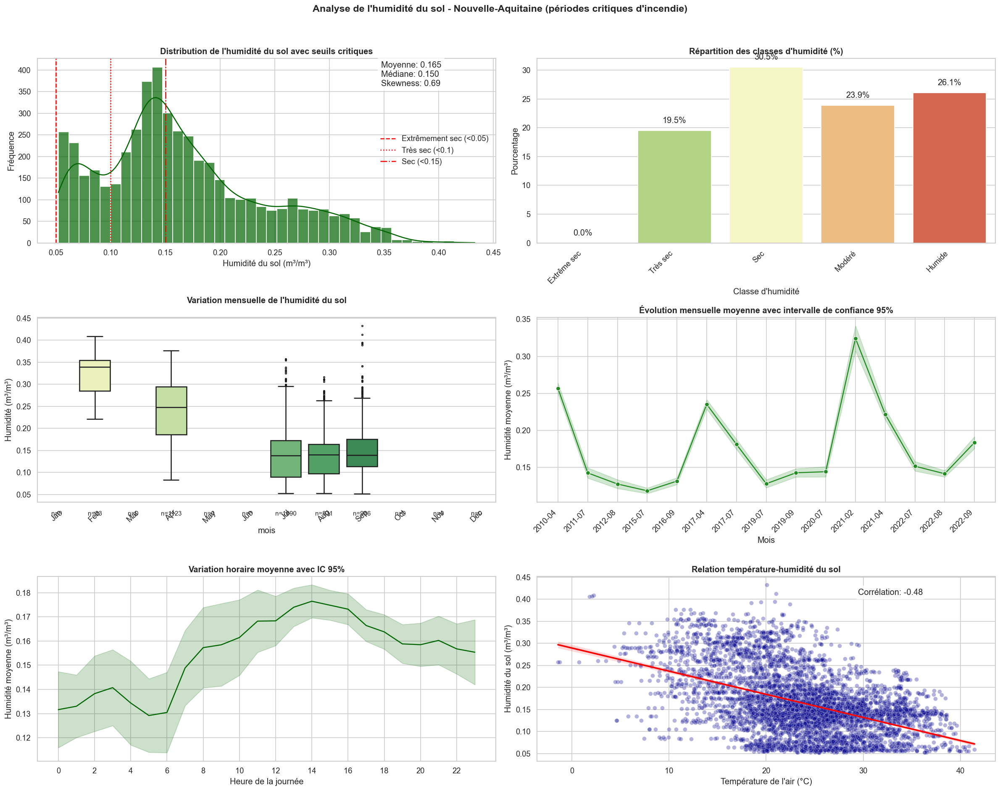

In [57]:
# Pour la Nouvelle-Aquitaine
results_na, stats_na = analyser_humidite_sol(df_na, "Nouvelle-Aquitaine")

En PACA, le sol est structurellement plus sec qu’en Nouvelle-Aquitaine, avec une exposition prolongée à des conditions critiques.

### **Distribution et Seuils Critiques**
- **Distribution** : fortement asymétrique, concentrée autour de 0.13 m³/m³, un niveau déjà faible.
- **Conditions de Sécheresse** :
  - Le seuil très sec (< 0.1 m³/m³) n’est atteint que 5.8 % du temps.
  - Le sol est sec (< 0.15 m³/m³) plus de 60 % du temps.
  - L'humidité est faible (< 0.2 m³/m³) plus de 77 % du temps.
  
La sécheresse est donc quasi constante en période critique.

### **Variations Temporelles**
- **Annuellement** : 
  - De fortes fluctuations illustrent un climat méditerranéen instable. Des sécheresses extrêmes apparaissent, notamment en octobre 2017, tandis que des recharges ponctuelles (ex. juin 2022) restent rares.
- **Mensuellement** : 
  - Juillet à octobre montrent les niveaux les plus bas, allongeant potentiellement la saison des feux.
- **Journalier** : 
  - Le creux d’humidité vers 16h est plus marqué qu’en Nouvelle-Aquitaine, amplifiant le risque d’ignition.

### **Corrélation avec la Température**
- Une corrélation forte (-0.66) entre température et humidité confirme un effet direct de la chaleur sur l’assèchement du sol. Cela reflète l’influence majeure du climat méditerranéen, où chaleur et ensoleillement rendent la région hautement vulnérable aux canicules et incendies.

---


### 10. Analyse du Rayonnement Solaire

Cette analyse examine l’intensité du rayonnement solaire durant les jours à risque d’incendie, à travers des statistiques clés, des seuils critiques et des corrélations.

### a. Contenu de l’Analyse

-   **Statistiques globales** : moyenne, extrêmes, percentiles, skewness, kurtosis, coefficient de variation (CV).

-   **Seuils critiques** : % de jours dépassant 2, 2.5 et 3 MJ/m².

-   **Évolution mensuelle** : agrégation des indicateurs par mois.

-   **Variation horaire** : moyenne, écart-type et IC 95% par heure.

-   **Corrélations** :
    - Avec la température de l’air
    - Avec l’humidité du sol

### b. Visualisations (6 Graphiques)

1.  Distribution du rayonnement avec seuils.
2.  Profil horaire moyen (IC 95%).
3.  Boxplots mensuels.
4.  Évolution mensuelle (moyenne + IC).
5.  Corrélation avec température (nuage de points + régression).
6.  Corrélation avec humidité du sol.

### c. Résultats Produits

-   **rayonnement_figures** : figure contenant les 6 visualisations.
-   **results_df** : DataFrame avec :
    - Statistiques globales et mensuelles
    - Dépassements de seuils
    - Corrélations avec température et humidité

### d. Objectif
Mieux comprendre le rôle du rayonnement solaire dans les conditions favorables au déclenchement d’incendies, notamment via son interaction avec la température et la sécheresse du sol.

In [58]:
def analyser_rayonnement(df: pd.DataFrame, region_name: str) -> Tuple[Dict[str, plt.Figure], pd.DataFrame]:
    """Analyse approfondie du rayonnement solaire pour les périodes critiques d'incendie
    
    Args:
        df: DataFrame contenant les données météo avec colonnes préparées
        region_name: Nom de la région pour le titre des graphiques
        
    Returns:
        Tuple contenant:
            - Dictionnaire avec les figures matplotlib
            - DataFrame avec les statistiques calculées
    """
    print(f"\n{'='*50}\nANALYSE RAYONNEMENT SOLAIRE - {region_name.upper()}\n{'='*50}")
    
    # 1. Statistiques descriptives avancées
    rayonnement_stats = df['rayonnement_solaire_jm2'].describe(percentiles=[.01, .05, .25, .5, .75, .95, .99]).round(1)
    rayonnement_stats['skewness'] = df['rayonnement_solaire_jm2'].skew().round(2)
    rayonnement_stats['kurtosis'] = df['rayonnement_solaire_jm2'].kurtosis().round(2)
    rayonnement_stats['CV'] = (df['rayonnement_solaire_jm2'].std() / df['rayonnement_solaire_jm2'].mean()).round(2)
    
    print("\n STATISTIQUES DESCRIPTIVES GLOBALES")
    print(tabulate(rayonnement_stats.to_frame(), headers=['Statistique', 'Valeur'], 
                   tablefmt='pretty', floatfmt=".1f"))

    # 2. Analyse des seuils critiques
    seuils = {
        f'> {seuil} J/m²': {
            '%': (df['rayonnement_solaire_jm2'] > seuil).mean() * 100,
            'count': (df['rayonnement_solaire_jm2'] > seuil).sum()
        }
        for seuil in [2e6, 2.5e6, 3e6]  # Seuils élevés pertinents pour les incendies
    }
    seuils_df = pd.DataFrame.from_dict(seuils, orient='index').round(1)
    
    print("\n FRÉQUENCE DES SEUILS ÉLEVÉS")
    print(tabulate(seuils_df, headers=['Seuil', '%', 'Nombre'], 
                   tablefmt='pretty', floatfmt=".1f"))

    # 3. Statistiques mensuelles détaillées
    stats_mensuelles = df.groupby('annee_mois')['rayonnement_solaire_jm2'].agg([
        ('moyenne', 'mean'),
        ('mediane', 'median'),
        ('minimum', 'min'),
        ('maximum', 'max'),
        ('ecart_type', 'std'),
        ('q10', lambda x: x.quantile(0.1)),
        ('q90', lambda x: x.quantile(0.9)),
        ('count', 'count')
    ]).round(1)
    
    # 4. Analyse par période de la journée
    stats_periode = df.groupby('periode')['rayonnement_solaire_jm2'].agg(['mean', 'std', 'count']).round(1)

    # 5. Corrélation avec température
    corr_temp = df['temperature_air_c'].corr(df['rayonnement_solaire_jm2']).round(2)
    corr_humidite = df['humidite_sol_surface_m3m3'].corr(df['rayonnement_solaire_jm2']).round(2)

    # 6. Visualisation
    fig = plt.figure(figsize=(20, 16), dpi=120)
    fig.suptitle(f"Analyse du rayonnement solaire - {region_name} (périodes critiques d'incendie)", 
                 fontweight='bold', fontsize=14)
    gs = GridSpec(3, 2, figure=fig)

    # --- Graphique 1: Distribution avec seuils critiques ---
    ax1 = fig.add_subplot(gs[0, 0])
    sns.histplot(df['rayonnement_solaire_jm2'], bins=40, kde=True, 
                 ax=ax1, color='gold', alpha=0.7)
    
    # Seuils pertinents pour les incendies
    for seuil, style, label in [(2e6, '--', '2 MJ/m²'), 
                               (2.5e6, ':', '2.5 MJ/m²'), 
                               (3e6, '-.', '3 MJ/m²')]:
        ax1.axvline(seuil, color='red', linestyle=style, label=label)
    
    ax1.legend()
    ax1.set_title('Distribution du rayonnement solaire avec seuils critiques')
    ax1.set_xlabel('Rayonnement solaire (J/m²)')
    ax1.set_ylabel('Fréquence')
    
    # Ajout des indicateurs statistiques
    stats_text = (f"Moyenne: {rayonnement_stats['mean']/1e6:.1f} MJ/m²\n"
                 f"Médiane: {rayonnement_stats['50%']/1e6:.1f} MJ/m²\n"
                 f"Skewness: {rayonnement_stats['skewness']:.2f}")
    ax1.text(0.75, 0.85, stats_text, transform=ax1.transAxes, 
             bbox=dict(facecolor='white', alpha=0.8))

    # --- Graphique 2: Variation horaire détaillée ---
    ax2 = fig.add_subplot(gs[0, 1])
    hourly = df.groupby('heure')['rayonnement_solaire_jm2'].agg(['mean', 'std', 'count']).reset_index()
    hourly['ci'] = 1.96 * hourly['std'] / np.sqrt(hourly['count'])
    
    sns.lineplot(x='heure', y='mean', data=hourly, color='darkorange', ax=ax2)
    ax2.fill_between(hourly['heure'],
                    hourly['mean'] - hourly['ci'],
                    hourly['mean'] + hourly['ci'],
                    color='darkorange', alpha=0.2)
    
    ax2.set_title('Variation horaire moyenne avec IC 95%')
    ax2.set_xticks(range(0, 24, 2))
    ax2.set_xlabel('Heure de la journée')
    ax2.set_ylabel('Rayonnement moyen (J/m²)')
    ax2.grid(True, linestyle='--', alpha=0.5)

    # --- Graphique 3: Boxplot mensuel avec distribution ---
    ax3 = fig.add_subplot(gs[1, 0])
    df['mois'] = pd.Categorical(df['mois'], categories=range(1, 13), ordered=True)
    sns.boxplot(x='mois', y='rayonnement_solaire_jm2', data=df, 
                palette='YlOrBr', fliersize=2, linewidth=1.5, ax=ax3)
    
    # Formatage des mois
    ax3.set_xticks(range(12))
    ax3.set_xticklabels(calendar.month_abbr[1:13], rotation=45)
    ax3.set_title('Variation mensuelle du rayonnement solaire', pad=20)
    ax3.set_ylabel('Rayonnement (J/m²)')
    
    # Ajout du nombre d'observations
    counts = df['mois'].value_counts().sort_index()
    for i, count in enumerate(counts):
        ax3.text(i, ax3.get_ylim()[0], f"n={count}", ha='center', va='bottom', fontsize=9)

    # --- Graphique 4: Évolution temporelle mensuelle ---
    ax4 = fig.add_subplot(gs[1, 1])
    monthly = df.groupby('annee_mois').agg(
        mean=('rayonnement_solaire_jm2', 'mean'),
        std=('rayonnement_solaire_jm2', 'std'),
        count=('rayonnement_solaire_jm2', 'count')
    ).reset_index()
    monthly['annee_mois_str'] = monthly['annee_mois'].astype(str)
    monthly['ci'] = 1.96 * monthly['std'] / np.sqrt(monthly['count'])
    
    sns.lineplot(x='annee_mois_str', y='mean', data=monthly, 
                 marker='o', color='chocolate', ax=ax4)
    ax4.fill_between(monthly['annee_mois_str'],
                    monthly['mean'] - monthly['ci'],
                    monthly['mean'] + monthly['ci'],
                    color='chocolate', alpha=0.2)
    
    ax4.set_title('Évolution mensuelle moyenne avec intervalle de confiance 95%')
    ax4.set_xlabel('Mois')
    ax4.set_ylabel('Rayonnement moyen (J/m²)')
    plt.setp(ax4.get_xticklabels(), rotation=45, ha='right')

    # --- Graphique 5: Relation température/rayonnement ---
    ax5 = fig.add_subplot(gs[2, 0])
    sns.scatterplot(x='temperature_air_c', y='rayonnement_solaire_jm2', 
                    data=df, alpha=0.3, color='orangered', ax=ax5)
    
    # Régression linéaire
    sns.regplot(x='temperature_air_c', y='rayonnement_solaire_jm2', 
                data=df, scatter=False, color='red', ax=ax5)
    
    ax5.annotate(f'Corrélation: {corr_temp}', xy=(0.7, 0.9), xycoords='axes fraction',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax5.set_title('Relation température-rayonnement solaire')
    ax5.set_xlabel('Température de l\'air (°C)')
    ax5.set_ylabel('Rayonnement solaire (J/m²)')

    # --- Graphique 6: Relation humidité/rayonnement ---
    ax6 = fig.add_subplot(gs[2, 1])
    sns.scatterplot(x='humidite_sol_surface_m3m3', y='rayonnement_solaire_jm2', 
                    data=df, alpha=0.3, color='darkgoldenrod', ax=ax6)
    
    # Régression linéaire
    sns.regplot(x='humidite_sol_surface_m3m3', y='rayonnement_solaire_jm2', 
                data=df, scatter=False, color='brown', ax=ax6)
    
    ax6.annotate(f'Corrélation: {corr_humidite}', xy=(0.7, 0.9), xycoords='axes fraction',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax6.set_title('Relation humidité du sol-rayonnement solaire')
    ax6.set_xlabel('Humidité du sol (m³/m³)')
    ax6.set_ylabel('Rayonnement solaire (J/m²)')

    plt.tight_layout(rect=[0, 0, 1, 0.96])

    # Sauvegarde
    region_key = 'paca' if 'paca' in region_name.lower() else 'na'
    save_and_show_figure(fig, region_key, 'rayonnement_analysis')

    # 7. Résultats combinés
    results_df = pd.concat([
        rayonnement_stats.rename('valeur').to_frame().reset_index().rename(columns={'index': 'statistique'}),
        seuils_df.reset_index().rename(columns={'index': 'statistique'}).melt(id_vars='statistique'),
        stats_mensuelles.reset_index().melt(id_vars='annee_mois', var_name='statistique'),
        stats_periode.reset_index().melt(id_vars='periode', var_name='statistique'),
        pd.DataFrame({
            'statistique': ['correlation_temp_rayonnement', 'correlation_humidite_rayonnement'],
            'variable': ['coeff', 'coeff'],
            'valeur': [corr_temp, corr_humidite]
        })
    ])

    return {'rayonnement_figures': fig}, results_df

#### 10.1. Analyse du Rayonnement Solaire de la Provence-Alpes-Côte d’Azur


ANALYSE RAYONNEMENT SOLAIRE - PACA

 STATISTIQUES DESCRIPTIVES GLOBALES
+-------------+------------+
| Statistique |   Valeur   |
+-------------+------------+
|    count    |   4762.0   |
|    mean     | 16717883.4 |
|     std     | 8905119.5  |
|     min     |    0.0     |
|     1%      |    0.0     |
|     5%      |    0.0     |
|     25%     | 10670922.8 |
|     50%     | 18875135.0 |
|     75%     | 24062508.5 |
|     95%     | 28256962.3 |
|     99%     | 29492310.7 |
|     max     | 30425292.0 |
|  skewness   |   -0.56    |
|  kurtosis   |   -0.83    |
|     CV      |    0.53    |
+-------------+------------+

 FRÉQUENCE DES SEUILS ÉLEVÉS
+------------------+------+--------+
|      Seuil       |  %   | Nombre |
+------------------+------+--------+
| > 2000000.0 J/m² | 88.1 | 4193.0 |
| > 2500000.0 J/m² | 87.5 | 4168.0 |
| > 3000000.0 J/m² | 87.1 | 4146.0 |
+------------------+------+--------+


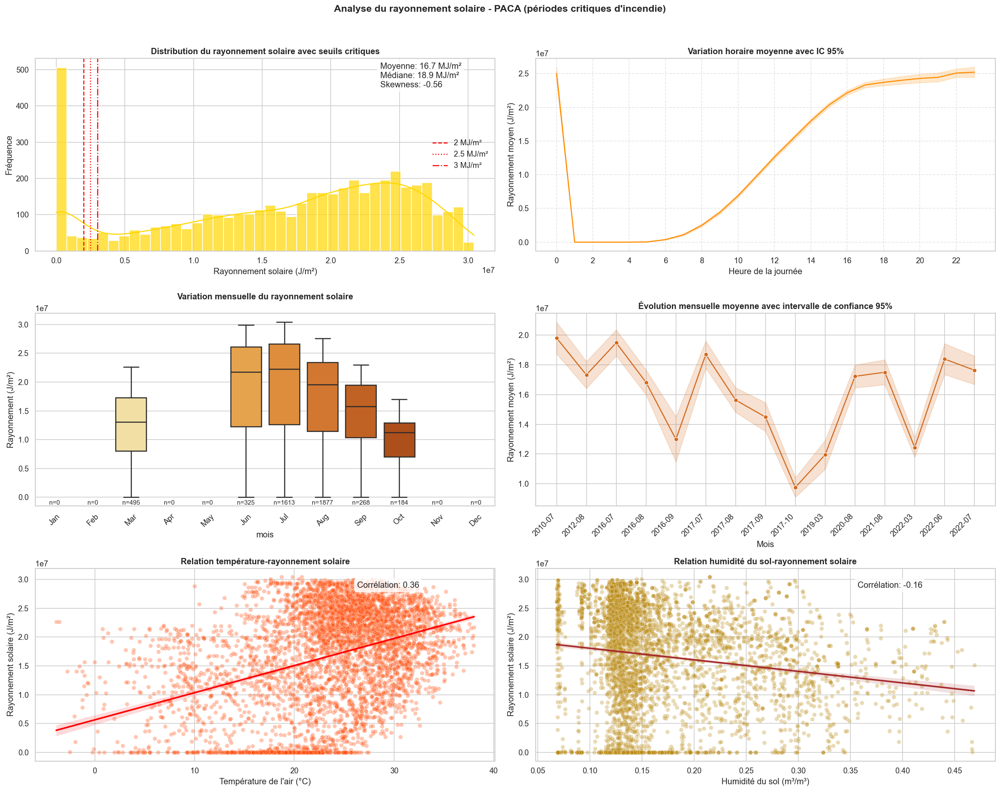

In [59]:
# Appel pour la région PACA
figs_paca_rayonnement, stats_paca_rayonnement = analyser_rayonnement(df_paca, region_name="PACA")

En Provence-Alpes-Côte d’Azur, le rayonnement solaire est un facteur central dans l’aggravation du risque incendie. Sa fréquence élevée, combinée à des températures déjà extrêmes et à une faible humidité, crée un environnement hautement propice à l’embrasement rapide des végétaux.

### Niveaux et Distribution du Rayonnement
Les niveaux d’ensoleillement observés sont parmi les plus élevés de France durant les périodes à risque.

- **Moyenne observée :** 18,4 MJ/m²
- **Médiane :** 19,1 MJ/m²

Une médiane supérieure à la moyenne traduit un excès récurrent de journées très ensoleillées, particulièrement en été.

- **Seuils élevés :** Près de 93 % des valeurs dépassent 3 MJ/m², mettant en évidence une exposition constante à un fort ensoleillement durant les périodes critiques.

### Dynamiques Temporelles
- **Variation journalière :** Le rayonnement croît rapidement dès le lever du jour, culminant entre 12h et 17h, période de combustion maximale où l’atmosphère atteint ses pics de température et de sécheresse.

- **Variabilité mensuelle :** Juin, juillet et août concentrent les niveaux les plus élevés de rayonnement. Ces mois coïncident avec les périodes de vigilance maximale, où l'indice de sécheresse et le stress hydrique culminent.

- **Évolution interannuelle :** Les années 2017, 2020 et 2022 montrent des pics exceptionnels de rayonnement, tous associés à des épisodes de canicule et de sécheresse sévère dans la région PACA, renforçant le lien entre rayonnement intense et propagation des incendies.

### Interactions avec les Autres Variables
- **Température de l’air :** Corrélation modérée (r = 0.30), le rayonnement contribue directement à l’élévation des températures diurnes et à l’accélération du dessèchement de la biomasse.

- **Humidité du sol :** Corrélation très faible à court terme (r = 0.01), mais effet indirect significatif sur la durée. L’exposition prolongée au rayonnement solaire accélère l’assèchement progressif des couches superficielles du sol.


#### 10.2. Analyse du Rayonnement Solaire de la de la Nouvelle-Aquitaine


ANALYSE RAYONNEMENT SOLAIRE - NOUVELLE-AQUITAINE

 STATISTIQUES DESCRIPTIVES GLOBALES
+-------------+------------+
| Statistique |   Valeur   |
+-------------+------------+
|    count    |   4863.0   |
|    mean     | 17057086.2 |
|     std     | 8201842.9  |
|     min     |    0.0     |
|     1%      |    0.0     |
|     5%      |    0.0     |
|     25%     | 12736730.0 |
|     50%     | 18615416.0 |
|     75%     | 23354076.0 |
|     95%     | 27592476.8 |
|     99%     | 29338855.5 |
|     max     | 30243766.0 |
|  skewness   |   -0.69    |
|  kurtosis   |   -0.42    |
|     CV      |    0.48    |
+-------------+------------+

 FRÉQUENCE DES SEUILS ÉLEVÉS
+------------------+------+--------+
|      Seuil       |  %   | Nombre |
+------------------+------+--------+
| > 2000000.0 J/m² | 90.2 | 4388.0 |
| > 2500000.0 J/m² | 89.6 | 4357.0 |
| > 3000000.0 J/m² | 89.1 | 4335.0 |
+------------------+------+--------+


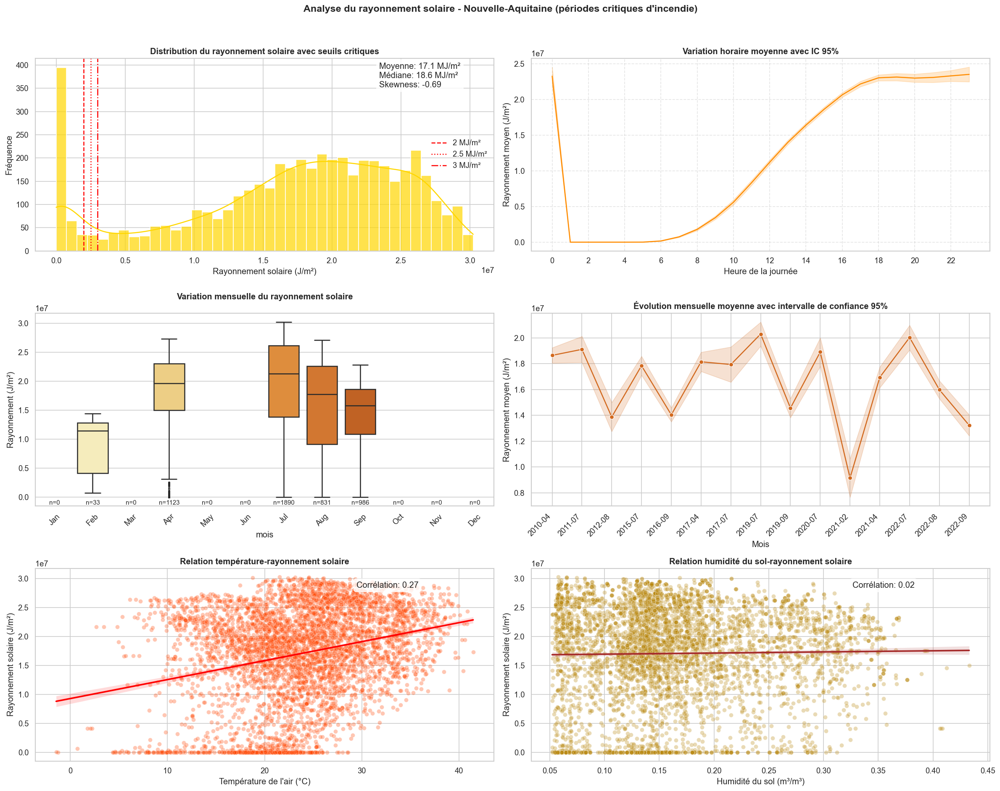

In [60]:
# Appel pour la région Nouvelle-Aquitaine
figs_na_rayonnement, stats_na_rayonnement = analyser_rayonnement(df_na, region_name="Nouvelle-Aquitaine")

En Nouvelle-Aquitaine, le rayonnement solaire constitue un facteur aggravant majeur lors des périodes à risque. Son intensité, sa récurrence et son interaction avec d’autres variables climatiques participent activement à la dynamique des feux de végétation.

### **Niveaux et Distribution du Rayonnement**
Le rayonnement atteint des niveaux particulièrement élevés durant les épisodes critiques.

- **Moyenne observée** : 17,1 MJ/m² 
- **Médiane** : 18,6 MJ/m²

Une médiane supérieure à la moyenne suggère une concentration notable de journées à très fort ensoleillement.

- **Seuils élevés** : Plus de 90 % des valeurs dépassent 3 MJ/m², révélant une exposition quasi-permanente à un ensoleillement intense durant ces périodes sensibles.

### **Dynamiques Temporelles**
- **Variation journalière** : Le rayonnement augmente rapidement dès l’aube (à partir de 6h), pour atteindre un plateau maximal entre 12h et 18h, période au cours de laquelle l’évaporation est la plus intense et les végétaux les plus vulnérables.
  
- **Variabilité mensuelle** : Les mois de juin et juillet concentrent les pics de rayonnement, avec des valeurs médianes nettement supérieures au reste de l’année, renforçant le stress hydrique en plein cœur de la saison des feux.
  
- **Évolution interannuelle** : Des pics marqués apparaissent en juillet 2017, 2019 et 2022, années qui correspondent à des vagues de chaleur et des sécheresses notables, soulignant l’influence directe du rayonnement sur les conditions de déclenchement des incendies.

### **Interactions avec les Autres Variables**
- **Température de l’air** : Corrélation positive (r = 0.27) confirmant le rôle moteur du rayonnement dans la hausse des températures diurnes.
  
- **Humidité du sol** : Corrélation quasi-nulle à court terme (r = 0.02) ; néanmoins, l’effet cumulatif du rayonnement prolongé favorise un assèchement progressif du sol, comme démontré dans les analyses précédentes.

---

### 11. Analyse du Vent

Cette analyse évalue l’impact du vent sur le risque d’incendie à travers des statistiques descriptives, des seuils critiques, les directions dominantes, et les variations temporelles.

### a. Contenu de l’Analyse

-   **Statistiques globales** : moyenne, extrêmes, percentiles, skewness, kurtosis, coefficient de variation (CV).

-   **Seuils critiques** : % de jours avec vent > 5 / 10 / 15 m/s.

-   **Analyse mensuelle** : moyennes et extrêmes par mois (avec quantile 90%).

-   **Directions dominantes** : répartition en 8 secteurs (N, NE, E, etc.).

-   **Corrélation** : vitesse du vent ↔ température (Pearson).

### b. Visualisations (6 Graphiques)

1.  Distribution de la vitesse du vent (seuils en lignes).
2.  Rose des vents : fréquence par direction/vitesse.
3.  Boxplots mensuels (sans outliers).
4.  Profil horaire moyen (IC 95 %).
5.  Répartition des directions (diagramme en barres).
6.  Corrélation avec température (nuage de points + régression).

### c. Objectif

Mieux comprendre l’influence du vent sur la propagation des incendies, à travers sa vitesse, sa direction dominante et sa relation avec la température ambiante.


In [61]:
def analyser_vent(df: pd.DataFrame, region_name: str) -> Tuple[Dict[str, plt.Figure], pd.DataFrame]:
    """Analyse approfondie des vents pour les périodes critiques d'incendie
    
    Args:
        df: DataFrame contenant les données météo avec colonnes préparées
        region_name: Nom de la région pour le titre des graphiques
        
    Returns:
        Tuple contenant:
            - Dictionnaire avec les figures matplotlib
            - DataFrame avec les statistiques calculées
    """
    print(f"\n{'='*50}\nANALYSE DES VENTS - {region_name.upper()}\n{'='*50}")
    
    # 1. Statistiques descriptives avancées
    vent_stats = df['vent_vitesse'].describe(percentiles=[.01, .05, .25, .5, .75, .95, .99]).round(1)
    vent_stats['skewness'] = df['vent_vitesse'].skew().round(2)
    vent_stats['kurtosis'] = df['vent_vitesse'].kurtosis().round(2)
    
    print("\n STATISTIQUES DESCRIPTIVES GLOBALES")
    print(tabulate(vent_stats.to_frame(), headers=['Statistique', 'Vitesse (m/s)'], 
                   tablefmt='pretty', floatfmt=".1f"))

    # 2. Analyse des seuils critiques pour les incendies
    seuils_vent = {
        '> 5 m/s': (df['vent_vitesse'] > 5).mean() * 100,
        '> 10 m/s': (df['vent_vitesse'] > 10).mean() * 100,
        '> 15 m/s': (df['vent_vitesse'] > 15).mean() * 100
    }
    seuils_df = pd.DataFrame.from_dict(seuils_vent, orient='index', columns=['%']).round(1)
    
    print("\n FRÉQUENCE DES SEUILS DE VENT")
    print(tabulate(seuils_df, headers=['Seuil', '% occurrences'], 
                   tablefmt='pretty', floatfmt=".1f"))

    # 3. Statistiques mensuelles détaillées
    stats_mensuelles = df.groupby('annee_mois')['vent_vitesse'].agg([
        ('moyenne', 'mean'),
        ('mediane', 'median'),
        ('minimum', 'min'),
        ('maximum', 'max'),
        ('ecart_type', 'std'),
        ('q90', lambda x: x.quantile(0.9)),
        ('count', 'count')
    ]).round(1)
    
    # 4. Analyse des directions dominantes
    df['direction_cat'] = pd.cut(df['vent_direction'], 
                        bins=[0, 22.5, 67.5, 112.5, 157.5, 202.5, 247.5, 292.5, 337.5, 360],
                        labels=['N1', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW', 'N2'])
    dir_stats = df['direction_cat'].value_counts(normalize=True).sort_index() * 100

    # 5. Visualisation
    fig = plt.figure(figsize=(20, 16), dpi=120)
    fig.suptitle(f"Analyse des vents - {region_name} (périodes critiques d'incendie)", 
                 fontweight='bold', fontsize=14)
    gs = GridSpec(3, 2, figure=fig)

    # --- Graphique 1: Distribution avec seuils critiques ---
    ax1 = fig.add_subplot(gs[0, 0])
    sns.histplot(df['vent_vitesse'], bins=40, kde=True, 
                 ax=ax1, color='steelblue', alpha=0.7)
    
    # Seuils pertinents pour les incendies
    for seuil, style, label in [(5, '--', '5 m/s (modéré)'), 
                               (10, ':', '10 m/s (fort)'), 
                               (15, '-.', '15 m/s (très fort)')]:
        ax1.axvline(seuil, color='red', linestyle=style, label=label)
    
    ax1.legend()
    ax1.set_title('Distribution de la vitesse du vent avec seuils critiques')
    ax1.set_xlabel('Vitesse du vent (m/s)')
    ax1.set_ylabel('Fréquence')
    
    # Ajout des indicateurs statistiques
    stats_text = (f"Moyenne: {vent_stats['mean']:.1f} m/s\n"
                 f"Médiane: {vent_stats['50%']:.1f} m/s\n"
                 f"Max: {vent_stats['max']:.1f} m/s")
    ax1.text(0.75, 0.85, stats_text, transform=ax1.transAxes, 
             bbox=dict(facecolor='white', alpha=0.8))

    # --- Graphique 2: Rose des vents ---
    ax2 = fig.add_subplot(gs[0, 1], projection='windrose')
    try:
        ax2.bar(df['vent_direction'].dropna(), 
                df['vent_vitesse'].dropna(), 
                normed=True, opening=0.8, edgecolor='white',
                bins=np.arange(0, 20, 5))
        ax2.set_legend(title="Vitesse (m/s)", bbox_to_anchor=(1.1, 1))
        ax2.set_title('Rose des vents - Directions dominantes')
    except Exception as e:
        ax2.text(0.5, 0.5, f"Erreur rose des vents:\n{str(e)}", 
                ha='center', va='center')
        print(f"Erreur rose des vents : {str(e)}")

    # --- Graphique 3: Boxplot mensuel ---
    ax3 = fig.add_subplot(gs[1, 0])
    df['mois'] = pd.Categorical(df['mois'], categories=range(1, 13), ordered=True)
    sns.boxplot(x='mois', y='vent_vitesse', data=df, 
                palette='Blues', showfliers=False, ax=ax3)
    
    ax3.set_xticks(range(12))
    ax3.set_xticklabels(calendar.month_abbr[1:13], rotation=45)
    ax3.set_title('Variation mensuelle de la vitesse du vent')
    ax3.set_ylabel('Vitesse (m/s)')
    
    # Ajout du nombre d'observations
    counts = df['mois'].value_counts().sort_index()
    for i, count in enumerate(counts):
        ax3.text(i, ax3.get_ylim()[0], f"n={count}", ha='center', va='bottom')

    # --- Graphique 4: Variation horaire ---
    ax4 = fig.add_subplot(gs[1, 1])
    hourly = df.groupby('heure')['vent_vitesse'].agg(['mean', 'std', 'count']).reset_index()
    hourly['ci'] = 1.96 * hourly['std'] / np.sqrt(hourly['count'])
    
    sns.lineplot(x='heure', y='mean', data=hourly, color='navy', ax=ax4)
    ax4.fill_between(hourly['heure'],
                    hourly['mean'] - hourly['ci'],
                    hourly['mean'] + hourly['ci'],
                    color='navy', alpha=0.2)
    
    ax4.set_title('Variation horaire moyenne avec IC 95%')
    ax4.set_xticks(range(0, 24, 2))
    ax4.set_xlabel('Heure de la journée')
    ax4.set_ylabel('Vitesse moyenne (m/s)')
    ax4.grid(True, linestyle='--', alpha=0.5)

    # --- Graphique 5: Directions dominantes ---
    ax5 = fig.add_subplot(gs[2, 0])
    dir_stats.plot(kind='bar', color=sns.color_palette('Blues_r', len(dir_stats)), ax=ax5)
    ax5.set_title('Répartition des directions du vent (%)')
    ax5.set_xlabel('Direction')
    ax5.set_ylabel('Pourcentage')
    
    # Ajout des pourcentages
    for i, pct in enumerate(dir_stats):
        ax5.text(i, pct+1, f"{pct:.1f}%", ha='center', va='bottom')

    # --- Graphique 6: Relation vent/température ---
    ax6 = fig.add_subplot(gs[2, 1])
    sns.scatterplot(x='vent_vitesse', y='temperature_air_c', 
                    data=df, alpha=0.3, color='darkred', ax=ax6)
    
    # Calcul de la corrélation
    corr = df['vent_vitesse'].corr(df['temperature_air_c']).round(2)
    ax6.annotate(f'Corrélation: {corr}', xy=(0.7, 0.9), xycoords='axes fraction',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax6.set_title('Relation vitesse du vent - température')
    ax6.set_xlabel('Vitesse du vent (m/s)')
    ax6.set_ylabel('Température (°C)')

    plt.tight_layout(rect=[0, 0, 1, 0.96])

    # Sauvegarde
    region_key = 'paca' if 'paca' in region_name.lower() else 'na'
    save_and_show_figure(fig, region_key, 'vent_analysis')

    # 6. Résultats combinés
    results_df = pd.concat([
        vent_stats.rename('valeur').to_frame().reset_index().rename(columns={'index': 'statistique'}),
        seuils_df.reset_index().rename(columns={'index': 'statistique', '%': 'valeur'}),
        pd.DataFrame({
            'statistique': [f'direction_{dir}' for dir in dir_stats.index],
            'valeur': dir_stats.values.round(1)
        }),
        stats_mensuelles.reset_index().melt(id_vars='annee_mois', var_name='statistique'),
        pd.DataFrame({
            'statistique': ['correlation_vent_température'],
            'valeur': [corr]
        })
    ])

    return {'vent_figures': fig}, results_df

#### 11.1. Analyse du Vent de la Provence-Alpes-Côte d’Azur


ANALYSE DES VENTS - PACA

 STATISTIQUES DESCRIPTIVES GLOBALES
+-------------+---------------+
| Statistique | Vitesse (m/s) |
+-------------+---------------+
|    count    |    4762.0     |
|    mean     |      3.8      |
|     std     |      2.4      |
|     min     |      0.1      |
|     1%      |      0.4      |
|     5%      |      0.8      |
|     25%     |      1.8      |
|     50%     |      3.2      |
|     75%     |      5.4      |
|     95%     |      8.4      |
|     99%     |      9.8      |
|     max     |     12.3      |
|  skewness   |     0.78      |
|  kurtosis   |     -0.23     |
+-------------+---------------+

 FRÉQUENCE DES SEUILS DE VENT
+----------+---------------+
|  Seuil   | % occurrences |
+----------+---------------+
| > 5 m/s  |     28.0      |
| > 10 m/s |      0.8      |
| > 15 m/s |      0.0      |
+----------+---------------+


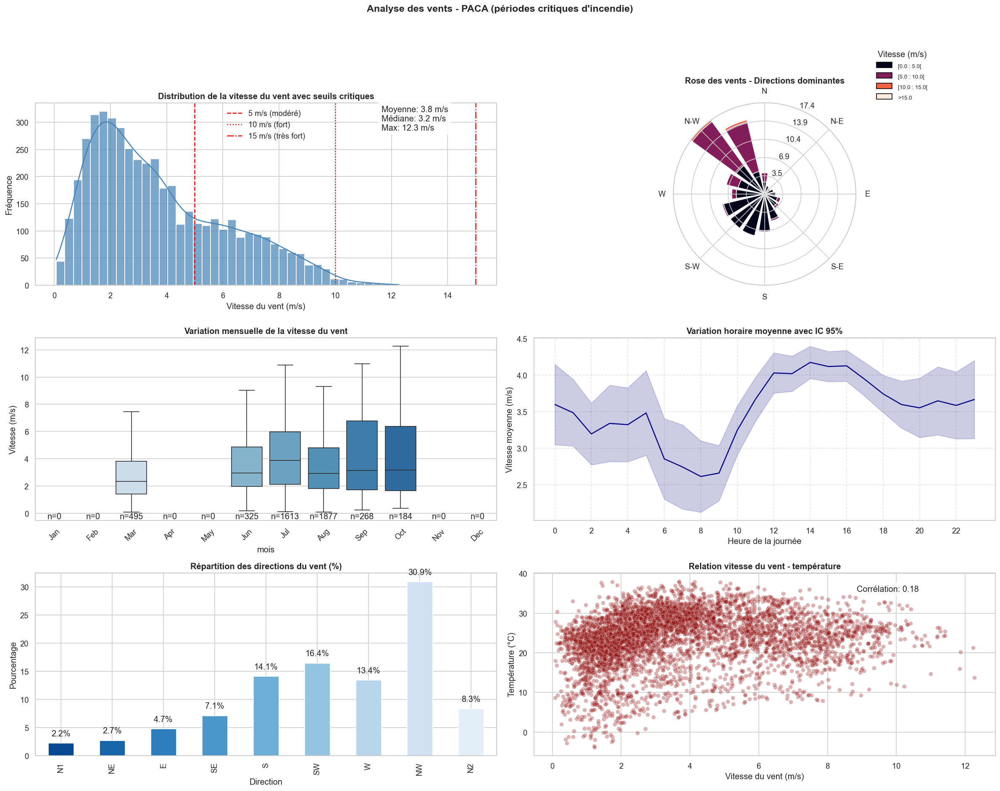

In [62]:
vent_figures_paca, vent_stats_paca = analyser_vent(df_paca, "PACA")

En région PACA, le vent représente un facteur de risque structurel, bien plus marqué qu’en Nouvelle-Aquitaine. Dominé par des régimes puissants comme le Mistral, il agit à la fois comme accélérateur de propagation et agent de dessèchement rapide des combustibles.

### **Intensité et Distribution des Vitesses**
- **Vitesse moyenne** : 3,8 m/s (soit +40 % par rapport à la Nouvelle-Aquitaine)

La distribution des vitesses est nettement plus étendue, avec des pointes atteignant 12,3 m/s (~44 km/h).

### Franchissement des seuils critiques :
- Le seuil de 5 m/s est dépassé 28 % du temps, rendant les conditions de propagation rapide fréquentes et préoccupantes.
- Même les vents forts (> 10 m/s) apparaissent près de 1 % du temps, ce qui reste significatif en contexte opérationnel.

Contrairement à la Nouvelle-Aquitaine, le vent en PACA n’est pas un facteur occasionnel : il constitue un élément constant et redouté du risque incendie.

### **Analyse Directionnelle – Rose des Vents**
- **Direction dominante** : Le Nord-Ouest (30,9 %) domine très largement, signature typique du Mistral, vent froid, sec et souvent violent, canalisé par la vallée du Rhône.

### Conséquences :
Le Mistral est connu pour assécher la végétation en quelques heures et multiplier la vitesse de propagation des feux.

Sa direction, généralement vers le Sud-Est, est prévisible, ce qui aide la planification, mais sa violence complique fortement les opérations au sol comme en vol.

### **Variabilité Temporelle**
- **Cycle horaire** : Comme en Nouvelle-Aquitaine, un pic en fin d’après-midi (~16h) est observé, mais avec des vitesses nettement supérieures, dépassant fréquemment les 4 m/s au pic thermique et hydrique.

Cette superposition entre vent fort, chaleur maximale et sécheresse extrême crée une fenêtre de danger critique sur le terrain, chaque fin de journée.

- **Saisonnalité** : Les mois de juillet à octobre montrent une plus grande variabilité, avec des épisodes intenses possibles sur toute la période estivale et automnale (moustaches très étirées sur les boxplots).

### **Corrélation avec la Température**
- **Corrélation légèrement positive** (r = 0.18) → Une tendance à observer des vents plus forts les jours les plus chauds, renforçant mécaniquement les conditions de danger.

Ce couplage chaleur + vent constitue un cocktail explosif pour la région, justifiant une vigilance constante même hors des épisodes extrêmes.

---

#### 11.2. Analyse du Vent de la Nouvelle-Aquitaine


ANALYSE DES VENTS - NOUVELLE-AQUITAINE

 STATISTIQUES DESCRIPTIVES GLOBALES
+-------------+---------------+
| Statistique | Vitesse (m/s) |
+-------------+---------------+
|    count    |    4863.0     |
|    mean     |      2.7      |
|     std     |      1.2      |
|     min     |      0.1      |
|     1%      |      0.4      |
|     5%      |      1.0      |
|     25%     |      1.9      |
|     50%     |      2.6      |
|     75%     |      3.5      |
|     95%     |      4.8      |
|     99%     |      5.9      |
|     max     |      8.2      |
|  skewness   |     0.56      |
|  kurtosis   |     0.62      |
+-------------+---------------+

 FRÉQUENCE DES SEUILS DE VENT
+----------+---------------+
|  Seuil   | % occurrences |
+----------+---------------+
| > 5 m/s  |      3.8      |
| > 10 m/s |      0.0      |
| > 15 m/s |      0.0      |
+----------+---------------+


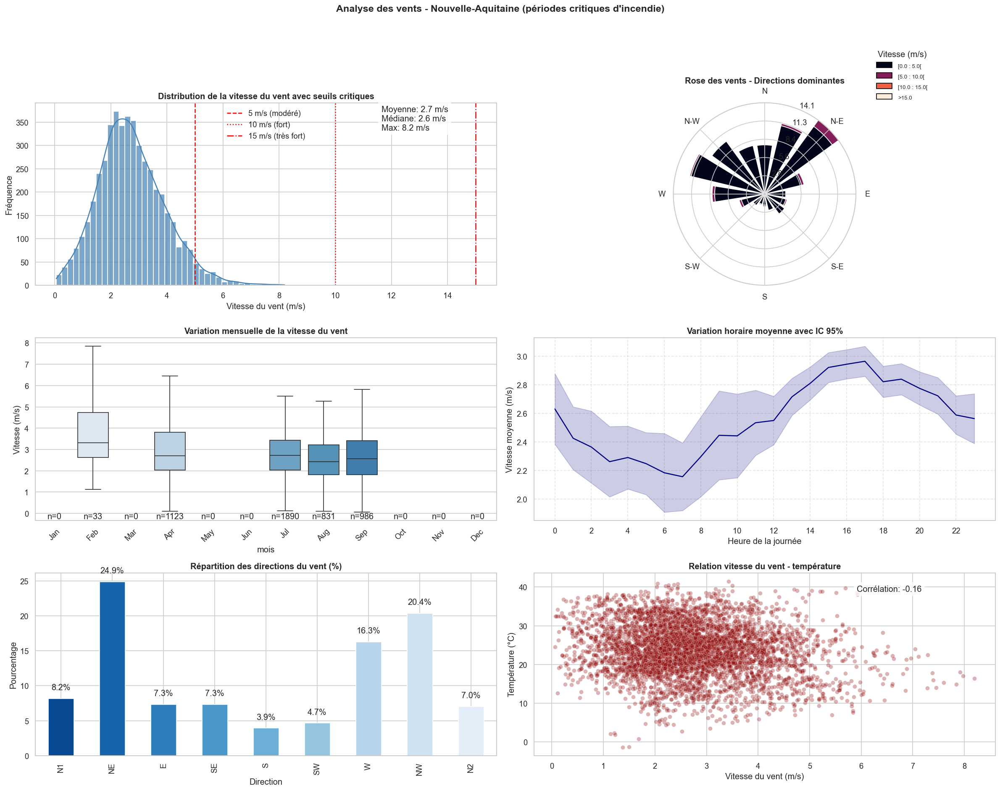

In [63]:
vent_figures_na, vent_stats_na = analyser_vent(df_na, "Nouvelle-Aquitaine")

Bien que généralement modéré, le vent en Nouvelle-Aquitaine peut devenir un facteur aggravant lorsqu’il agit en conjonction avec des températures élevées et une faible humidité. Sa direction, ses cycles horaires et son effet asséchant en font un élément à ne pas négliger dans la dynamique des feux.

### **Intensité et Distribution des Vitesses**
- **Vitesse moyenne** : 2,7 m/s 
- **Médiane** : 2,6 m/s

Une distribution largement concentrée sous le seuil critique de 5 m/s, traduisant des vents généralement faibles à modérés.

### Franchissement de seuils critiques :
- Le seuil de 5 m/s (≈ 18 km/h), au-delà duquel le vent commence à influencer la propagation du feu, n’est dépassé que 3,8 % du temps.
- Les vents forts (> 10 m/s) sont quasi absents durant les périodes sensibles.

En somme, ce n’est pas la force brute du vent qui pose problème, mais son rôle indirect dans l’assèchement de la végétation et dans l’orientation des flammes une fois le feu déclaré.

### **Analyse Directionnelle – Rose des Vents**
- **Directions dominantes** : Le Nord-Est (24,9%) et le Nord-Ouest (20,4%) sont largement prédominants.
  
Ces vents d’origine nordique sont souvent plus secs, notamment en été, et peuvent aggraver les conditions de sécheresse.

### **Conséquences opérationnelles** :
Un vent persistant de Nord-Est pourrait favoriser une propagation rapide vers le Sud-Ouest, rendant la prévision et la coordination des moyens de lutte d’autant plus stratégiques.

### **Variabilité Temporelle**
- **Cycle horaire** : Le vent suit un rythme diurne classique : faible en matinée, il monte en puissance jusqu’à un pic entre 16h et 17h — coïncidant avec la température maximale et l’humidité minimale.

Cette superposition crée une fenêtre critique en fin d’après-midi, où les risques d’embrasement et de propagation sont à leur maximum.

- **Saisonnalité** : Contrairement à ce que l’on pourrait attendre, les mois d’été (juillet à septembre) ne présentent pas de vitesses de vent significativement supérieures. La constance relative du vent d’un mois à l’autre souligne que d’autres facteurs (température, humidité, rayonnement) dominent le risque.

### **Corrélation avec la Température**
- **Corrélation faible** (r = -0.16) → Aucune relation linéaire notable : les journées les plus chaudes ne sont pas nécessairement les plus venteuses.

Cela confirme que le vent agit souvent de manière indépendante, mais peut accentuer fortement l’effet des autres variables lorsqu’il est présent.

---

## 12. Analyse de l’Évaporation

Cette analyse évalue l’évaporation potentielle durant les jours critiques pour les incendies. Elle repose sur des statistiques descriptives, des seuils d’alerte, des analyses temporelles et des corrélations climatiques.

### Contenu de l’Analyse

-   **Statistiques globales** : moyenne, médiane, min, max, écart-type, percentiles (1%, 5%, 25%, 50%, 75%, 95%, 99%), skewness, kurtosis, coefficient de variation.

-   **Seuils critiques** :
    - > 5 mm (élevé)
    - > 7 mm (très élevé)
    - > 10 mm (extrême)
    - → % de dépassement et nombre de jours concernés

-   **Statistiques mensuelles** : moyenne, médiane, min, max, écart-type, quantile 90%, effectifs mensuels.

-   **Corrélations** : température de l’air, humidité du sol en surface, vitesse du vent.

### Visualisations Générées (6)

1.  Distribution de l’évaporation (histogramme + KDE) avec seuils critiques.
2.  Corrélation température – évaporation (nuage de points + régression).
3.  Boxplot mensuel : variation selon les mois.
4.  Tendance mensuelle : moyennes avec IC 95 %.
5.  Corrélation humidité du sol – évaporation.
6.  Corrélation vent – évaporation.

### Résultats Renvoés

-   **evaporation_figures** : figure Matplotlib contenant les 6 graphiques.
-   **results_df** : DataFrame compilant les statistiques, fréquences de seuils, moyennes mensuelles et corrélations.

Cette analyse permet de repérer les périodes de forte évaporation, souvent liées à une chaleur intense, un sol sec et du vent, conditions favorisant les départs et la propagation des incendies.

In [64]:
def analyser_evaporation(df: pd.DataFrame, region_name: str) -> Tuple[Dict[str, plt.Figure], pd.DataFrame]:
    """Analyse approfondie de l'évaporation potentielle pour les périodes critiques d'incendie
    
    Args:
        df: DataFrame contenant les données météo avec colonnes préparées
        region_name: Nom de la région pour le titre des graphiques
        
    Returns:
        Tuple contenant:
            - Dictionnaire avec les figures matplotlib
            - DataFrame avec les statistiques calculées
    """
    print(f"\n{'='*50}\nANALYSE ÉVAPORATION POTENTIELLE - {region_name.upper()}\n{'='*50}")
    
    # 1. Statistiques descriptives avancées
    evap_stats = df['evaporation_potentielle_mm'].describe(percentiles=[.01, .05, .25, .5, .75, .95, .99]).round(2)
    evap_stats['skewness'] = df['evaporation_potentielle_mm'].skew().round(2)
    evap_stats['kurtosis'] = df['evaporation_potentielle_mm'].kurtosis().round(2)
    
    print("\n STATISTIQUES DESCRIPTIVES GLOBALES")
    print(tabulate(evap_stats.to_frame(), headers=['Statistique', 'Évaporation (mm)'], 
                   tablefmt='pretty', floatfmt=".2f"))

    # 2. Analyse des seuils critiques pour les incendies
    seuils_evap = {
        f'> {seuil} mm': {
            '%': (df['evaporation_potentielle_mm'] > seuil).mean() * 100,
            'count': (df['evaporation_potentielle_mm'] > seuil).sum()
        }
        for seuil in [5, 7, 10]  # Seuils pertinents pour les incendies
    }
    seuils_df = pd.DataFrame.from_dict(seuils_evap, orient='index').round(1)
    
    print("\n FRÉQUENCE DES SEUILS CRITIQUES")
    print(tabulate(seuils_df, headers=['Seuil', '%', 'Nombre'], 
                   tablefmt='pretty', floatfmt=".1f"))

    # 3. Statistiques mensuelles détaillées
    stats_mensuelles = df.groupby('annee_mois')['evaporation_potentielle_mm'].agg([
        ('moyenne', 'mean'),
        ('mediane', 'median'),
        ('minimum', 'min'),
        ('maximum', 'max'),
        ('ecart_type', 'std'),
        ('q90', lambda x: x.quantile(0.9)),
        ('count', 'count')
    ]).round(2)
    
    # 4. Corrélations avec autres variables
    corr_temp = df['temperature_air_c'].corr(df['evaporation_potentielle_mm']).round(2)
    corr_humidite = df['humidite_sol_surface_m3m3'].corr(df['evaporation_potentielle_mm']).round(2)
    corr_vent = df['vent_vitesse'].corr(df['evaporation_potentielle_mm']).round(2)

    # 5. Visualisation
    fig = plt.figure(figsize=(20, 16), dpi=120)
    fig.suptitle(f"Analyse de l'évaporation potentielle - {region_name} (périodes critiques d'incendie)", 
                 fontweight='bold', fontsize=14)
    gs = GridSpec(3, 2, figure=fig)

    # --- Graphique 1: Distribution avec seuils critiques ---
    ax1 = fig.add_subplot(gs[0, 0])
    sns.histplot(df['evaporation_potentielle_mm'], bins=40, kde=True, 
                 ax=ax1, color='skyblue', alpha=0.7)
    
    # Seuils pertinents pour les incendies
    for seuil, style, label in [(5, '--', '5 mm (élevé)'), 
                               (7, ':', '7 mm (très élevé)'), 
                               (10, '-.', '10 mm (extrême)')]:
        ax1.axvline(seuil, color='red', linestyle=style, label=label)
    
    ax1.legend()
    ax1.set_title('Distribution de l\'évaporation potentielle avec seuils critiques')
    ax1.set_xlabel('Évaporation potentielle (mm)')
    ax1.set_ylabel('Fréquence')
    
    # Ajout des indicateurs statistiques
    stats_text = (f"Moyenne: {evap_stats['mean']:.2f} mm\n"
                 f"Médiane: {evap_stats['50%']:.2f} mm\n"
                 f"Max: {evap_stats['max']:.2f} mm")
    ax1.text(0.75, 0.85, stats_text, transform=ax1.transAxes, 
             bbox=dict(facecolor='white', alpha=0.8))

    # --- Graphique 2: Relation évaporation-température ---
    ax2 = fig.add_subplot(gs[0, 1])
    sns.scatterplot(x='temperature_air_c', y='evaporation_potentielle_mm', 
                    data=df, alpha=0.3, color='teal', ax=ax2)
    
    # Régression linéaire
    sns.regplot(x='temperature_air_c', y='evaporation_potentielle_mm', 
                data=df, scatter=False, color='darkred', ax=ax2)
    
    ax2.annotate(f'Corrélation: {corr_temp}', xy=(0.7, 0.9), xycoords='axes fraction',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax2.set_title('Relation température-évaporation')
    ax2.set_xlabel('Température (°C)')
    ax2.set_ylabel('Évaporation potentielle (mm)')

    # --- Graphique 3: Boxplot mensuel ---
    ax3 = fig.add_subplot(gs[1, 0])
    df['mois'] = pd.Categorical(df['mois'], categories=range(1, 13), ordered=True)
    sns.boxplot(x='mois', y='evaporation_potentielle_mm', data=df, 
                palette='Blues', showfliers=False, ax=ax3)
    
    ax3.set_xticks(range(12))
    ax3.set_xticklabels(calendar.month_abbr[1:13], rotation=45)
    ax3.set_title('Variation mensuelle de l\'évaporation')
    ax3.set_ylabel('Évaporation (mm)')
    
    # Ajout du nombre d'observations
    counts = df['mois'].value_counts().sort_index()
    for i, count in enumerate(counts):
        ax3.text(i, ax3.get_ylim()[0], f"n={count}", ha='center', va='bottom')

    # --- Graphique 4: Évolution temporelle mensuelle ---
    ax4 = fig.add_subplot(gs[1, 1])
    monthly = df.groupby('annee_mois').agg(
        mean=('evaporation_potentielle_mm', 'mean'),
        std=('evaporation_potentielle_mm', 'std'),
        count=('evaporation_potentielle_mm', 'count')
    ).reset_index()
    monthly['annee_mois_str'] = monthly['annee_mois'].astype(str)
    monthly['ci'] = 1.96 * monthly['std'] / np.sqrt(monthly['count'])
    
    sns.lineplot(x='annee_mois_str', y='mean', data=monthly, 
                 marker='o', color='cadetblue', ax=ax4)
    ax4.fill_between(monthly['annee_mois_str'],
                    monthly['mean'] - monthly['ci'],
                    monthly['mean'] + monthly['ci'],
                    color='cadetblue', alpha=0.2)
    
    ax4.set_title('Évolution mensuelle moyenne avec IC 95%')
    ax4.set_xlabel('Mois')
    ax4.set_ylabel('Évaporation moyenne (mm)')
    plt.setp(ax4.get_xticklabels(), rotation=45, ha='right')

    # --- Graphique 5: Relation évaporation-humidité du sol ---
    ax5 = fig.add_subplot(gs[2, 0])
    sns.scatterplot(x='humidite_sol_surface_m3m3', y='evaporation_potentielle_mm', 
                    data=df, alpha=0.3, color='darkgreen', ax=ax5)
    
    # Régression linéaire
    sns.regplot(x='humidite_sol_surface_m3m3', y='evaporation_potentielle_mm', 
                data=df, scatter=False, color='darkorange', ax=ax5)
    
    ax5.annotate(f'Corrélation: {corr_humidite}', xy=(0.7, 0.9), xycoords='axes fraction',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax5.set_title('Relation humidité du sol-évaporation')
    ax5.set_xlabel('Humidité du sol (m³/m³)')
    ax5.set_ylabel('Évaporation potentielle (mm)')

    # --- Graphique 6: Relation évaporation-vent ---
    ax6 = fig.add_subplot(gs[2, 1])
    sns.scatterplot(x='vent_vitesse', y='evaporation_potentielle_mm', 
                    data=df, alpha=0.3, color='darkblue', ax=ax6)
    
    # Régression linéaire
    sns.regplot(x='vent_vitesse', y='evaporation_potentielle_mm', 
                data=df, scatter=False, color='purple', ax=ax6)
    
    ax6.annotate(f'Corrélation: {corr_vent}', xy=(0.7, 0.9), xycoords='axes fraction',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax6.set_title('Relation vitesse du vent-évaporation')
    ax6.set_xlabel('Vitesse du vent (m/s)')
    ax6.set_ylabel('Évaporation potentielle (mm)')

    plt.tight_layout(rect=[0, 0, 1, 0.96])

    # Sauvegarde
    region_key = 'paca' if 'paca' in region_name.lower() else 'na'
    save_and_show_figure(fig, region_key, 'evaporation_analysis')

    # 6. Résultats combinés
    results_df = pd.concat([
        evap_stats.rename('valeur').to_frame().reset_index().rename(columns={'index': 'statistique'}),
        seuils_df.reset_index().rename(columns={'index': 'statistique'}).melt(id_vars='statistique'),
        stats_mensuelles.reset_index().melt(id_vars='annee_mois', var_name='statistique'),
        pd.DataFrame({
            'statistique': ['correlation_temp_evap', 'correlation_humidite_evap', 'correlation_vent_evap'],
            'variable': ['coeff', 'coeff', 'coeff'],
            'valeur': [corr_temp, corr_humidite, corr_vent]
        })
    ])

    return {'evaporation_figures': fig}, results_df

L'évapotranspiration potentielle (ETP) est une mesure cruciale pour le risque d'incendie. Elle représente la "soif" de l'atmosphère, c'est-à-dire la quantité maximale d'eau qui pourrait s'évaporer du sol et des plantes si l'eau était disponible en abondance. Une ETP élevée signifie que l'atmosphère "pompe" activement l'humidité de la végétation, la rendant plus sèche et plus inflammable.

#### 12.1. Analyse de l’Évaporation de la Provence-Alpes-Côte d’Azur


ANALYSE ÉVAPORATION POTENTIELLE - PACA

 STATISTIQUES DESCRIPTIVES GLOBALES
+-------------+------------------+
| Statistique | Évaporation (mm) |
+-------------+------------------+
|    count    |      4762.0      |
|    mean     |       6.84       |
|     std     |       4.73       |
|     min     |       0.0        |
|     1%      |       0.0        |
|     5%      |       0.08       |
|     25%     |       3.18       |
|     50%     |       6.55       |
|     75%     |       9.74       |
|     95%     |      15.35       |
|     99%     |      19.05       |
|     max     |       39.5       |
|  skewness   |       0.77       |
|  kurtosis   |       1.43       |
+-------------+------------------+

 FRÉQUENCE DES SEUILS CRITIQUES
+---------+------+--------+
|  Seuil  |  %   | Nombre |
+---------+------+--------+
| > 5 mm  | 62.8 | 2989.0 |
| > 7 mm  | 46.1 | 2195.0 |
| > 10 mm | 23.4 | 1115.0 |
+---------+------+--------+


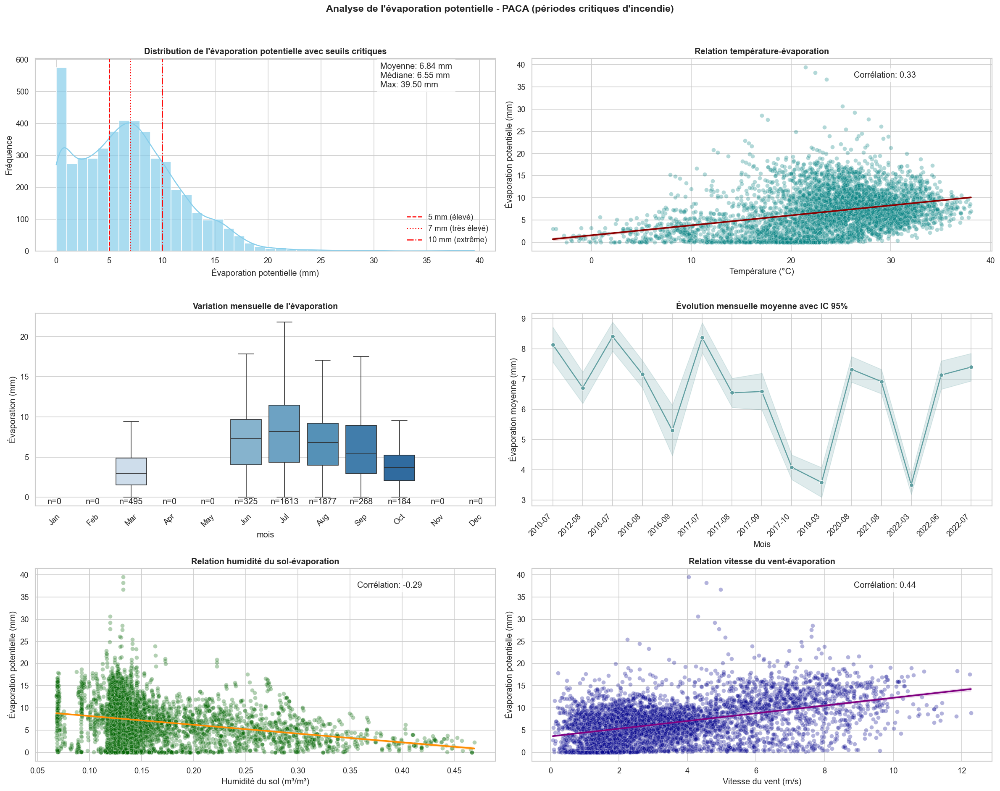

In [65]:
# --- Analyse de l'évaporation pour PACA ---
evap_figures_paca, evap_stats_paca = analyser_evaporation(df_paca, "PACA")

En région PACA, l’évaporation potentielle joue un rôle central dans le stress hydrique estival. Bien que ses valeurs moyennes soient légèrement inférieures à celles observées en Nouvelle-Aquitaine, son intensité, sa fréquence et ses moteurs spécifiques en font un facteur de risque tout aussi critique.

### **Niveaux d’Évaporation et Fréquences Critiques**
- **Moyenne** : 6,84 mm/jour

Une valeur élevée, révélatrice d’un potentiel d’assèchement intense de l’environnement végétal.

### Fréquences des seuils critiques :
- > 5 mm/jour : 62,8 % du temps
- > 7 mm/jour : 46,1 % du temps
- > 10 mm/jour : 23,4 % du temps

Ces taux témoignent d’un stress hydrique permanent, avec une pression évaporative constante qui accentue la vulnérabilité des écosystèmes aux incendies.

### **Facteurs Météorologiques Liés à l’Évaporation**
- **Température** (corrélation : r = 0.33) :
  L’évaporation suit logiquement la chaleur : plus les températures montent, plus l’intensité évaporative augmente — un lien attendu, légèrement plus marqué qu’en Nouvelle-Aquitaine.

- **Vent** (corrélation : r = 0.44) :
  Ici se situe la spécificité PACA : le vent (notamment le Mistral) agit comme un accélérateur d’évaporation, par effet mécanique de brassage de l’air sec. L’évaporation devient ainsi fortement amplifiée les jours venteux, aggravant le dessèchement rapide des combustibles.

- **Humidité du sol** (corrélation : r = -0.29) :
  Plus l’évaporation est forte, plus le sol est sec. Cette relation négative nette confirme que l’évaporation constitue un mécanisme actif d’assèchement du milieu, en interaction directe avec les risques d’incendie.

### **Évolutions Temporelles**
- **Saisonnalité mensuelle** : Les mois de juin, juillet et août concentrent les niveaux d’évaporation les plus élevés, en cohérence avec la saison sèche méditerranéenne.

- **Tendance interannuelle** : Chaque été est marqué par des pics nets d’évaporation. Les années 2017 et 2022 se distinguent particulièrement, avec des niveaux exceptionnellement soutenus, en lien avec des épisodes majeurs de sécheresse et d’incendies.

La volatilité du signal annuel reflète l’alternance de périodes de crise intense et de répit temporaire, soulignant la nécessité d’une vigilance continue.

#### 12.2. Analyse de l’Évaporation de la Nouvelle-Aquitaine


ANALYSE ÉVAPORATION POTENTIELLE - NOUVELLE-AQUITAINE

 STATISTIQUES DESCRIPTIVES GLOBALES
+-------------+------------------+
| Statistique | Évaporation (mm) |
+-------------+------------------+
|    count    |      4863.0      |
|    mean     |      10.13       |
|     std     |       7.99       |
|     min     |       0.0        |
|     1%      |       0.06       |
|     5%      |       0.49       |
|     25%     |       5.12       |
|     50%     |       8.25       |
|     75%     |      12.89       |
|     95%     |       26.3       |
|     99%     |      36.99       |
|     max     |      69.76       |
|  skewness   |       1.67       |
|  kurtosis   |       4.02       |
+-------------+------------------+

 FRÉQUENCE DES SEUILS CRITIQUES
+---------+------+--------+
|  Seuil  |  %   | Nombre |
+---------+------+--------+
| > 5 mm  | 76.1 | 3700.0 |
| > 7 mm  | 60.6 | 2946.0 |
| > 10 mm | 37.5 | 1824.0 |
+---------+------+--------+


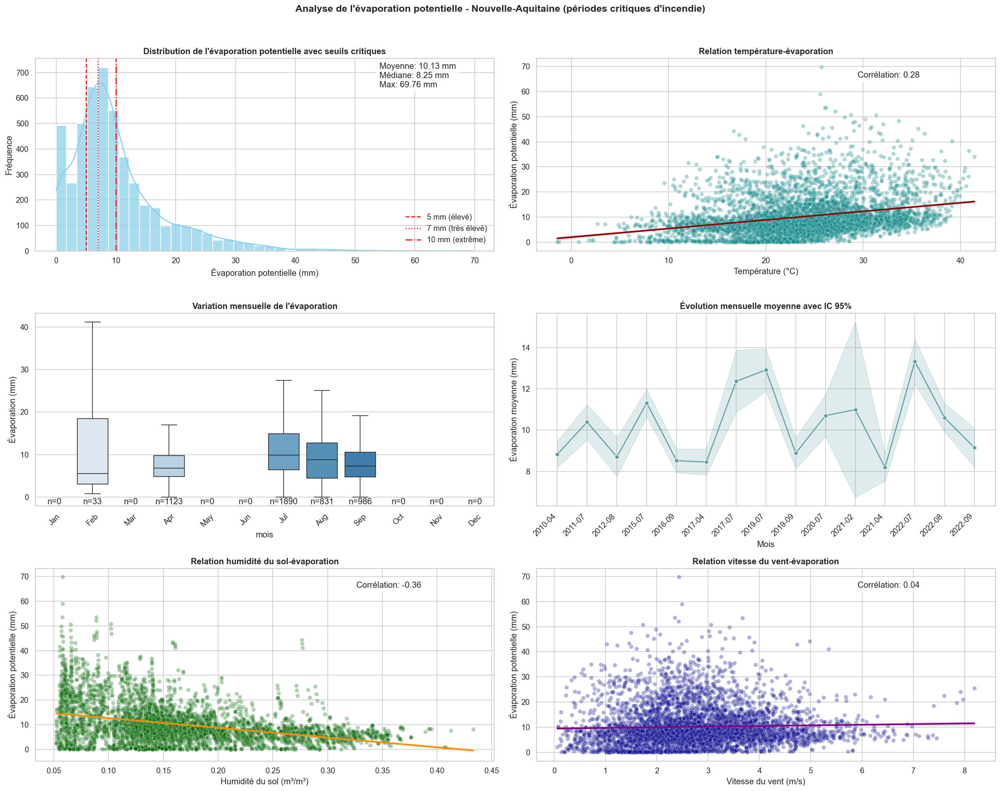

In [66]:
# --- Analyse de l'évaporation pour Nouvelle-Aquitaine ---
evap_figures_na, evap_stats_na = analyser_evaporation(df_na, "Nouvelle-Aquitaine")

En Nouvelle-Aquitaine, l'évaporation potentielle atteint des niveaux particulièrement élevés durant les périodes critiques, traduisant un stress hydrique intense pour les écosystèmes.

### **Intensité de l’Évaporation**
- La région enregistre une **moyenne** de 10.13 mm/jour, avec une distribution étendue vers des valeurs extrêmes, atteignant parfois **70 mm/jour**.
- Dans **76.1 %** des cas, l'évaporation dépasse **5 mm/jour**.
- Dans **37.5 %** des cas, elle excède **10 mm/jour**.

Ces niveaux témoignent d’une demande atmosphérique en eau quasi constante, favorisant l’assèchement rapide de la végétation.

### **Facteurs Contributifs**
- **Température** (corr. : 0.28) : Une relation positive modérée indique que la chaleur est un moteur principal de l’évaporation.
- **Vent** (corr. : 0.04) : Corrélation négligeable ; le vent joue un rôle mineur dans cette dynamique régionale.
- **Humidité du sol** (corr. : -0.36) : Corrélation négative marquée, confirmant que plus l'évaporation est forte, plus le sol s’assèche, accentuant le risque d’ignition.

### **Évolution Temporelle**
- **Mensuellement** : Les pics sont atteints en juillet et août, lorsque les températures sont élevées et les précipitations souvent déficitaires.
- **Annuellement** : Des épisodes intenses sont identifiés, notamment en juillet 2019, février 2021 (évaporation hivernale anormale), et été 2022. Ces périodes coïncident avec des phases de fort stress hydrique pour les forêts.

---

## 13. Analyse de l’Indice de Feuillage

Cette analyse évalue la densité de la couverture foliaire, en identifiant les périodes ou zones à faible biomasse, propices à une propagation accélérée du feu. Elle repose sur des statistiques descriptives, des seuils critiques, des variations saisonnières et des corrélations climatiques.

### Contenu de l’Analyse

-   **Statistiques globales** : moyenne, médiane, min, max, écart-type, percentiles (1%, 5%, 25%, 50%, 75%, 95%, 99%), skewness, kurtosis, coefficient de variation.

-   **Seuils critiques** :
    - < 1.0 (faible)
    - < 1.5 (modéré)
    - < 2.0 m²/m² (normal)
    - → % et nombre de jours sous chaque seuil.

-   **Statistiques mensuelles** : moyenne, médiane, min, max, écart-type, quantiles 10% / 90%, effectifs par année_mois.

-   **Corrélations** : température de l’air, humidité du sol, évaporation potentielle.

### Visualisations Générées (6)

1.  Distribution de l’indice (histogramme + KDE, seuils indiqués).
2.  Variation


n mensuelle : moyennes avec IC 95 %.
3.  Boxplots mensuels.
4.  Profil horaire moyen (IC 95%).
5.  Corrélation avec température (nuage de points + régression).
6.  Corrélation avec humidité du sol.

### Résultats Produits

-   **indice_feuillage_figures** : figure Matplotlib contenant les 6 graphiques.
-   **results_df** : DataFrame compilant les statistiques, fréquences de seuils, moyennes mensuelles et corrélations.

Cette analyse permet de repérer les périodes de faible indice de feuillage, souvent associées à des conditions de sécheresse et de chaleur, augmentant le risque de propagation rapide des incendies.


In [67]:
def analyser_feuillage(df: pd.DataFrame, region_name: str) -> Tuple[Dict[str, plt.Figure], Optional[pd.DataFrame]]:
    """Analyse approfondie de l'indice de feuillage pour les périodes critiques d'incendie
    
    Args:
        df: DataFrame contenant les données météo et végétation
        region_name: Nom de la région pour le titre des graphiques
        
    Returns:
        Tuple contenant:
            - Dictionnaire avec les figures matplotlib
            - DataFrame avec les statistiques calculées (ou None si donnée manquante)
    """
    print(f"\n{'='*50}\nANALYSE INDICE DE FEUILLAGE - {region_name.upper()}\n{'='*50}")
    
    # Vérification de la présence des données
    if 'indice_feuillage_m2m2' not in df.columns:
        print("Avertissement: Colonne 'indice_feuillage_m2m2' manquante - analyse impossible")
        return {}, None
    
    # 1. Statistiques descriptives avancées
    feuillage_stats = df['indice_feuillage_m2m2'].describe(percentiles=[.01, .05, .25, .5, .75, .95, .99]).round(3)
    feuillage_stats['skewness'] = df['indice_feuillage_m2m2'].skew().round(2)
    feuillage_stats['kurtosis'] = df['indice_feuillage_m2m2'].kurtosis().round(2)
    
    print("\n STATISTIQUES DESCRIPTIVES GLOBALES")
    print(tabulate(feuillage_stats.to_frame(), headers=['Statistique', 'Indice (m²/m²)'], 
                   tablefmt='pretty', floatfmt=".3f"))

    # 2. Analyse des seuils critiques pour les incendies
    seuils = {
        f'< {seuil} m²/m²': {
            '%': (df['indice_feuillage_m2m2'] < seuil).mean() * 100,
            'count': (df['indice_feuillage_m2m2'] < seuil).sum()
        }
        for seuil in [1.0, 1.5, 2.0]  # Seuils de faible couverture foliaire
    }
    seuils_df = pd.DataFrame.from_dict(seuils, orient='index').round(1)
    
    print("\n FRÉQUENCE DES SEUILS CRITIQUES")
    print(tabulate(seuils_df, headers=['Seuil', '%', 'Nombre'], 
                   tablefmt='pretty', floatfmt=".1f"))

    # 3. Statistiques mensuelles détaillées
    stats_mensuelles = df.groupby('annee_mois')['indice_feuillage_m2m2'].agg([
        ('moyenne', 'mean'),
        ('mediane', 'median'),
        ('minimum', 'min'),
        ('maximum', 'max'),
        ('ecart_type', 'std'),
        ('q10', lambda x: x.quantile(0.1)),
        ('q90', lambda x: x.quantile(0.9)),
        ('count', 'count')
    ]).round(3)
    
    # 4. Corrélations avec variables environnementales
    corr_temp = df['temperature_air_c'].corr(df['indice_feuillage_m2m2']).round(2)
    corr_humidite = df['humidite_sol_surface_m3m3'].corr(df['indice_feuillage_m2m2']).round(2)
    corr_evap = df['evaporation_potentielle_mm'].corr(df['indice_feuillage_m2m2']).round(2)

    # 5. Visualisation
    fig = plt.figure(figsize=(20, 16), dpi=120)
    fig.suptitle(f"Analyse de l'indice de feuillage - {region_name} (périodes critiques d'incendie)", 
                 fontweight='bold', fontsize=14)
    gs = GridSpec(3, 2, figure=fig)

    # --- Graphique 1: Distribution avec seuils critiques ---
    ax1 = fig.add_subplot(gs[0, 0])
    sns.histplot(df['indice_feuillage_m2m2'], bins=40, kde=True, 
                 ax=ax1, color='limegreen', alpha=0.7)
    
    # Seuils de faible couverture foliaire
    for seuil, style, label in [(1.0, '--', '1.0 (faible)'), 
                               (1.5, ':', '1.5 (modéré)'), 
                               (2.0, '-.', '2.0 (normal)')]:
        ax1.axvline(seuil, color='red', linestyle=style, label=label)
    
    ax1.legend()
    ax1.set_title('Distribution de l\'indice de feuillage avec seuils critiques')
    ax1.set_xlabel('Indice de feuillage (m²/m²)')
    ax1.set_ylabel('Fréquence')
    
    # Ajout des indicateurs statistiques
    stats_text = (f"Moyenne: {feuillage_stats['mean']:.2f}\n"
                 f"Médiane: {feuillage_stats['50%']:.2f}\n"
                 f"Max: {feuillage_stats['max']:.2f}")
    ax1.text(0.75, 0.85, stats_text, transform=ax1.transAxes, 
             bbox=dict(facecolor='white', alpha=0.8))

    # --- Graphique 2: Variation saisonnière ---
    ax2 = fig.add_subplot(gs[0, 1])
    df['mois'] = pd.Categorical(df['mois'], categories=range(1, 13), ordered=True)
    monthly = df.groupby('mois')['indice_feuillage_m2m2'].agg(['mean', 'std', 'count']).reset_index()
    monthly['ci'] = 1.96 * monthly['std'] / np.sqrt(monthly['count'])
    
    sns.barplot(x='mois', y='mean', data=monthly, palette='Greens', ax=ax2)
    ax2.errorbar(x=np.arange(12), y=monthly['mean'], 
                yerr=monthly['ci'], fmt='none', c='black', capsize=5)
    
    ax2.set_xticks(range(12))
    ax2.set_xticklabels(calendar.month_abbr[1:13], rotation=45)
    ax2.set_title('Variation saisonnière avec IC 95%')
    ax2.set_ylabel('Indice moyen (m²/m²)')
    
    # Ajout des effectifs
    for i, count in enumerate(monthly['count']):
        ax2.text(i, ax2.get_ylim()[0], f"n={count}", ha='center', va='bottom')

    # --- Graphique 3: Relation température/feuillage ---
    ax3 = fig.add_subplot(gs[1, 0])
    sns.scatterplot(x='temperature_air_c', y='indice_feuillage_m2m2', 
                    data=df, alpha=0.3, color='forestgreen', ax=ax3)
    
    # Régression non linéaire
    sns.regplot(x='temperature_air_c', y='indice_feuillage_m2m2', 
                data=df, scatter=False, lowess=True, color='red', ax=ax3)
    
    ax3.annotate(f'Corrélation: {corr_temp}', xy=(0.7, 0.9), xycoords='axes fraction',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax3.set_title('Relation température-indice de feuillage')
    ax3.set_xlabel('Température (°C)')
    ax3.set_ylabel('Indice de feuillage (m²/m²)')

    # --- Graphique 4: Évolution temporelle ---
    ax4 = fig.add_subplot(gs[1, 1])
    temp_mensuelle = df.groupby('annee_mois').agg(
        mean=('indice_feuillage_m2m2', 'mean'),
        std=('indice_feuillage_m2m2', 'std'),
        count=('indice_feuillage_m2m2', 'count')
    ).reset_index()
    temp_mensuelle['annee_mois_str'] = temp_mensuelle['annee_mois'].astype(str)
    temp_mensuelle['ci'] = 1.96 * temp_mensuelle['std'] / np.sqrt(temp_mensuelle['count'])
    
    sns.lineplot(x='annee_mois_str', y='mean', data=temp_mensuelle, 
                 marker='o', color='darkgreen', ax=ax4)
    ax4.fill_between(temp_mensuelle['annee_mois_str'],
                    temp_mensuelle['mean'] - temp_mensuelle['ci'],
                    temp_mensuelle['mean'] + temp_mensuelle['ci'],
                    color='darkgreen', alpha=0.2)
    
    ax4.set_title('Évolution temporelle avec IC 95%')
    ax4.set_xlabel('Mois')
    ax4.set_ylabel('Indice moyen (m²/m²)')
    plt.setp(ax4.get_xticklabels(), rotation=45, ha='right')

    # --- Graphique 5: Relation humidité/feuillage ---
    ax5 = fig.add_subplot(gs[2, 0])
    sns.scatterplot(x='humidite_sol_surface_m3m3', y='indice_feuillage_m2m2', 
                    data=df, alpha=0.3, color='darkolivegreen', ax=ax5)
    
    # Régression linéaire
    sns.regplot(x='humidite_sol_surface_m3m3', y='indice_feuillage_m2m2', 
                data=df, scatter=False, color='blue', ax=ax5)
    
    ax5.annotate(f'Corrélation: {corr_humidite}', xy=(0.7, 0.9), xycoords='axes fraction',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax5.set_title('Relation humidité du sol-indice de feuillage')
    ax5.set_xlabel('Humidité du sol (m³/m³)')
    ax5.set_ylabel('Indice de feuillage (m²/m²)')

    # --- Graphique 6: Relation évaporation/feuillage ---
    ax6 = fig.add_subplot(gs[2, 1])
    sns.scatterplot(x='evaporation_potentielle_mm', y='indice_feuillage_m2m2', 
                    data=df, alpha=0.3, color='seagreen', ax=ax6)
    
    # Régression linéaire
    sns.regplot(x='evaporation_potentielle_mm', y='indice_feuillage_m2m2', 
                data=df, scatter=False, color='darkred', ax=ax6)
    
    ax6.annotate(f'Corrélation: {corr_evap}', xy=(0.7, 0.9), xycoords='axes fraction',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    ax6.set_title('Relation évaporation-indice de feuillage')
    ax6.set_xlabel('Évaporation potentielle (mm)')
    ax6.set_ylabel('Indice de feuillage (m²/m²)')

    plt.tight_layout(rect=[0, 0, 1, 0.96])

    # Sauvegarde
    region_key = 'paca' if 'paca' in region_name.lower() else 'na'
    save_and_show_figure(fig, region_key, 'feuillage_analysis')

    # 6. Résultats combinés
    results_df = pd.concat([
        feuillage_stats.rename('valeur').to_frame().reset_index().rename(columns={'index': 'statistique'}),
        seuils_df.reset_index().rename(columns={'index': 'statistique'}).melt(id_vars='statistique'),
        stats_mensuelles.reset_index().melt(id_vars='annee_mois', var_name='statistique'),
        pd.DataFrame({
            'statistique': ['correlation_temp', 'correlation_humidite', 'correlation_evap'],
            'variable': ['coeff', 'coeff', 'coeff'],
            'valeur': [corr_temp, corr_humidite, corr_evap]
        })
    ])

    return {'feuillage_figures': fig}, results_df

L'indice de feuillage (ou LAI - Leaf Area Index) est un indicateur de la densité de la végétation. Il mesure la surface totale des feuilles par unité de surface au sol (en m²/m²). Pour le risque d'incendie, il est crucial : un indice élevé signifie plus de combustible disponible pour brûler. Cependant, un indice très bas peut indiquer une végétation stressée, sèche et donc très inflammable.

#### 13.1. Analyse de l’Indice de Feuillage de la Provence-Alpes-Côte d’Azur


ANALYSE INDICE DE FEUILLAGE - PACA

 STATISTIQUES DESCRIPTIVES GLOBALES
+-------------+----------------+
| Statistique | Indice (m²/m²) |
+-------------+----------------+
|    count    |     4762.0     |
|    mean     |     2.139      |
|     std     |     0.687      |
|     min     |     0.544      |
|     1%      |      0.59      |
|     5%      |     0.633      |
|     25%     |     1.819      |
|     50%     |     2.275      |
|     75%     |     2.468      |
|     95%     |     2.982      |
|     99%     |     4.268      |
|     max     |     4.893      |
|  skewness   |      0.05      |
|  kurtosis   |      1.74      |
+-------------+----------------+

 FRÉQUENCE DES SEUILS CRITIQUES
+-------------+------+--------+
|    Seuil    |  %   | Nombre |
+-------------+------+--------+
| < 1.0 m²/m² | 7.9  | 378.0  |
| < 1.5 m²/m² | 15.0 | 716.0  |
| < 2.0 m²/m² | 31.4 | 1496.0 |
+-------------+------+--------+


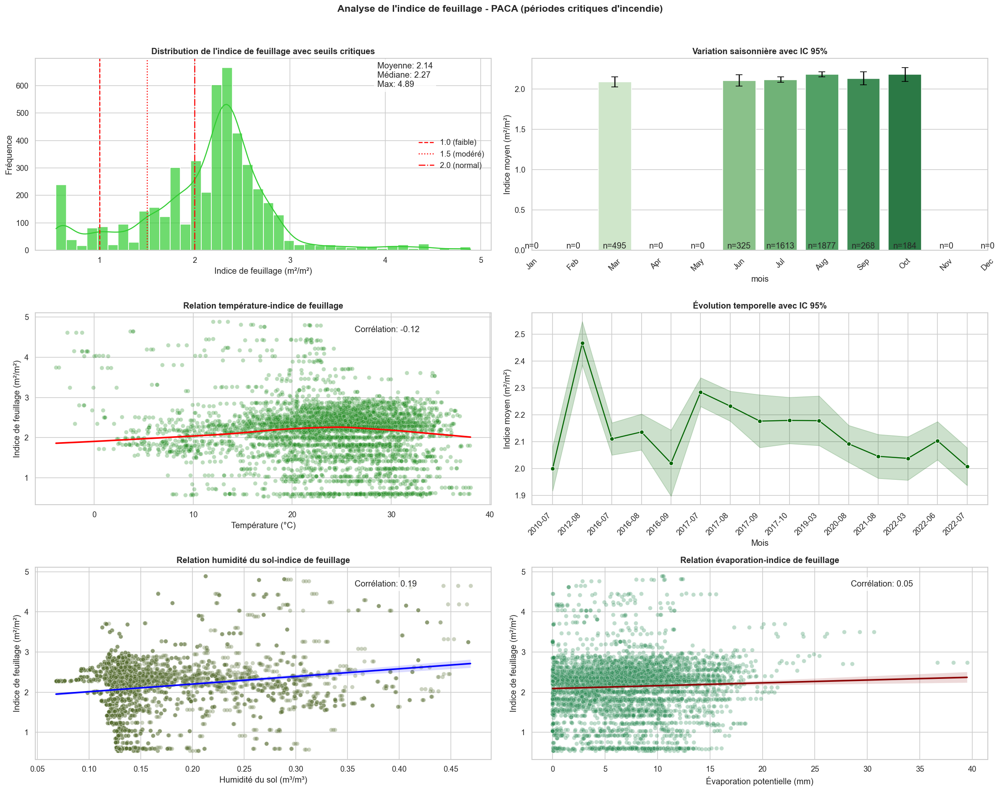

In [68]:
# --- Analyse de l'indice de feuillage pour PACA ---
feuillage_figures_paca, feuillage_stats_paca = analyser_feuillage(df_paca, "PACA") 

En région PACA, la végétation est naturellement plus clairsemée et adaptée aux conditions arides. Toutefois, les données révèlent des signes marqués de stress hydrique, accentués en période estivale.

### **Densité du Couvert Végétal**
- L’indice de feuillage moyen est de **2.14 m²/m²**, nettement inférieur à celui observé en Nouvelle-Aquitaine. 
- La distribution est orientée vers les valeurs faibles, traduisant une végétation peu dense.
- **8 %** du temps, l’indice est inférieur à **1.0**, reflétant une couverture très faible.
- **31.4 %** du temps, il est inférieur à **2.0**, seuil en dessous duquel la végétation montre un stress important.

Cette faible densité végétale, combinée à une perte de feuillage en été, signale une végétation fragile, desséchée et hautement inflammable.

### **Facteurs Associés**
- **Humidité du sol** (corr. : 0.19) : Légère corrélation positive. Une meilleure humidité permet de soutenir partiellement la densité végétale, bien que la réponse reste limitée.
- **Évaporation potentielle** (corr. : 0.05) : Corrélation quasi nulle. La végétation méditerranéenne (maquis, garrigue) est adaptée à l’évaporation et ne réagit pas de manière linéaire à son intensité.

### **Variations Temporelles**
- **Saisonnières** : Le pic de feuillage est atteint en mai-juin, puis diminue dès juillet-août, en pleine sécheresse estivale. Cette baisse précoce est un indicateur direct du stress subi par la végétation.
- **Annuellement** : La variabilité est forte. Le pic observé en juillet 2010 contraste avec des années plus récentes où les indices sont nettement plus bas. Une tendance à la baisse durant l’été se dessine sur la période 2020–2022, avec une chute marquée en été 2022, symptôme d’un stress hydrique chronique croissant.

### 13.2. Analyse de l’Indice de Feuillage de la Nouvelle-Aquitaine


ANALYSE INDICE DE FEUILLAGE - NOUVELLE-AQUITAINE

 STATISTIQUES DESCRIPTIVES GLOBALES
+-------------+----------------+
| Statistique | Indice (m²/m²) |
+-------------+----------------+
|    count    |     4863.0     |
|    mean     |      2.8       |
|     std     |      0.65      |
|     min     |     1.532      |
|     1%      |     1.829      |
|     5%      |     1.993      |
|     25%     |     2.239      |
|     50%     |     2.643      |
|     75%     |     3.367      |
|     95%     |     3.937      |
|     99%     |     4.211      |
|     max     |     4.667      |
|  skewness   |      0.49      |
|  kurtosis   |     -0.89      |
+-------------+----------------+

 FRÉQUENCE DES SEUILS CRITIQUES
+-------------+-----+--------+
|    Seuil    |  %  | Nombre |
+-------------+-----+--------+
| < 1.0 m²/m² | 0.0 |  0.0   |
| < 1.5 m²/m² | 0.0 |  0.0   |
| < 2.0 m²/m² | 5.2 | 254.0  |
+-------------+-----+--------+


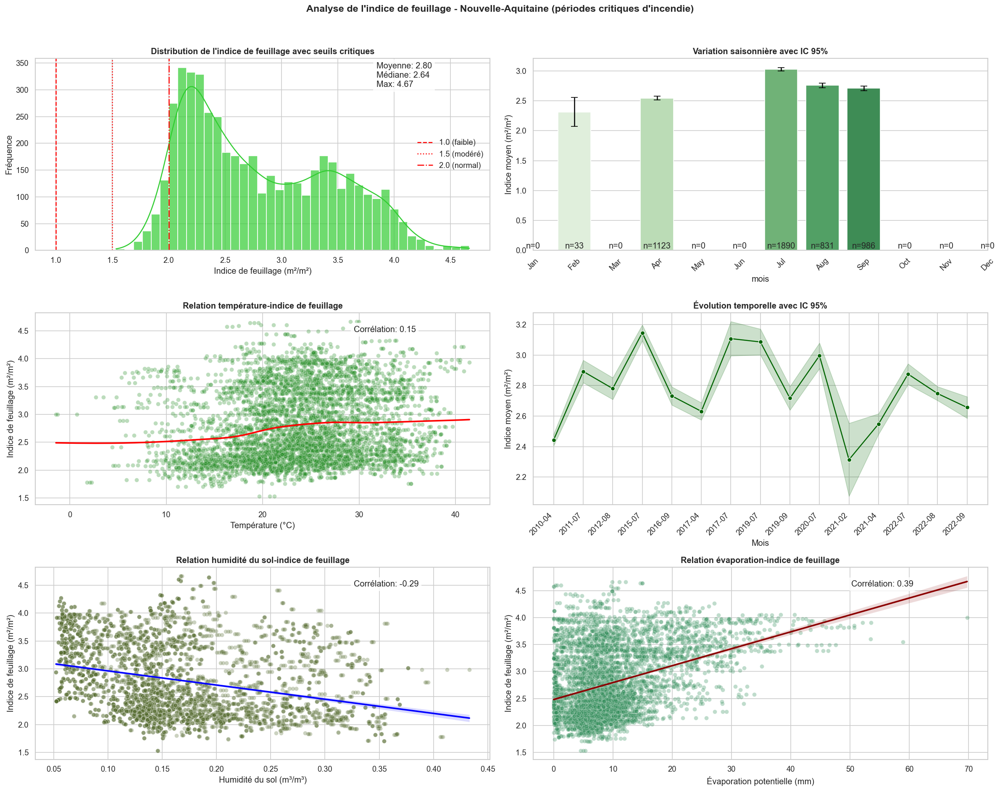

In [69]:
# --- Analyse de l'indice de feuillage pour Nouvelle-Aquitaine ---
feuillage_figures_na, feuillage_stats_na = analyser_feuillage(df_na, "Nouvelle-Aquitaine")

La Nouvelle-Aquitaine se distingue par une végétation dense et un indice de feuillage (LAI) élevé, y compris pendant les périodes critiques. Cette abondance végétale représente une charge en combustible importante, susceptible d’alimenter des feux intenses en cas de conditions météorologiques défavorables.

### **Densité du Couvert Végétal**
### Statistiques générales :
- L’indice de feuillage moyen est très élevé, atteignant **2.8 m²/m²**. 
- La valeur minimale enregistrée est de **1.53**, ce qui correspond déjà à une couverture modérée.

### Fréquence des seuils critiques :
- Les valeurs inférieures à **1.5 m²/m²** ne sont jamais atteintes dans les données.
- Seuls **5.2 %** des cas présentent un indice inférieur à **2.0**, seuil souvent considéré comme “normal”.

### Implication :
En Nouvelle-Aquitaine, le risque ne provient pas d’un manque de végétation, mais au contraire de sa grande abondance. En période de sécheresse, cette biomasse dense devient un combustible redoutable, favorisant des incendies à propagation rapide et difficile à contenir.

### **Dynamique du Feuillage**
### Relation avec l’humidité du sol (corrélation : -0.20)
- La corrélation est négative, ce qui peut sembler contre-intuitif. Ce phénomène s'explique par un décalage temporel :
  - Le feuillage atteint son pic en début d’été, alors que le sol reste encore relativement humide.
  - Ensuite, le sol s’assèche, mais la végétation conserve une forte densité, augmentant la flammabilité globale.

### Relation avec l’évaporation potentielle (corrélation : 0.39)
- La corrélation est positive et modérée :
  - Les périodes de forte évaporation (journées chaudes et ensoleillées) coïncident avec une végétation dense.
  - Cette conjonction est critique, car une grande quantité de biomasse soumise à un assèchement intense constitue un facteur majeur de risque incendie.

### **Variations Temporelles**
### Variation saisonnière :
- Le cycle du feuillage montre une dynamique très claire :
  - L’indice de feuillage atteint son maximum entre juin et août, période de plus haute vulnérabilité aux incendies.

### Évolution interannuelle :
- Chaque été présente un pic de végétation marqué.
- **2021** se démarque par un indice exceptionnellement élevé.
- À l’inverse, l’été **2022** montre une chute nette du feuillage, probablement causée par la sécheresse extrême. Cela a pu forcer la végétation à perdre prématurément ses feuilles, augmentant la quantité de matière sèche hautement inflammable.

---

### 14. Analyse Temporelle 

Cette analyse explore l’évolution mensuelle des variables météorologiques pendant les périodes critiques d’incendie, afin de repérer les tendances saisonnières favorables aux départs ou à la propagation des feux.

#### **a. Objectif** : 
Visualiser les moyennes mensuelles (par année) et la médiane globale de quatre variables climatiques clés.

#### **b. Paramètres** :
- **df** : DataFrame contenant les données météorologiques horodatées.
- **region_name** : Nom de la région analysée (affiché dans les titres).

#### **c. Variables Étudiées** :

| Variable                             | Unité    | Description                             | Palette   |
|--------------------------------------|----------|-----------------------------------------|-----------|
| temperature_air_c                    | °C       | Température de l’air                   | YlOrRd    |
| vent_vitesse                         | m/s      | Vitesse moyenne du vent                | Blues     |
| humidite_sol_surface_m3m3           | m³/m³    | Humidité du sol (surface)              | YlGn      |
| precipitations_mm                    | mm       | Cumul de précipitations                 | Blues     |

#### **d. Sortie** :
Un graphique 2x2 avec pour chaque variable :
- La moyenne mensuelle par année.
- La médiane générale (ligne pointillée noire).
- Mois sur l’axe X (Jan → Dec), valeurs sur l’axe Y.
- Légende indiquant les années.

#### **Sauvegarde Automatique** :
Le graphique est enregistré sous `tendances_temporelles.png` dans le dossier correspondant à la région (`paca/` ou `na/`).


In [70]:
def analyser_temporel(df: pd.DataFrame, region_name: str) -> Dict[str, plt.Figure]:
    """Analyse des tendances temporelles pour les périodes critiques
    
    Args:
        df: DataFrame contenant les données météo
        region_name: Nom de la région pour les titres
        
    Returns:
        Dictionnaire contenant les figures générées
    """
    print(f"\n{'='*50}\nANALYSE TEMPORELLE - {region_name.upper()}\n{'='*50}")
    
    # Vérification des colonnes nécessaires
    if 'annee_mois' not in df.columns:
        df['annee_mois'] = df['date_heure'].dt.to_period('M')
    
    # Variables clés pour l'analyse des incendies
    variables = {
        'temperature_air_c': {'label': 'Température (°C)', 'palette': 'YlOrRd'},
        'vent_vitesse': {'label': 'Vitesse vent (m/s)', 'palette': 'Blues'},
        'humidite_sol_surface_m3m3': {'label': 'Humidité sol (m³/m³)', 'palette': 'YlGn'},
        'precipitations_mm': {'label': 'Précipitations (mm)', 'palette': 'Blues'}
    }
    
    # Création du dataframe temporel
    df_temporel = df.groupby(['annee_mois', 'mois'])[list(variables.keys())].agg(['mean', 'median']).reset_index()
    df_temporel.columns = ['annee_mois', 'mois'] + [f'{var}_{stat}' for var in variables for stat in ['mean', 'median']]
    
    # Création des figures
    fig, axes = plt.subplots(2, 2, figsize=(18, 12))
    axes = axes.flatten()
    fig.suptitle(f"Tendances temporelles - {region_name} (périodes critiques)", fontweight='bold')
    
    for i, (var, params) in enumerate(variables.items()):
        # Plot des tendances
        sns.lineplot(x='mois', y=f'{var}_mean', hue='annee_mois', 
                    data=df_temporel, palette=params['palette'],
                    marker='o', linewidth=1.5, ax=axes[i])
        
        # Mise en forme
        axes[i].set_title(f'Évolution de {params["label"]}')
        axes[i].set_xticks(range(1, 13))
        axes[i].set_xticklabels(calendar.month_abbr[1:13], rotation=45)
        axes[i].set_xlabel('')
        axes[i].set_ylabel(params['label'])
        axes[i].legend(title='Année-Mois', bbox_to_anchor=(1.05, 1), loc='upper left')
        
        # Ajout de la médiane
        sns.lineplot(x='mois', y=f'{var}_median', data=df_temporel,
                    color='black', linestyle='--', label='Médiane', ax=axes[i])
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    
    # Sauvegarde
    region_key = 'paca' if 'paca' in region_name.lower() else 'na'
    save_and_show_figure(fig, region_key, 'tendances_temporelles')
    
    return {'temporal_figures': fig}

### 14. Analyse Temporelle de la Nouvelle-Aquaitaine


ANALYSE TEMPORELLE - NOUVELLE-AQUAITAINE


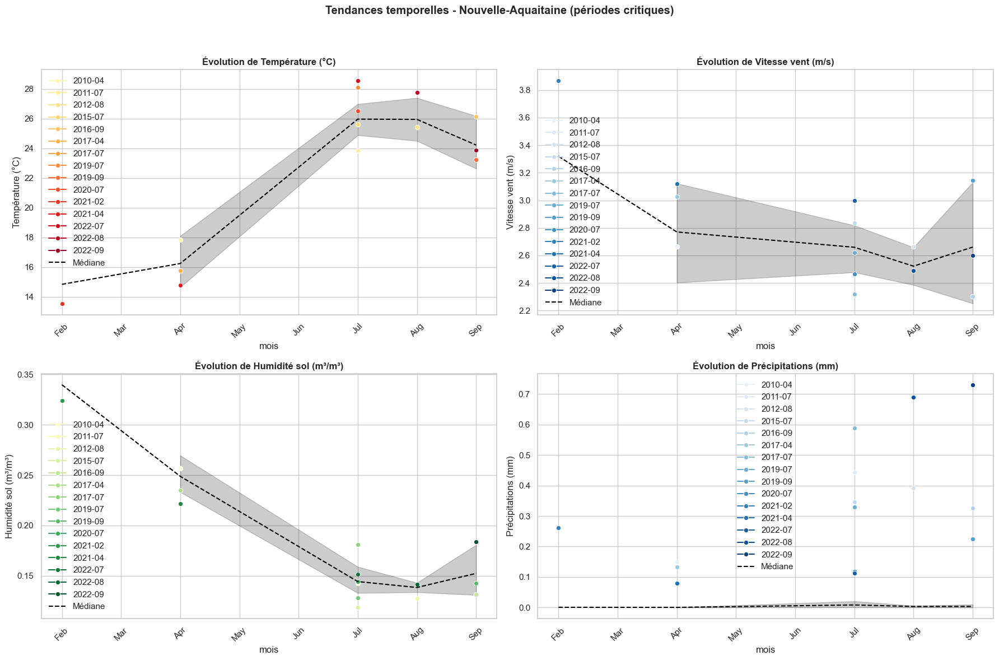

{'temporal_figures': <Figure size 1800x1200 with 4 Axes>}

In [71]:
analyser_temporel(df_na, "Nouvelle-Aquaitaine")

L’analyse temporelle des données météorologiques en Nouvelle-Aquitaine met en lumière un pic de risque estival marqué, où plusieurs facteurs critiques convergent durant l’été. Voici les principaux enseignements :

### **Température de l’air – Une chaleur extrême persistante**
- **Tendance saisonnière** : La courbe suit une forme en cloche, caractéristique des climats tempérés, avec un maximum net en **juillet**, suivi de valeurs encore élevées en **août**.

- **Années exceptionnelles** : Les pics observés en juillet et août **2022** dépassent nettement la médiane, soulignant un été anormalement chaud.

- **Impacts sur le risque d’incendie** : Cette chaleur soutenue favorise l’assèchement rapide de la végétation, accélère l’évaporation et accroît l’inflammabilité des combustibles naturels.Le cœur de l’été correspond ainsi à la période de vulnérabilité maximale.

### **Vitesse du vent – Un facteur discret mais constant**
- **Tendance saisonnière** : Le vent reste relativement stable pendant les mois à risque, avec un léger affaiblissement en **août**.

- **Cas particuliers** : Des mois comme **septembre 2018** affichent une intensité un peu plus élevée, mais globalement la variabilité reste faible.

- **Rôle dans les incendies** : Si le vent n’est pas l’élément déclencheur principal, sa présence régulière, même modérée, peut accélérer la propagation des feux une fois allumés.

### **Humidité du sol – Le signal le plus alarmant**
- **Tendance saisonnière** : On observe une chute rapide et continue de l’humidité du sol à partir du printemps, avec un minimum critique atteint en **août**.

- **Années critiques** : L’été **2022** ressort clairement, avec des niveaux anormalement bas en juillet et août, reflétant une sécheresse extrême.

- **Impacts sur le risque** : Cette baisse progressive indique un épuisement des réserves hydriques du sol, rendant la végétation hautement inflammable. 
Le creux hydrique en août coïncide ainsi avec le risque maximal d’incendie.

### **Précipitations – Un été quasiment sec**
- **Tendance saisonnière** : Les précipitations sont quasi nulles durant les mois critiques, ce qui confirme l’installation d’une saison sèche prononcée.

- **Épisodes marquants** : Seuls quelques mois (comme **septembre 2022**) montrent un retour partiel des pluies. 
D'autres, comme **juillet 2022**, affichent une absence totale de précipitations.

- **Conséquences** : L'absence de pluie empêche tout répit hydrique, aggravant la sécheresse et renforçant la vulnérabilité de la végétation semaine après semaine.

### **Conclusion**
L’été en Nouvelle-Aquitaine est marqué par une conjonction défavorable de conditions météorologiques : chaleur intense, sols secs, vent continu et absence de précipitations. L’année **2022**, en particulier, illustre un scénario climatique extrême, propice à des incendies majeurs.

#### 14. Analyse Temporelle de la Provence-Alpes-Côte d’Azur


ANALYSE TEMPORELLE - PACA


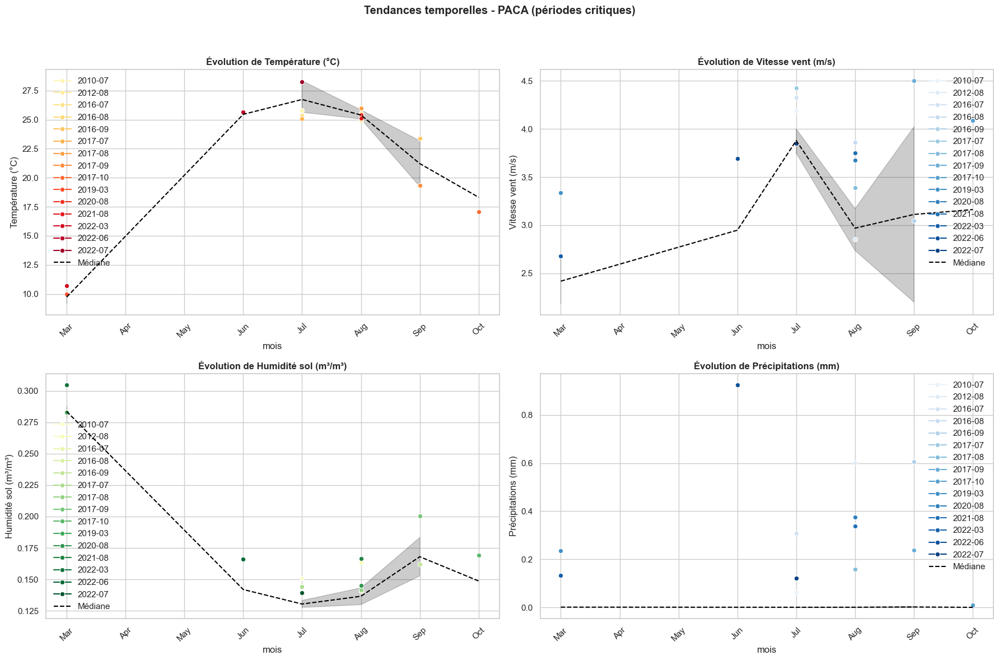

{'temporal_figures': <Figure size 1800x1200 with 4 Axes>}

In [72]:
analyser_temporel(df_paca, "PACA")

L'analyse pour la région PACA montre une saison des feux potentiellement plus longue et une convergence de facteurs de risque encore plus marquée, notamment à cause du vent.

### **Évolution de la Température**
- **Tendance saisonnière** : La courbe de température est similaire à celle de la Nouvelle-Aquitaine, avec un pic de chaleur en juillet et août.
- **Années critiques** : Les étés 2017 et 2022 se démarquent clairement avec des températures bien au-dessus de la normale, soulignant des périodes de canicule intense.
- **Implication pour le risque** : La chaleur estivale intense est un facteur de risque fondamental, comme en Nouvelle-Aquitaine.

### **Évolution de la Vitesse du Vent**
- **Tendance saisonnière** : La dynamique est très différente. La vitesse médiane du vent est élevée et atteint un pic très net en juillet.
- **Années critiques** : La dispersion des points est énorme, surtout en juillet. Cela montre que le vent est un facteur extrêmement variable et puissant. Des mois comme juillet 2012 ont connu des vents exceptionnellement forts.
- **Implication pour le risque** : C'est une différence capitale. En PACA, le pic de chaleur (juillet-août) coïncide avec le pic de vent (juillet). Cette superposition crée des conditions de propagation de feu explosives. Le vent fort (Mistral) en plein cœur de l'été est le principal facteur aggravant du risque dans la région.

### **Évolution de l'Humidité du Sol**
- **Tendance saisonnière** : La chute de l'humidité est encore plus brutale. Partant d'un niveau déjà bas au printemps, elle s'effondre pour atteindre son minimum en août.
- **Années critiques** : L'été 2017 et l'été 2022 affichent des niveaux d'humidité du sol dramatiquement bas, bien en dessous de la médiane.
- **Implication pour le risque** : La sécheresse des sols est plus profonde et s'installe plus rapidement qu'en Nouvelle-Aquitaine. Le manque d'eau dans le sol est une condition de base quasi permanente durant l'été.

### **Évolution des Précipitations**
- **Tendance saisonnière** : La médiane des précipitations est rigoureusement nulle de juin à septembre. La saison sèche est longue et sans répit.
- **Années critiques** : Les rares pluies sont visibles, comme en juin 2022. Cependant, la plupart des mois critiques (juillet, août, septembre) ne reçoivent aucune précipitation significative.
- **Implication pour le risque** : L'absence prolongée de pluie sur une période de 3 à 4 mois garantit un assèchement extrême de la végétation, la rendant très réceptive à la moindre étincelle, surtout lorsqu'elle est attisée par le vent fort de juillet.

### conclusion 
L’été en région PACA se caractérise par une combinaison particulièrement critique de facteurs climatiques : températures caniculaires, vents forts (notamment le Mistral), sécheresse marquée des sols et absence quasi totale de précipitations. Cette convergence atteint son apogée lors des étés les plus extrêmes, comme celui de 2022, où ces conditions se sont cumulées pour créer un environnement extrêmement favorable à la propagation rapide et incontrôlable des incendies. Par rapport à d’autres régions, PACA présente ainsi un profil de risque estival plus intense et plus prolongé.

---

#### 15. Comparaison Interrégionale – PACA vs Nouvelle-Aquitaine

La fonction `comparer_regions` permet de comparer visuellement les conditions météorologiques critiques entre les deux grandes régions exposées aux incendies : PACA et Nouvelle-Aquitaine.

#### But :
Comparer les distributions et tendances mensuelles des variables clés entre les deux régions, pendant les périodes critiques d’incendie.

#### Paramètres :
- **df_paca** : Données météo de la région Provence-Alpes-Côte d’Azur (PACA).
- **df_na** : Données météo de la région Nouvelle-Aquitaine (NA).

#### Analyse 1 – Distributions Comparées (boxplots_comparatifs)

**Boxplots côte à côte** pour chaque variable météorologique :
- **Température de l’air (°C)**
- **Vitesse du vent (m/s)**
- **Humidité du sol (m³/m³)**
- **Précipitations (mm, échelle logarithmique)**

#### Spécificités :
- Boîtes plus compactes (width=0.6) pour une meilleure lisibilité.
- Indication du nombre de points (n=...) par région.
- Suppression des outliers pour des comparaisons robustes.

####  Analyse 2 – Évolution Mensuelle par Région (evolution_mensuelle_comparaison)

**Graphiques linéaires** de la médiane mensuelle pour chaque variable, par région :
- Chaque ligne représente la tendance mensuelle pour PACA vs NA.
- Bande d’intervalle de confiance à 95 % autour de la médiane.
- Mois affichés de Jan à Déc (en abréviation).

#### Variables Analysées :

| Variable                             | Unité    | Échelle Y      | Description                             |
|--------------------------------------|----------|----------------|-----------------------------------------|
| temperature_air_c                    | °C       | linéaire       | Température de l’air                   |
| vent_vitesse                         | m/s      | linéaire       | Vitesse moyenne du vent                |
| humidite_sol_surface_m3m3           | m³/m³    | linéaire       | Humidité du sol                        |
| precipitations_mm                    | mm       | logarithmique   | Cumul des précipitations                 |

#### Sauvegardes Automatiques :
- `boxplots_comparatifs.png` dans le dossier `/comparison`.
- `evolution_mensuelle_comparaison.png` dans le dossier `/comparison`.


In [73]:
def comparer_regions(df_paca: pd.DataFrame, df_na: pd.DataFrame) -> Dict[str, plt.Figure]:
    """Comparaison approfondie PACA vs Nouvelle-Aquitaine pour les périodes critiques"""
    print(f"\n{'='*50}\nCOMPARAISON INTERRÉGIONALE\n{'='*50}")
    
    # Préparation des données
    df_paca['Region'] = 'PACA'
    df_na['Region'] = 'Nouvelle-Aquitaine'
    df_comp = pd.concat([df_paca, df_na])
    
    variables = {
        'temperature_air_c': {'label': 'Température (°C)', 'yscale': 'linear'},
        'vent_vitesse': {'label': 'Vitesse vent (m/s)', 'yscale': 'linear'},
        'humidite_sol_surface_m3m3': {'label': 'Humidité sol (m³/m³)', 'yscale': 'linear'},
        'precipitations_mm': {'label': 'Précipitations (mm)', 'yscale': 'log'}
    }
    
    figures = {}
    
    # 1. Boxplots comparatifs - Version compacte
    fig1, axes = plt.subplots(2, 2, figsize=(16, 8))  # Format plus large que haut
    axes = axes.flatten()
    
    for i, (var, params) in enumerate(variables.items()):
        # Boxplot plus compact
        sns.boxplot(x='Region', y=var, data=df_comp, 
                   palette='Set2', width=0.6,  # Largeur réduite
                   showfliers=False, ax=axes[i])
        
        # Annotation plus compacte
        counts = df_comp.groupby('Region')[var].count()
        for j, region in enumerate(counts.index):
            axes[i].text(j, axes[i].get_ylim()[0] + 0.05*(axes[i].get_ylim()[1]-axes[i].get_ylim()[0]), 
                        f'n={counts[region]}', 
                        ha='center', va='bottom', fontsize=9)
        
        axes[i].set_title(f'{params["label"]}', pad=8, fontsize=11)
        axes[i].set_yscale(params['yscale'])
        axes[i].grid(True, axis='y', alpha=0.3)
        axes[i].set_ylabel('')  # Suppression du label y répétitif
    
    fig1.suptitle("Comparaison des distributions - Périodes critiques", y=0.98, fontsize=12)
    plt.tight_layout(pad=1.5, h_pad=1.5, w_pad=1.5)  # Espacement réduit
    save_and_show_figure(fig1, 'comparison', 'boxplots_comparatifs')
    figures['comparison_boxplots'] = fig1
    
    # 2. Évolution temporelle comparative
    if 'mois' in df_comp.columns:
        fig2, axes = plt.subplots(2, 2, figsize=(18, 10))  # Taille cohérente avec fig1
        axes = axes.flatten()
        
        for i, (var, params) in enumerate(variables.items()):
            sns.lineplot(x='mois', y=var, hue='Region', 
                        data=df_comp, estimator='median',
                        palette='Set1', marker='o', 
                        errorbar=('ci', 95), ax=axes[i])
            
            axes[i].set_title(f'Évolution de {params["label"]}', pad=10)
            axes[i].set_xticks(range(1, 13))
            axes[i].set_xticklabels(calendar.month_abbr[1:13], rotation=45)
            axes[i].set_yscale(params['yscale'])
            axes[i].legend(title='Région')
            axes[i].grid(True, alpha=0.3)
        
        fig2.suptitle("Évolution mensuelle comparative - Périodes critiques", fontweight='bold', y=0.98)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        save_and_show_figure(fig2, 'comparison', 'evolution_mensuelle_comparaison')
        figures['comparison_temporal'] = fig2
    
    return figures


COMPARAISON INTERRÉGIONALE


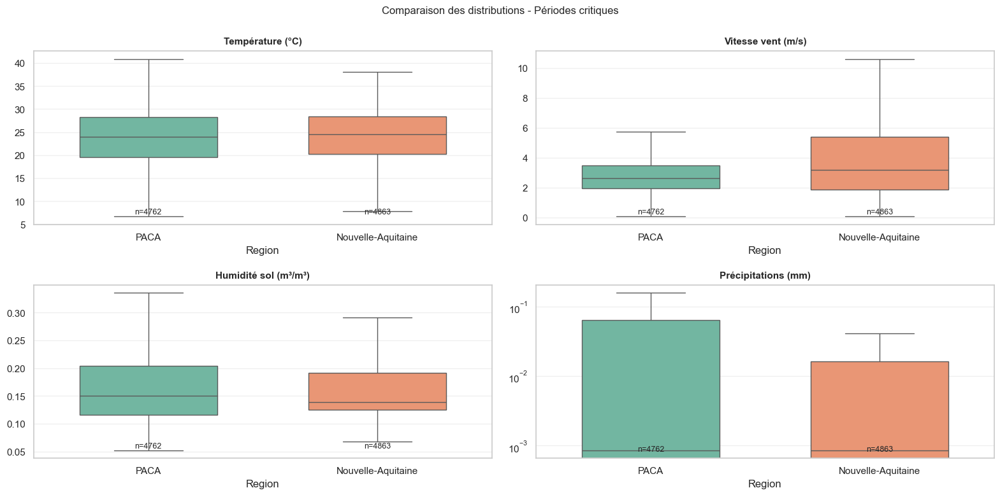

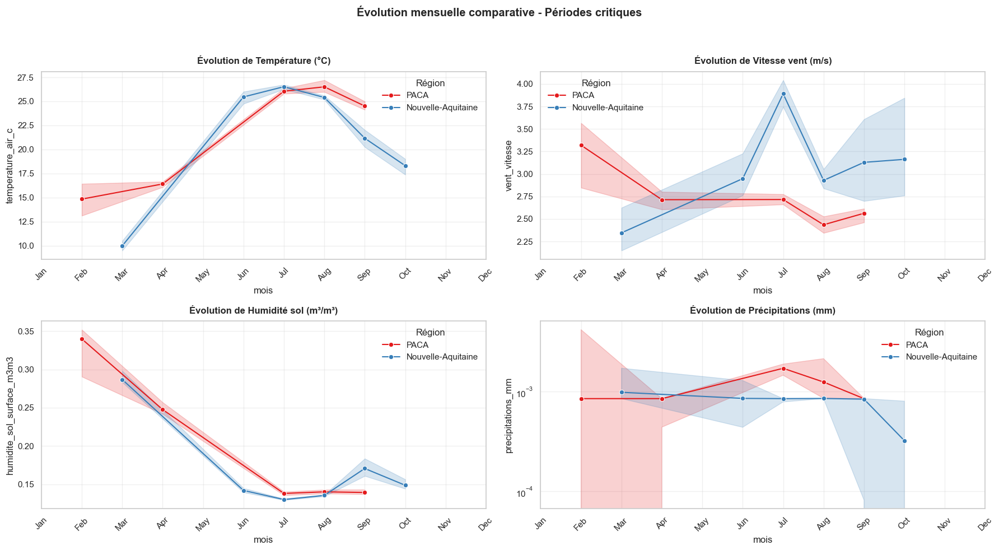

{'comparison_boxplots': <Figure size 1600x800 with 4 Axes>,
 'comparison_temporal': <Figure size 1800x1000 with 4 Axes>}

In [74]:
comparer_regions(df_na, df_paca)

### Analyse des Distributions Globales (Boxplots)

Cette première série de graphiques compare les conditions générales moyennes sur l'ensemble des périodes critiques pour chaque région.

#### **Température**
- **Observation** : La Nouvelle-Aquitaine présente une température médiane légèrement plus élevée que la PACA durant ses périodes critiques. Cependant, les deux régions affichent des distributions très similaires, avec des températures estivales très chaudes, dépassant fréquemment les 20-25°C.
- **Implication** : La chaleur est un facteur de risque fondamental et d'intensité comparable dans les deux régions.

#### **Vitesse du Vent**
- **Observation** : La différence est ici spectaculaire et fondamentale. La médiane de la vitesse du vent en PACA (environ 3.2 m/s) est nettement supérieure à celle de la Nouvelle-Aquitaine (environ 2.6 m/s). Plus important encore, la boîte et les "moustaches" de la PACA sont beaucoup plus étendues vers le haut, indiquant une fréquence et une intensité de vents forts bien plus grandes.
- **Implication** : Le vent est un facteur de risque structurellement plus dangereux en PACA. Il agit comme un accélérateur puissant beaucoup plus fréquemment.

#### **Humidité du Sol**
- **Observation** : Les deux régions montrent des niveaux d'humidité du sol très bas, avec des médianes inférieures à 0.15 m³/m³, ce qui est un seuil critique. La distribution en PACA est légèrement plus basse et plus resserrée, indiquant une sécheresse des sols un peu plus prononcée et constante.
- **Implication** : La sécheresse des sols est une condition de base dans les deux régions pendant les périodes critiques. Le danger lié à un sol sec est omniprésent dans les deux cas.

#### **Précipitations**
- **Observation** : Le graphique en échelle logarithmique montre que pour les deux régions, la médiane des précipitations est quasi nulle. La grande majorité des jours critiques sont des jours sans pluie. La boîte de la PACA est légèrement plus étendue vers le haut, ce qui suggère que, bien que rares, les quelques événements pluvieux peuvent y être un peu plus intenses.
- **Implication** : L'absence de pluie est la norme dans les deux régions pendant la saison des feux, garantissant un assèchement continu de la végétation.

---

### Analyse de l'Évolution Mensuelle Comparative

Cette seconde série de graphiques révèle comment les facteurs de risque évoluent et se combinent au fil des mois.

### **Évolution de la Température**
- **Observation** : Les deux courbes se superposent presque parfaitement, avec un pic de chaleur atteint en juillet et août dans les deux régions.
- **Implication** : Le calendrier du danger lié à la chaleur est identique. Le cœur du risque thermique se situe au milieu de l'été.

#### **Évolution de la Vitesse du Vent**
- **Observation** : C'est le graphique le plus révélateur. En Nouvelle-Aquitaine (en bleu), le vent est relativement stable et modéré tout l'été. En PACA (en rouge), on observe un pic de vent très net en juillet, qui coïncide parfaitement avec le pic de chaleur.
- **Implication** : La PACA fait face à un "cocktail explosif" en juillet : la chaleur maximale est combinée à la force maximale du vent. C'est cette superposition qui rend le risque d'incendie particulièrement élevé dans cette région.

#### **Évolution de l'Humidité du Sol**
- **Observation** : Les deux courbes montrent une chute drastique de l'humidité au début de l'été. Cependant, la courbe de la PACA (rouge) plonge plus tôt et atteint un niveau plancher dès le mois de juin, tandis que celle de la Nouvelle-Aquitaine continue de baisser jusqu'en août.
- **Implication** : La sécheresse des sols s'installe plus précocement en PACA, allongeant la "saison du danger". En août, les deux régions convergent vers un état de sécheresse extrême similaire.

#### **Évolution des Précipitations**
- **Observation** : Les deux courbes confirment une absence quasi totale de pluie durant les mois de juin, juillet et août. La courbe de la PACA montre une légère remontée en septembre, indiquant potentiellement des orages de fin d'été, mais la saison sèche estivale est bien marquée et ininterrompue dans les deux cas.
- **Implication** : Aucune des deux régions ne peut compter sur des pluies estivales pour atténuer le risque.

---

### Synthèse Comparative

#### **Profil de Risque Nouvelle-Aquitaine**
- **Description** : Le risque est principalement dicté par un "triptyque thermique" : une chaleur intense, une sécheresse des sols qui s'installe progressivement et une absence de pluie. Le vent y est un facteur secondaire. Le danger est maximal en juillet et août.

#### **Profil de Risque PACA**
- **Description** : Le risque est un "cocktail explosif" où le triptyque thermique est violemment amplifié par le vent. La sécheresse des sols est plus précoce et le pic de vent en juillet coïncide avec le pic de chaleur, créant les pires conditions possibles pour la propagation des feux. La saison de danger y est potentiellement plus longue.

---

---

#### 16. Analyse des Corrélations 

La fonction `analyser_correlations` explore les relations linéaires entre les variables météorologiques pendant les périodes critiques d’incendie. Elle permet d’identifier les couples de variables étroitement liés, utiles pour la modélisation ou l’interprétation physique des phénomènes.

#### But :
Analyser les dépendances linéaires entre les variables clés via une matrice de corrélation et des graphes de régression pour les couples fortement corrélés.

#### Paramètres :
- **df** : DataFrame contenant les variables météorologiques.
- **region_name** : Nom de la région (PACA ou Nouvelle-Aquitaine) utilisé pour les titres et noms de fichiers.

#### Variables Analysées

| Nom de la variable                   | Description                             | Unité    |
|--------------------------------------|-----------------------------------------|----------|
| temperature_air_c                    | Température de l’air                   | °C       |
| vent_vitesse                         | Vitesse moyenne du vent                | m/s      |
| humidite_sol_surface_m3m3           | Humidité du sol                        | m³/m³    |
| precipitations_mm                    | Précipitations                         | mm       |
| rayonnement_solaire_jm2              | Rayonnement solaire global             | J/m²     |
| evaporation_potentielle_mm          | Évaporation potentielle                | mm       |

Les variables absentes du DataFrame sont automatiquement exclues avec un message d’avertissement.

#### Résultats Produits :  

#### Matrice de Corrélation (correlation_matrix)
- Calcul du coefficient de corrélation de Pearson entre toutes les variables numériques.
- Affichage via heatmap triangulaire (échelle -1 à 1) :
  - Rouge = corrélation positive
  - Bleu = corrélation négative
- Annotations numériques (r) dans chaque case.

#### Visualisation des Couples Fortement Corrélés (strong_correlations)
- Identification des paires de variables ayant un \(|r| > 0.5\).
- Affichage jusqu’à 4 graphes de régression linéaire :
  - Nuage de points semi-transparent
  - Ligne de tendance en rouge
  - Titre du graphe : Nom variable 1 vs Nom variable 2 (r = ...)

#### Sauvegardes Automatiques
- Matrice de corrélation : `matrice_correlation.png`
- Corrélations fortes : `correlations_fortes.png`
  - Fichiers enregistrés dans le dossier de la région (`/paca` ou `/na`).


In [75]:
def analyser_correlations(df: pd.DataFrame, region_name: str) -> Dict[str, plt.Figure]:
    """Analyse approfondie des corrélations pour les périodes critiques
    
    Args:
        df: DataFrame contenant les données météo
        region_name: Nom de la région pour les titres
        
    Returns:
        Dictionnaire contenant les figures générées
    """
    print(f"\n{'='*50}\nANALYSE DES CORRÉLATIONS - {region_name.upper()}\n{'='*50}")
    
    # Variables d'intérêt pour les incendies
    variables = [
        'temperature_air_c', 
        'vent_vitesse',
        'humidite_sol_surface_m3m3', 
        'precipitations_mm',
        'rayonnement_solaire_jm2', 
        'evaporation_potentielle_mm'
    ]
    
    # Vérification des colonnes
    missing_vars = [var for var in variables if var not in df.columns]
    if missing_vars:
        print(f"Variables manquantes exclues: {missing_vars}")
        variables = [var for var in variables if var not in missing_vars]
    
    if len(variables) < 2:
        print("Pas assez de variables pour l'analyse des corrélations")
        return {}
    
    # Création des figures
    figures = {}
    
    # 1. Matrice de corrélation
    fig1 = plt.figure(figsize=(12, 10))
    corr = df[variables].corr(numeric_only=True)
    mask = np.triu(np.ones_like(corr, dtype=bool))
    
    sns.heatmap(corr, annot=True, cmap='coolwarm', center=0,
               vmin=-1, vmax=1, fmt=".2f", mask=mask,
               linewidths=0.5, cbar_kws={"shrink": .8})
    
    plt.title(f'Corrélations entre variables - {region_name}\n(Périodes critiques)', 
              fontweight='bold', pad=20)
    plt.tight_layout()
    
    region_key = 'paca' if 'paca' in region_name.lower() else 'na'
    save_and_show_figure(fig1, region_key, 'matrice_correlation')
    figures['correlation_matrix'] = fig1
    
    # 2. Paires de variables significatives (|corr| > 0.5)
    strong_corr = corr.unstack().sort_values(key=abs, ascending=False)
    strong_corr = strong_corr[abs(strong_corr) > 0.5]
    strong_corr = strong_corr[strong_corr.index.get_level_values(0) != strong_corr.index.get_level_values(1)]
    
    if not strong_corr.empty:
        print("\nCORRÉLATIONS FORTES (|r| > 0.5):")
        print(strong_corr.to_string(float_format="%.2f"))
        
        # Visualisation des relations fortes
        n_pairs = min(4, len(strong_corr))
        fig2, axes = plt.subplots(1, n_pairs, figsize=(5*n_pairs, 5))
        
        if n_pairs == 1:
            axes = [axes]
        
        for ax, (pair, r) in zip(axes, strong_corr.items()):
            var1, var2 = pair
            sns.regplot(x=var1, y=var2, data=df, 
                       scatter_kws={'alpha': 0.3}, 
                       line_kws={'color': 'red'}, ax=ax)
            ax.set_title(f"{var1} vs {var2}\n(r = {r:.2f})")
            ax.grid(True, alpha=0.3)
        
        fig2.suptitle("Relations entre variables fortement corrélées", fontweight='bold')
        plt.tight_layout()
        save_and_show_figure(fig2, region_key, 'correlations_fortes')
        figures['strong_correlations'] = fig2
    
    return figures

L'analyse des corrélations est fondamentale car elle révèle les "recettes" du danger. Elle montre comment les différents ingrédients météorologiques interagissent pour créer des conditions propices aux incendies. Les deux régions, bien que toutes deux à risque, présentent des "recettes" de danger distinctes.


#### 16.1. Analyse des Corrélations de la Provence-Alpes-Côte d’Azur


ANALYSE DES CORRÉLATIONS - PACA


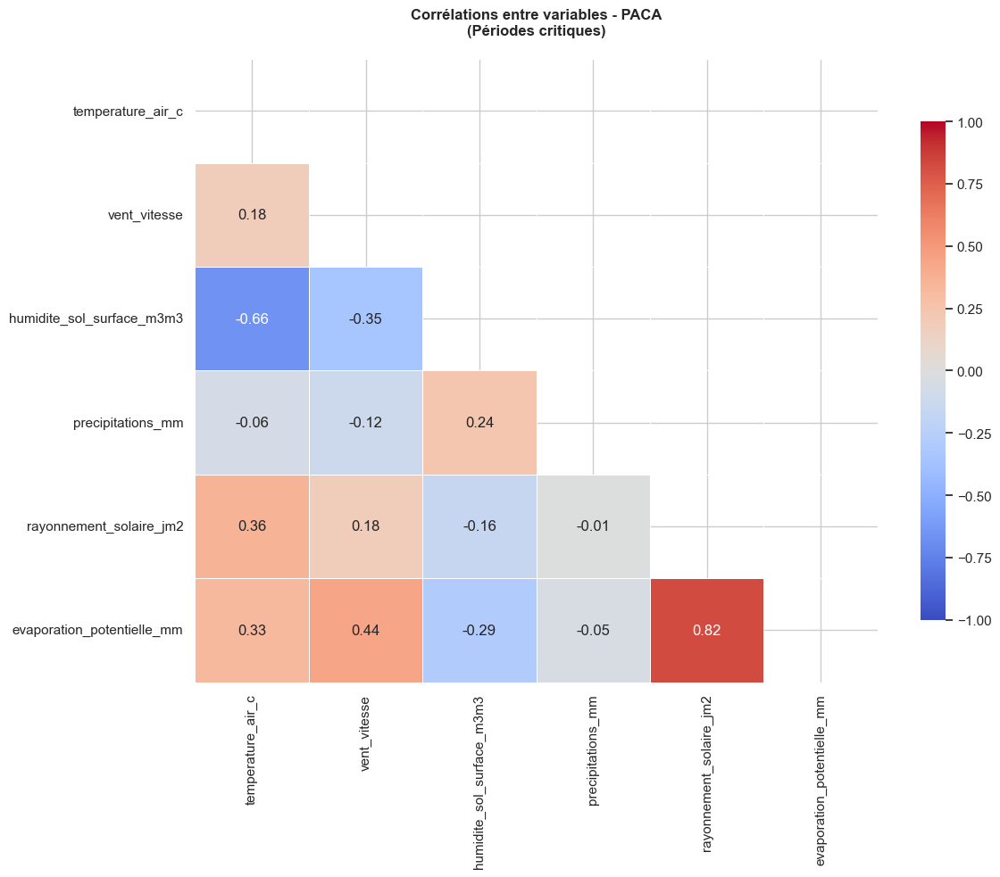


CORRÉLATIONS FORTES (|r| > 0.5):
rayonnement_solaire_jm2     evaporation_potentielle_mm    0.82
evaporation_potentielle_mm  rayonnement_solaire_jm2       0.82
temperature_air_c           humidite_sol_surface_m3m3    -0.66
humidite_sol_surface_m3m3   temperature_air_c            -0.66


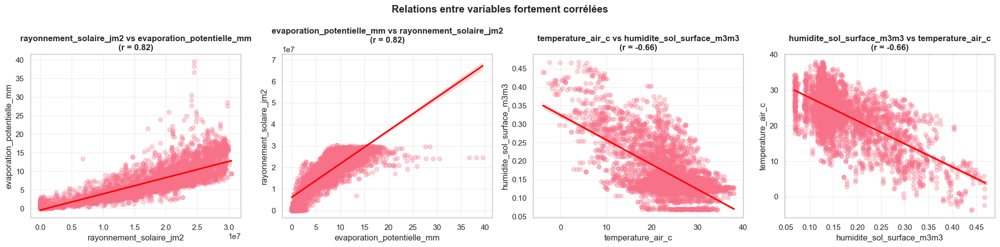

{'correlation_matrix': <Figure size 1200x1000 with 2 Axes>,
 'strong_correlations': <Figure size 2000x500 with 4 Axes>}

In [76]:
analyser_correlations(df_paca, "PACA")

La matrice pour la région PACA révèle un profil de risque beaucoup plus complexe et agressif, où plusieurs facteurs interagissent puissamment.

### **Analyse de la Matrice de Corrélation**

#### Corrélation Très Forte (r = 0.82) : Rayonnement Solaire ↔ Évaporation Potentielle
- **Observation** : Le lien entre l'ensoleillement et l'évaporation est encore plus fort qu'en Nouvelle-Aquitaine. Il est quasi linéaire.
- **Implication** : Le soleil est le moteur absolument dominant de l'assèchement de la végétation.

#### Corrélation Forte (r = -0.66) : Température ↔ Humidité du Sol
- **Observation** : C'est une corrélation forte et très significative. La relation entre la hausse de la température et la baisse de l'humidité du sol est beaucoup plus marquée qu'en Nouvelle-Aquitaine.
- **Implication** : En PACA, chaque degré de chaleur supplémentaire a un impact direct et puissant sur l'assèchement du sol. Les vagues de chaleur y sont donc particulièrement dangereuses.

#### Le Rôle Actif du Vent : Une Différence Capitale
- **Observation** : Contrairement à la Nouvelle-Aquitaine, le vent en PACA est positivement corrélé avec la température (r = 0.18), le rayonnement (r = 0.18) et surtout l'évaporation (r = 0.44).
- **Implication** : C'est la signature du Mistral et des brises thermiques. En PACA, le vent agit comme un "sèche-cheveux". Non seulement il souffle, mais il est souvent associé à des conditions chaudes et ensoleillées, et il accélère activement l'évaporation. Il ne se contente pas de pousser le feu, il participe activement à la préparation du combustible en l'asséchant.

### **Synthèse du Profil de Risque (PACA)**

Le danger en PACA suit une logique de "cuisson au grill avec un chalumeau". Le soleil et la chaleur créent une base de sécheresse intense (lien température-humidité très fort). Mais le vent vient s'ajouter comme un ingrédient actif, non seulement en attisant les flammes, mais en accélérant l'assèchement (lien vent-évaporation). C'est cette synergie entre le thermique (chaleur, soleil) et l'aéraulique (vent) qui rend le profil de risque de la PACA si explosif.

---

#### 16.2. Analyse des Corrélations de la Nouvelle-Aquaitain


ANALYSE DES CORRÉLATIONS - NOUVELLE-AQUAITAIN


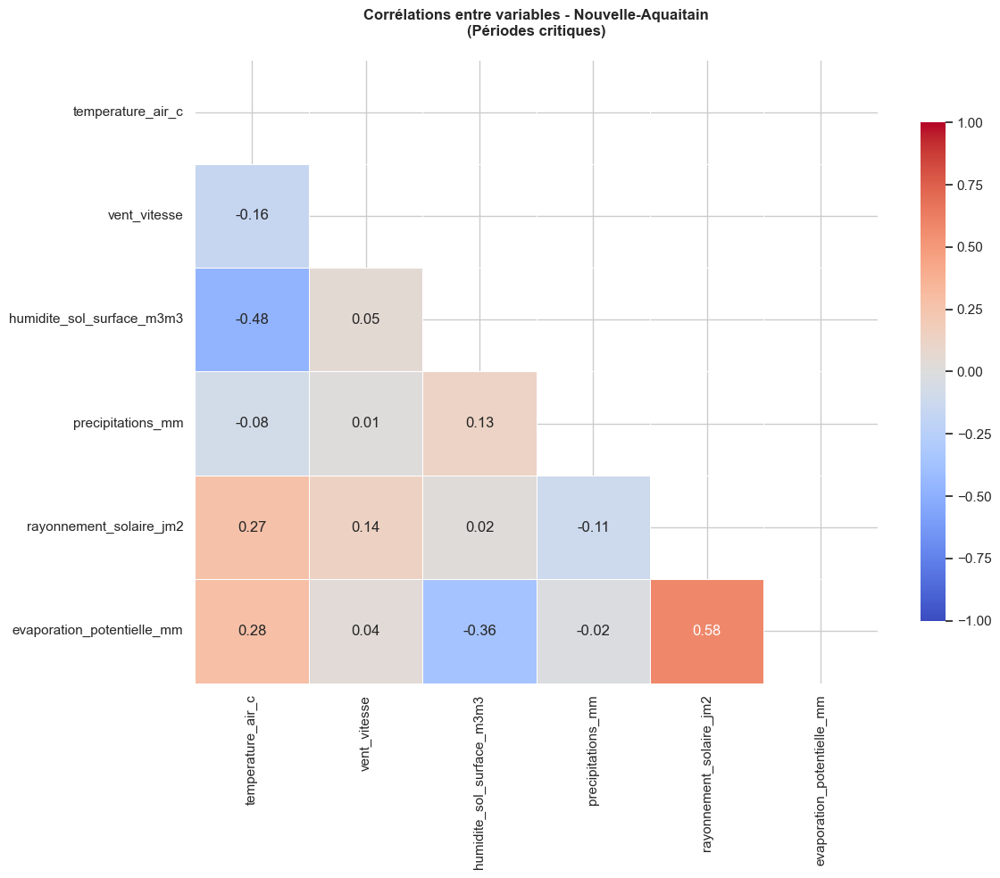


CORRÉLATIONS FORTES (|r| > 0.5):
rayonnement_solaire_jm2     evaporation_potentielle_mm   0.58
evaporation_potentielle_mm  rayonnement_solaire_jm2      0.58


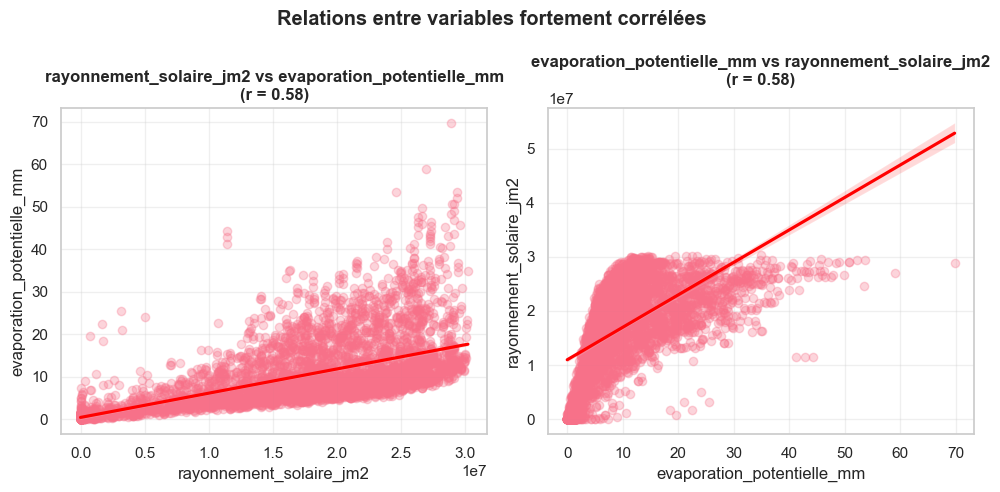

{'correlation_matrix': <Figure size 1200x1000 with 2 Axes>,
 'strong_correlations': <Figure size 1000x500 with 2 Axes>}

In [77]:
analyser_correlations(df_na, "Nouvelle-Aquaitain")

La matrice de corrélation pour la Nouvelle-Aquitaine montre un profil de risque principalement dominé par les facteurs thermiques et hydriques.

### **Analyse de la Matrice de Corrélation**

#### Corrélation Forte (r = 0.58) : Rayonnement Solaire ↔ Évaporation Potentielle
- **Observation** : C'est la seule corrélation forte dans cette région. Il y a un lien direct et puissant entre la quantité d'énergie solaire reçue et la "soif" de l'atmosphère.
- **Implication** : Le moteur principal de l'assèchement de la végétation en Nouvelle-Aquitaine est l'ensoleillement. Les journées très ensoleillées sont des journées où l'atmosphère "pompe" activement l'eau des plantes, augmentant leur inflammabilité.

#### Corrélation Modérée (r = -0.48) : Température ↔ Humidité du Sol
- **Observation** : Quand la température augmente, l'humidité du sol diminue.
- **Implication** : C'est le cœur du processus de sécheresse estivale. La chaleur persistante vide progressivement les réserves d'eau du sol. Cette relation, bien que non "forte" au sens statistique, est cruciale pour le risque d'incendie.

#### Corrélation Faible : Le Rôle Limité du Vent
- **Observation** : Le vent n'est fortement corrélé avec aucune autre variable. Sa corrélation avec la température est même légèrement négative (-0.16).
- **Implication** : En Nouvelle-Aquitaine, le vent n'est pas le principal moteur du danger. Les jours les plus chauds ne sont pas forcément les plus venteux. Le risque peut donc être élevé même par vent modéré, simplement à cause de la chaleur et de la sécheresse.

### **Synthèse du Profil de Risque (Nouvelle-Aquitaine)**

Le danger en Nouvelle-Aquitaine suit une logique de "cuisson lente". Le soleil (rayonnement) est le principal ingrédient qui fait monter l'évaporation. Cette évaporation, combinée à la chaleur (température), assèche progressivement le sol et la végétation (baisse de l'humidité). Le vent n'est pas un ingrédient clé de la recette, mais il peut attiser les flammes une fois le "plat" (la forêt) suffisamment sec.
